# Directed

## PClam

In [ ]:

# todo: run all of the experiments below with pclam
#todo: make the sanity work dammit


## PieClam

In [3]:
import os

import torch

import optimization_utils_directed as ou

import sys
if '..' not in sys.path:
    sys.path.insert(0, '..')


from datasets.import_dataset import import_dataset
from trainer_directed import Trainer
from utils.plotting import *


#todo: experiment for every dataset, ogb experiment with val and a val experiment for photo or something

#todo: make one trainer run, no crossval. seems like everything is ok with the link prediction. run the texas dataset

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'device = {device}')


%load_ext autoreload
%autoreload 2

device = cpu
The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## AUC

### Texas

#### IeClam



/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../datasets/import_dataset.py:248:::  
end of import_dataset
texas 
has 183 nodes 
and 325 edges. 
Graph is directed
Graph has self loops


/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../trainer_directed.py:154:::  



Using global config base





/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../trainer_directed.py:337:::  

In function train. 
2025-10-29 21:57:48 starting optimization of bigclam on texas (DIRECTED) on device cpu

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 56,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 10000,
        "early_stop": 0
    }
}


/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/exper

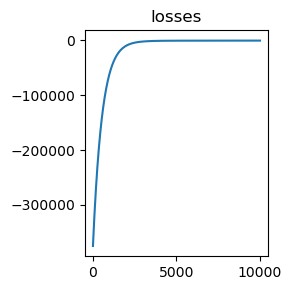

 TEST accuracy.
Latest:
losses: -455.222900390625 
Best:
losses: -455.222900390625 at iteration 9999


/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../trainer_directed.py:444:::  



FINISHED train 
 last accuracies:
test
key='losses': -455.222900390625




/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../trainer_directed.py:460:::  

train_model_on_params on bigclam texas 
took 11.363798141479492 seconds


In [5]:
ds = import_dataset('texas', 
                    to_undirected= False, 
                    remove_self_loops=False)

config_triplets = [['clamiter_init', 'dim_feat', 56],
['feat_opt', 'lr', 5e-6],
['feat_opt', 'n_iter', 10000]]

#todo: when i didnt switch the features in the reparametrization version it was the same as here which suggests that the error is here with not switching the features
trainer = Trainer(
        dataset=ds,
        model_name='bigclam',
        task='',
        config_triplets_to_change=config_triplets,
        use_global_config_base=True,
        attr_opt=False,
        metric='auc',
        device=device
)

losses, acc_test, acc_val = trainer.train(
            init_type='small_gaus',
            init_feats=True,
            acc_every=200,
            plot_every=-1,
            verbose=False,
            verbose_in_funcs=False
        )


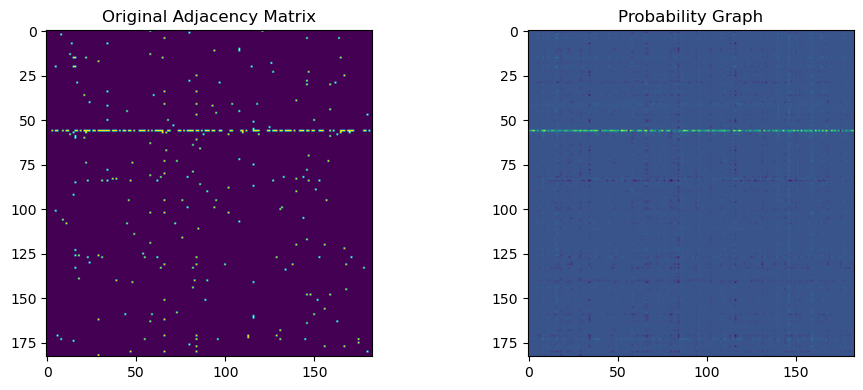

In [6]:
mat1 = to_dense_adj(ds.edge_index)
mat2 = get_prob_graph(trainer.data, True)

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,4))

# Plot first matrix
ax1.imshow(mat1.squeeze())
ax1.set_title('Original Adjacency Matrix')

# Plot second matrix 
ax2.imshow(mat2.squeeze())
ax2.set_title('Probability Graph')

plt.tight_layout()
plt.show()


In [19]:
from torch_geometric.datasets import Planetoid
ds = Planetoid(root='../datasets/Planetoid', name='Cora')

In [23]:
ds[0].is_undirected()

True

In [ ]:

#DECIDE ON A MODEL AND DATASET
model_name = 'pieclam'
ds_name = 'citeseer'

# SET RANGE PARAMETERS
use_global_config_base = True
densify = True
attr_opt = False

n_reps = 3

'''to do cross validation, give a list of parameters for every one of the parameters as given in the following'''
#todo: maybe limit the number of iterations * lr? or at least iterate on that and not different lr and num iterations
dim_feats = [56,120, 172, 252]
n_iters_feats = [1500, 5000, 14000] 
lr_feats = [3e-6, 1e-6]
l1_regs = [0.01, 0.1, 0.3]
s_regs = [0.0, 0.1]
range_triplets = [
    ['clamiter_init','s_reg', s_regs],
    ['clamiter_init','l1_reg', l1_regs],
    ['clamiter_init', 'dim_feat', dim_feats],
    ['feat_opt','n_iter', n_iters_feats],
    ['feat_opt','lr', lr_feats],
    ]

# if model_name in ['pclam', 'pieclam']:
#     range_triplets += [
#         ['back_forth', 'first_func_in_fit', first_funcs_in_fit],
#         ['prior_opt','n_iter', n_iters_prior],
#         ['prior_opt','lr', lr_prior],
#         ['prior_opt','noise_amp', noise_amps],
#         ['back_forth','n_back_forth', n_back_forth]
#     ]

'''another method is to give a list of perturbations to the base config'''
#! when i do the deltas the parameters arent saved
# deltas ={
# # 'clamiter_init': {'s_reg': 0.001,
# #                   'l1_reg': 0.001,
# #                   'dim_feat': 2},
# # 'feat_opt': {'n_iter': 50,
# #             'lr': 0.0000001},
# # 'prior_opt': {'n_iter': 50,
# #               'lr': 0.0000001,
# #               'noise_amp': 0.005},
# 'back_forth': {'scheduler_gamma' : 0.1}
# }

# range_triplets = ou.perturb_config('link_prediction',
#                                    ds_name, 
#                                    model_name, 
#                                    deltas, 
#                                    use_global_config=use_global_config_base)

#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
#todo: unify the link splits!
trainer = ou.cross_val_link(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=range_triplets,
    use_global_config_base=False,
    densify=True,
    attr_opt=attr_opt,
    metric='auc',
    n_reps=n_reps,
    acc_every=100,
    device=device,
    plot_every= -1,
    test_p=0.0,
    val_p=0.05,
    to_undirected=False,
    remove_self_loops=False
    )
#test that texas still works




/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../datasets/import_dataset.py:258:::  
end of import_dataset
citeseer 
has 4230 nodes 
and 5358 edges. 
Graph is directed
Graph has NO self loops


/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/optimization_utils_directed.py:637:::  
RunSaver defined to acc_configs path /Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/results/directed/link_prediction/auc/citeseer/pieclam/split_21-00_11-12-25/valid/acc_configs21-00_11-12-25.json


/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/optimization_utils_directed.py:662:::  
Repetition no. 0


/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../trainer_directed.py:158:::  

Using dataset specific configuration and not global 




/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../trainer_directed.py:337:::  

In 

In [2]:
range_triplets = []
ou.cross_val_link_splits(
    ds_name='texas',
    model_name='ieclam',
    range_triplets=range_triplets,
    use_global_config_base=False,
    attr_opt=False,
    metric='auc',
    n_reps=1,
    acc_every=100,
    device=device,
    plot_every= -1,
    val_p=0.0,
    to_undirected=False,
    remove_self_loops=False
    )


TypeError: cross_val_link_splits() got an unexpected keyword argument 'to_undirected'

In [18]:
trainer.data.x
adj = get_prob_graph(trainer.data, True)

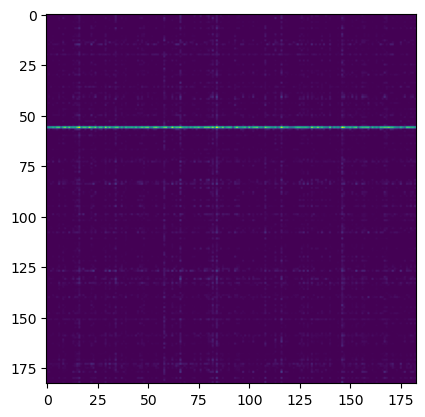

In [19]:
plt.imshow(adj)

In [11]:
#why are the sender features so much bigger? how do i init feats? need a function to plot the sender and receiver features
trainer.data.x


NameError: name 'trainer' is not defined

# Undirected

In [1]:
import os

import torch

# local
import optimization_utils as ou

import sys
if '..' not in sys.path:
    sys.path.insert(0, '..')


from datasets.import_dataset import import_dataset
from trainer import Trainer
from utils.plotting import *


#todo: experiment for every dataset, ogb experiment with val and a val experiment for photo or something

#todo: make one trainer run, no crossval. seems like everything is ok with the link prediction. run the texas dataset

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'device = {device}')


%load_ext autoreload
%autoreload 2

/Users/danielzilberg/anaconda3/envs/pyg/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


device = cpu


Parameters:
- There is a global parameter config for each model and one for every dataset in experiments/hypers.
- The individual dataset parameter config's values replace the appropriate fields in the global config. if a field is not given, the parameter is the same as in the global config.
- The user can provide triplets according to the fields of config dict and they will replace the global or dataset parameters. The config triplets are given as lists to crossval over.

Training goes as follows: 
1. omit both validation and test sets.
2. collect scores from different test sets where the validation set is sampled randomly at every iteration.
3. take the maximal validation parameters and train the model on the combined training and validation set.
4. report the test score 

## OGB H@20

### IeClam

In [50]:
#DDI ieclam h@20
#DECIDE ON A MODEL AND DATASET
model_name = 'ieclam'
ds_name = 'ogbl-ddi'

# SET RANGE PARAMETERS
use_global_config_base = True
densify = False
attr_opt = False
test_p = 0.1
val_p = 0.0
n_reps = 1

'''to do cross validation, give a list of parameters for every one of the parameters as given in the following'''
dim_feats = [120, 170]
n_iters_feats = [14000] 
lr_feats = [3e-6, 5*1e-6, 1e-5]
l1_regs = [0.1, 0.5, 0.7]
s_regs = [0.0, 0.1]
range_triplets = [
    # ['clamiter_init','s_reg', s_regs],
    # ['clamiter_init','l1_reg', l1_regs],
    ['clamiter_init', 'dim_feat', dim_feats],
    ['feat_opt','n_iter', n_iters_feats],
    ['feat_opt','lr', lr_feats],
    ]

# if model_name in ['pclam', 'pieclam']:
#     range_triplets += [
#         ['back_forth', 'first_func_in_fit', first_funcs_in_fit],
#         ['prior_opt','n_iter', n_iters_prior],
#         ['prior_opt','lr', lr_prior],
#         ['prior_opt','noise_amp', noise_amps],
#         ['back_forth','n_back_forth', n_back_forth]
#     ]

'''another method is to give a list of perturbations to the base config'''
#! when i do the deltas the parameters arent saved
# deltas ={
# # 'clamiter_init': {'s_reg': 0.001,
# #                   'l1_reg': 0.001,
# #                   'dim_feat': 2},
# # 'feat_opt': {'n_iter': 50,
# #             'lr': 0.0000001},
# # 'prior_opt': {'n_iter': 50,
# #               'lr': 0.0000001,
# #               'noise_amp': 0.005},
# 'back_forth': {'scheduler_gamma' : 0.1}
# }

# range_triplets = ou.perturb_config('link_prediction',
#                                    ds_name, 
#                                    model_name, 
#                                    deltas, 
#                                    use_global_config=use_global_config_base)

#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
ou.cross_val_link(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=range_triplets,
    use_global_config_base=use_global_config_base,
    densify=densify,
    attr_opt=attr_opt,
    metric='ogb_hAk',
    n_reps=n_reps,
    acc_every=100,
    device=device,
    plot_every= 7000
    )
#test that texas still works




/home/user/Documents/danny/AAAI_pieclam/experiments/optimization_utils.py:500:::  

Finished CrossVal!




KeyboardInterrupt: 



/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:25:00 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 3e-06,
        "n_iter": 14000,
        "early_stop": 0
    }
}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:364:::  staring fit_feats for 14000 iterations


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6999


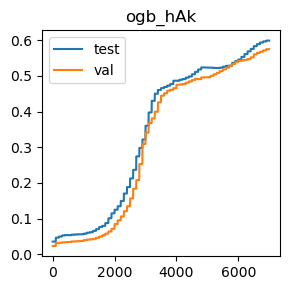

Last Validation Scores: {'ogb_hAk': 0.5747514776498438}
Best Validation Scores: {'ogb_hAk': 0.5747514776498438} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.5986935253092015}
Best Test Scores: {'ogb_hAk': 0.5986935253092015} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


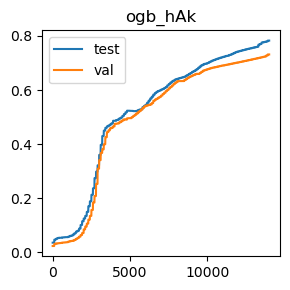

Last Validation Scores: {'ogb_hAk': 0.731558405561507}
Best Validation Scores: {'ogb_hAk': 0.731558405561507} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.7827536351309846}
Best Test Scores: {'ogb_hAk': 0.7827536351309846} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.7827536351309846
val
key='ogb_hAk': 0.731558405561507


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:34:32 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 4.9999999999999996e-06,
        "n_iter": 14

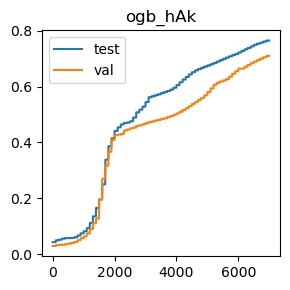

Last Validation Scores: {'ogb_hAk': 0.7093693113290234}
Best Validation Scores: {'ogb_hAk': 0.7093693113290234} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.7644599929582213}
Best Test Scores: {'ogb_hAk': 0.7644599929582213} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


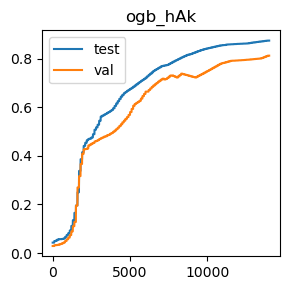

Last Validation Scores: {'ogb_hAk': 0.8121792806897946}
Best Validation Scores: {'ogb_hAk': 0.8121792806897946} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.874109477185386}
Best Test Scores: {'ogb_hAk': 0.874109477185386} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.874109477185386
val
key='ogb_hAk': 0.8121792806897946


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:44:04 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 14000,
        "ear

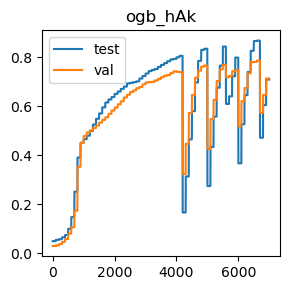

Last Validation Scores: {'ogb_hAk': 0.7144408902606207}
Best Validation Scores: {'ogb_hAk': 0.7874731251264149} at iterations {'ogb_hAk': 6600}
Last Test Scores: {'ogb_hAk': 0.7100285416775914}
Best Test Scores: {'ogb_hAk': 0.8690154244919057} at iterations {'ogb_hAk': 6600}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


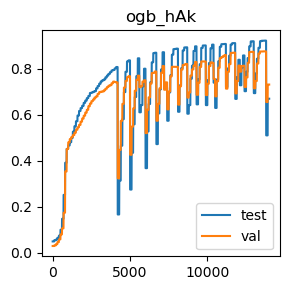

Last Validation Scores: {'ogb_hAk': 0.7307193851178749}
Best Validation Scores: {'ogb_hAk': 0.8749484976290182} at iterations {'ogb_hAk': 13700}
Last Test Scores: {'ogb_hAk': 0.6692461551139045}
Best Test Scores: {'ogb_hAk': 0.9215965360441685} at iterations {'ogb_hAk': 13700}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.6692461551139045
val
key='ogb_hAk': 0.7307193851178749


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:53:36 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 3e-06,
        "n_iter": 14000,
        "

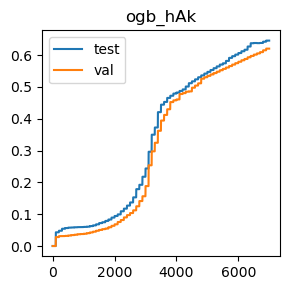

Last Validation Scores: {'ogb_hAk': 0.620410670542142}
Best Validation Scores: {'ogb_hAk': 0.620410670542142} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.6456187401209088}
Best Test Scores: {'ogb_hAk': 0.6456187401209088} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


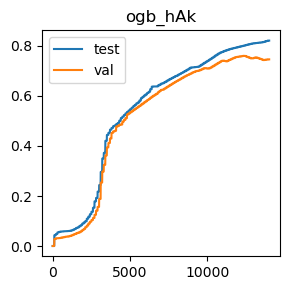

Last Validation Scores: {'ogb_hAk': 0.746488474705781}
Best Validation Scores: {'ogb_hAk': 0.760504610866813} at iterations {'ogb_hAk': 12300}
Last Test Scores: {'ogb_hAk': 0.8215433481410453}
Best Test Scores: {'ogb_hAk': 0.8215433481410453} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.8215433481410453
val
key='ogb_hAk': 0.746488474705781


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 05:06:49 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 4.9999999999999996e-06,
        "n_iter": 14

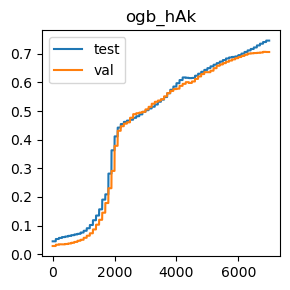

Last Validation Scores: {'ogb_hAk': 0.7061930196495592}
Best Validation Scores: {'ogb_hAk': 0.7066424948872192} at iterations {'ogb_hAk': 6800}
Last Test Scores: {'ogb_hAk': 0.746001543198316}
Best Test Scores: {'ogb_hAk': 0.746001543198316} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


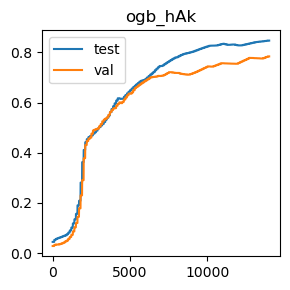

Last Validation Scores: {'ogb_hAk': 0.7842968334469507}
Best Validation Scores: {'ogb_hAk': 0.7842968334469507} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.8473057705129261}
Best Test Scores: {'ogb_hAk': 0.8473057705129261} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.8473057705129261
val
key='ogb_hAk': 0.7842968334469507


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 05:20:02 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 14000,
        "

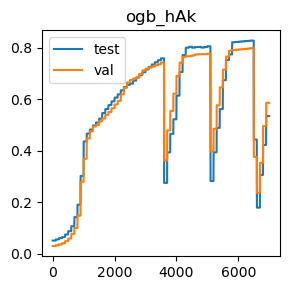

Last Validation Scores: {'ogb_hAk': 0.5861232011626426}
Best Validation Scores: {'ogb_hAk': 0.7980133194495427} at iterations {'ogb_hAk': 6400}
Last Test Scores: {'ogb_hAk': 0.5347556727520619}
Best Test Scores: {'ogb_hAk': 0.8271617886117957} at iterations {'ogb_hAk': 6400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


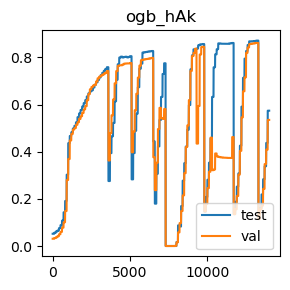

Last Validation Scores: {'ogb_hAk': 0.5348680415614769}
Best Validation Scores: {'ogb_hAk': 0.8612919416581142} at iterations {'ogb_hAk': 13200}
Last Test Scores: {'ogb_hAk': 0.5740248260156268}
Best Test Scores: {'ogb_hAk': 0.8712777831881279} at iterations {'ogb_hAk': 13200}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.5740248260156268
val
key='ogb_hAk': 0.5348680415614769


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/optimization_utils.py:494:::  

Finished CrossVal!




In [ ]:
#DDI ieclam h@20
#DECIDE ON A MODEL AND DATASET
model_name = 'ieclam'
ds_name = 'ogbl-ddi'

# SET RANGE PARAMETERS
use_global_config_base = True
densify = False
attr_opt = False
test_p = 0.1
val_p = 0.0
n_reps = 1

'''to do cross validation, give a list of parameters for every one of the parameters as given in the following'''
dim_feats = [120, 170]
n_iters_feats = [14000] 
lr_feats = [3e-6, 5*1e-6, 1e-5]
l1_regs = [0.1, 0.5, 0.7]
s_regs = [0.0, 0.1]
range_triplets = [
    # ['clamiter_init','s_reg', s_regs],
    # ['clamiter_init','l1_reg', l1_regs],
    ['clamiter_init', 'dim_feat', dim_feats],
    ['feat_opt','n_iter', n_iters_feats],
    ['feat_opt','lr', lr_feats],
    ]

# if model_name in ['pclam', 'pieclam']:
#     range_triplets += [
#         ['back_forth', 'first_func_in_fit', first_funcs_in_fit],
#         ['prior_opt','n_iter', n_iters_prior],
#         ['prior_opt','lr', lr_prior],
#         ['prior_opt','noise_amp', noise_amps],
#         ['back_forth','n_back_forth', n_back_forth]
#     ]

'''another method is to give a list of perturbations to the base config'''
#! when i do the deltas the parameters arent saved
# deltas ={
# # 'clamiter_init': {'s_reg': 0.001,
# #                   'l1_reg': 0.001,
# #                   'dim_feat': 2},
# # 'feat_opt': {'n_iter': 50,
# #             'lr': 0.0000001},
# # 'prior_opt': {'n_iter': 50,
# #               'lr': 0.0000001,
# #               'noise_amp': 0.005},
# 'back_forth': {'scheduler_gamma' : 0.1}
# }

# range_triplets = ou.perturb_config('link_prediction',
#                                    ds_name, 
#                                    model_name, 
#                                    deltas, 
#                                    use_global_config=use_global_config_base)

#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
ou.cross_val_link(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=range_triplets,
    use_global_config_base=use_global_config_base,
    densify=densify,
    attr_opt=attr_opt,
    metric='ogb_hAk',
    n_reps=n_reps,
    acc_every=100,
    device=device,
    plot_every= 7000
    )
#test that texas still works




/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:25:00 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 3e-06,
        "n_iter": 14000,
        "early_stop": 0
    }
}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:364:::  staring fit_feats for 14000 iterations


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6999


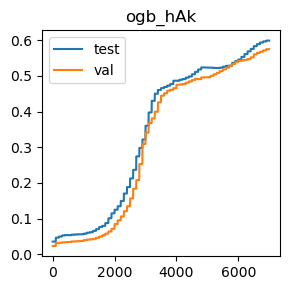

Last Validation Scores: {'ogb_hAk': 0.5747514776498438}
Best Validation Scores: {'ogb_hAk': 0.5747514776498438} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.5986935253092015}
Best Test Scores: {'ogb_hAk': 0.5986935253092015} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


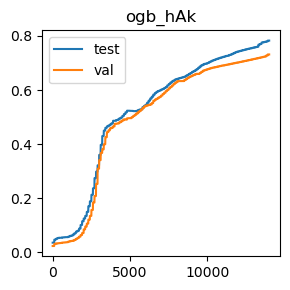

Last Validation Scores: {'ogb_hAk': 0.731558405561507}
Best Validation Scores: {'ogb_hAk': 0.731558405561507} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.7827536351309846}
Best Test Scores: {'ogb_hAk': 0.7827536351309846} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.7827536351309846
val
key='ogb_hAk': 0.731558405561507


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:34:32 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 4.9999999999999996e-06,
        "n_iter": 14

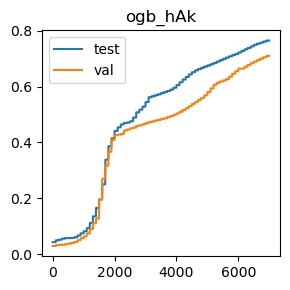

Last Validation Scores: {'ogb_hAk': 0.7093693113290234}
Best Validation Scores: {'ogb_hAk': 0.7093693113290234} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.7644599929582213}
Best Test Scores: {'ogb_hAk': 0.7644599929582213} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


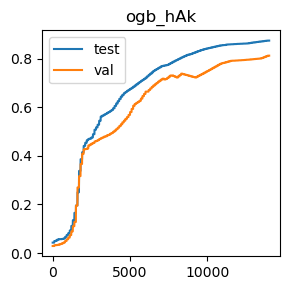

Last Validation Scores: {'ogb_hAk': 0.8121792806897946}
Best Validation Scores: {'ogb_hAk': 0.8121792806897946} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.874109477185386}
Best Test Scores: {'ogb_hAk': 0.874109477185386} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.874109477185386
val
key='ogb_hAk': 0.8121792806897946


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:44:04 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 14000,
        "ear

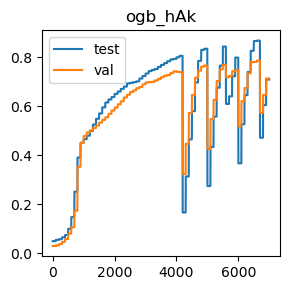

Last Validation Scores: {'ogb_hAk': 0.7144408902606207}
Best Validation Scores: {'ogb_hAk': 0.7874731251264149} at iterations {'ogb_hAk': 6600}
Last Test Scores: {'ogb_hAk': 0.7100285416775914}
Best Test Scores: {'ogb_hAk': 0.8690154244919057} at iterations {'ogb_hAk': 6600}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


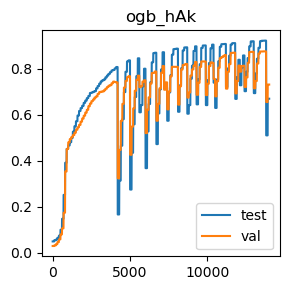

Last Validation Scores: {'ogb_hAk': 0.7307193851178749}
Best Validation Scores: {'ogb_hAk': 0.8749484976290182} at iterations {'ogb_hAk': 13700}
Last Test Scores: {'ogb_hAk': 0.6692461551139045}
Best Test Scores: {'ogb_hAk': 0.9215965360441685} at iterations {'ogb_hAk': 13700}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.6692461551139045
val
key='ogb_hAk': 0.7307193851178749


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:53:36 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 3e-06,
        "n_iter": 14000,
        "

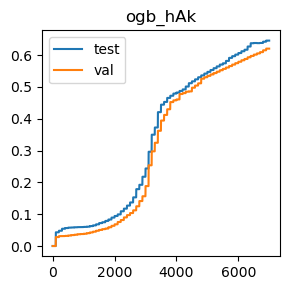

Last Validation Scores: {'ogb_hAk': 0.620410670542142}
Best Validation Scores: {'ogb_hAk': 0.620410670542142} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.6456187401209088}
Best Test Scores: {'ogb_hAk': 0.6456187401209088} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


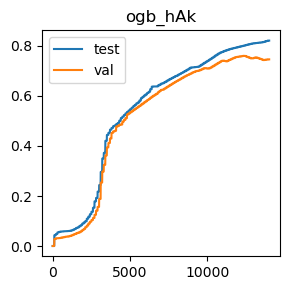

Last Validation Scores: {'ogb_hAk': 0.746488474705781}
Best Validation Scores: {'ogb_hAk': 0.760504610866813} at iterations {'ogb_hAk': 12300}
Last Test Scores: {'ogb_hAk': 0.8215433481410453}
Best Test Scores: {'ogb_hAk': 0.8215433481410453} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.8215433481410453
val
key='ogb_hAk': 0.746488474705781


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 05:06:49 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 4.9999999999999996e-06,
        "n_iter": 14

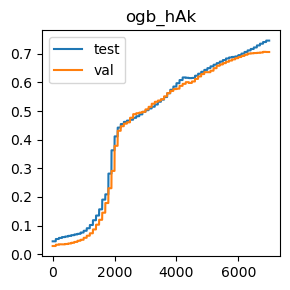

Last Validation Scores: {'ogb_hAk': 0.7061930196495592}
Best Validation Scores: {'ogb_hAk': 0.7066424948872192} at iterations {'ogb_hAk': 6800}
Last Test Scores: {'ogb_hAk': 0.746001543198316}
Best Test Scores: {'ogb_hAk': 0.746001543198316} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


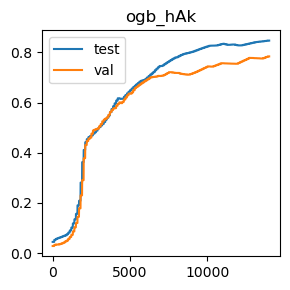

Last Validation Scores: {'ogb_hAk': 0.7842968334469507}
Best Validation Scores: {'ogb_hAk': 0.7842968334469507} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.8473057705129261}
Best Test Scores: {'ogb_hAk': 0.8473057705129261} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.8473057705129261
val
key='ogb_hAk': 0.7842968334469507


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 05:20:02 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 14000,
        "

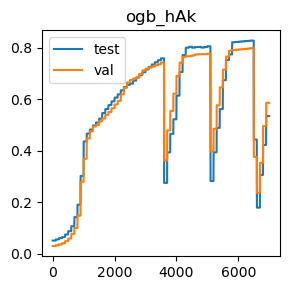

Last Validation Scores: {'ogb_hAk': 0.5861232011626426}
Best Validation Scores: {'ogb_hAk': 0.7980133194495427} at iterations {'ogb_hAk': 6400}
Last Test Scores: {'ogb_hAk': 0.5347556727520619}
Best Test Scores: {'ogb_hAk': 0.8271617886117957} at iterations {'ogb_hAk': 6400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


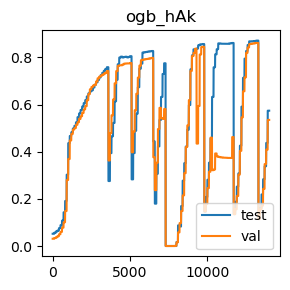

Last Validation Scores: {'ogb_hAk': 0.5348680415614769}
Best Validation Scores: {'ogb_hAk': 0.8612919416581142} at iterations {'ogb_hAk': 13200}
Last Test Scores: {'ogb_hAk': 0.5740248260156268}
Best Test Scores: {'ogb_hAk': 0.8712777831881279} at iterations {'ogb_hAk': 13200}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.5740248260156268
val
key='ogb_hAk': 0.5348680415614769


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/optimization_utils.py:494:::  

Finished CrossVal!




In [ ]:
#DDI ieclam h@20
#DECIDE ON A MODEL AND DATASET
model_name = 'ieclam'
ds_name = 'ogbl-ddi'

# SET RANGE PARAMETERS
use_global_config_base = True
densify = False
attr_opt = False
test_p = 0.1
val_p = 0.0
n_reps = 1

'''to do cross validation, give a list of parameters for every one of the parameters as given in the following'''
dim_feats = [120, 170]
n_iters_feats = [14000] 
lr_feats = [3e-6, 5*1e-6, 1e-5]
l1_regs = [0.1, 0.5, 0.7]
s_regs = [0.0, 0.1]
range_triplets = [
    # ['clamiter_init','s_reg', s_regs],
    # ['clamiter_init','l1_reg', l1_regs],
    ['clamiter_init', 'dim_feat', dim_feats],
    ['feat_opt','n_iter', n_iters_feats],
    ['feat_opt','lr', lr_feats],
    ]

# if model_name in ['pclam', 'pieclam']:
#     range_triplets += [
#         ['back_forth', 'first_func_in_fit', first_funcs_in_fit],
#         ['prior_opt','n_iter', n_iters_prior],
#         ['prior_opt','lr', lr_prior],
#         ['prior_opt','noise_amp', noise_amps],
#         ['back_forth','n_back_forth', n_back_forth]
#     ]

'''another method is to give a list of perturbations to the base config'''
#! when i do the deltas the parameters arent saved
# deltas ={
# # 'clamiter_init': {'s_reg': 0.001,
# #                   'l1_reg': 0.001,
# #                   'dim_feat': 2},
# # 'feat_opt': {'n_iter': 50,
# #             'lr': 0.0000001},
# # 'prior_opt': {'n_iter': 50,
# #               'lr': 0.0000001,
# #               'noise_amp': 0.005},
# 'back_forth': {'scheduler_gamma' : 0.1}
# }

# range_triplets = ou.perturb_config('link_prediction',
#                                    ds_name, 
#                                    model_name, 
#                                    deltas, 
#                                    use_global_config=use_global_config_base)

#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
ou.cross_val_link(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=range_triplets,
    use_global_config_base=use_global_config_base,
    densify=densify,
    attr_opt=attr_opt,
    metric='ogb_hAk',
    n_reps=n_reps,
    acc_every=100,
    device=device,
    plot_every= 7000
    )
#test that texas still works




/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:25:00 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 3e-06,
        "n_iter": 14000,
        "early_stop": 0
    }
}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:364:::  staring fit_feats for 14000 iterations


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6999


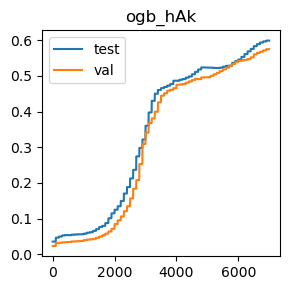

Last Validation Scores: {'ogb_hAk': 0.5747514776498438}
Best Validation Scores: {'ogb_hAk': 0.5747514776498438} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.5986935253092015}
Best Test Scores: {'ogb_hAk': 0.5986935253092015} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


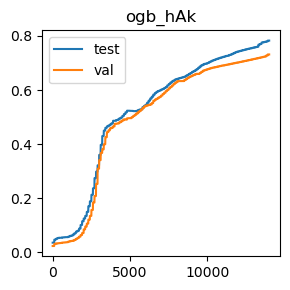

Last Validation Scores: {'ogb_hAk': 0.731558405561507}
Best Validation Scores: {'ogb_hAk': 0.731558405561507} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.7827536351309846}
Best Test Scores: {'ogb_hAk': 0.7827536351309846} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.7827536351309846
val
key='ogb_hAk': 0.731558405561507


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:34:32 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 4.9999999999999996e-06,
        "n_iter": 14

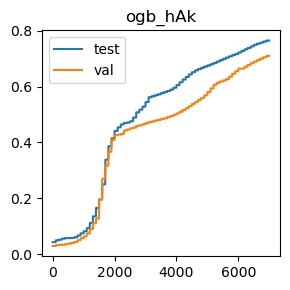

Last Validation Scores: {'ogb_hAk': 0.7093693113290234}
Best Validation Scores: {'ogb_hAk': 0.7093693113290234} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.7644599929582213}
Best Test Scores: {'ogb_hAk': 0.7644599929582213} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


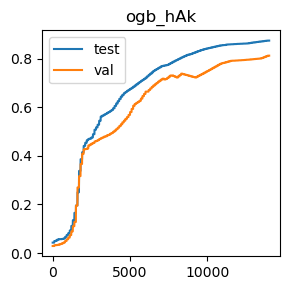

Last Validation Scores: {'ogb_hAk': 0.8121792806897946}
Best Validation Scores: {'ogb_hAk': 0.8121792806897946} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.874109477185386}
Best Test Scores: {'ogb_hAk': 0.874109477185386} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.874109477185386
val
key='ogb_hAk': 0.8121792806897946


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:44:04 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 14000,
        "ear

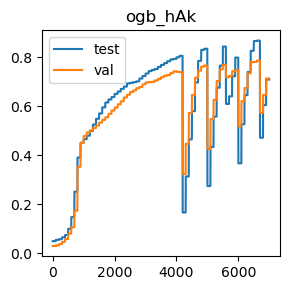

Last Validation Scores: {'ogb_hAk': 0.7144408902606207}
Best Validation Scores: {'ogb_hAk': 0.7874731251264149} at iterations {'ogb_hAk': 6600}
Last Test Scores: {'ogb_hAk': 0.7100285416775914}
Best Test Scores: {'ogb_hAk': 0.8690154244919057} at iterations {'ogb_hAk': 6600}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


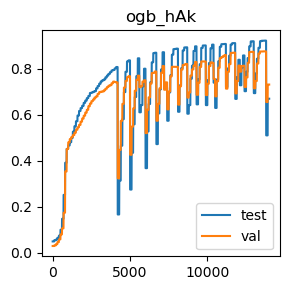

Last Validation Scores: {'ogb_hAk': 0.7307193851178749}
Best Validation Scores: {'ogb_hAk': 0.8749484976290182} at iterations {'ogb_hAk': 13700}
Last Test Scores: {'ogb_hAk': 0.6692461551139045}
Best Test Scores: {'ogb_hAk': 0.9215965360441685} at iterations {'ogb_hAk': 13700}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.6692461551139045
val
key='ogb_hAk': 0.7307193851178749


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:53:36 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 3e-06,
        "n_iter": 14000,
        "

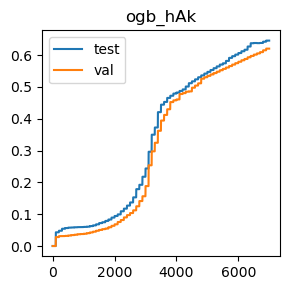

Last Validation Scores: {'ogb_hAk': 0.620410670542142}
Best Validation Scores: {'ogb_hAk': 0.620410670542142} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.6456187401209088}
Best Test Scores: {'ogb_hAk': 0.6456187401209088} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


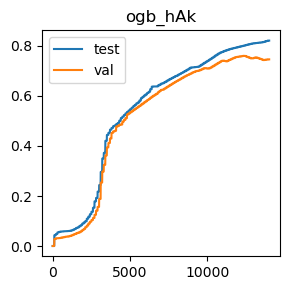

Last Validation Scores: {'ogb_hAk': 0.746488474705781}
Best Validation Scores: {'ogb_hAk': 0.760504610866813} at iterations {'ogb_hAk': 12300}
Last Test Scores: {'ogb_hAk': 0.8215433481410453}
Best Test Scores: {'ogb_hAk': 0.8215433481410453} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.8215433481410453
val
key='ogb_hAk': 0.746488474705781


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 05:06:49 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 4.9999999999999996e-06,
        "n_iter": 14

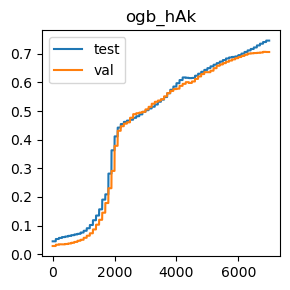

Last Validation Scores: {'ogb_hAk': 0.7061930196495592}
Best Validation Scores: {'ogb_hAk': 0.7066424948872192} at iterations {'ogb_hAk': 6800}
Last Test Scores: {'ogb_hAk': 0.746001543198316}
Best Test Scores: {'ogb_hAk': 0.746001543198316} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


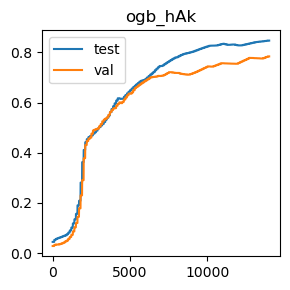

Last Validation Scores: {'ogb_hAk': 0.7842968334469507}
Best Validation Scores: {'ogb_hAk': 0.7842968334469507} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.8473057705129261}
Best Test Scores: {'ogb_hAk': 0.8473057705129261} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.8473057705129261
val
key='ogb_hAk': 0.7842968334469507


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 05:20:02 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 14000,
        "

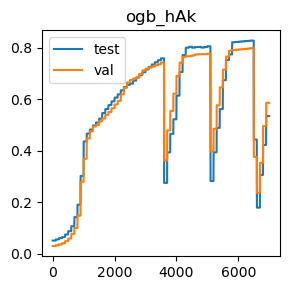

Last Validation Scores: {'ogb_hAk': 0.5861232011626426}
Best Validation Scores: {'ogb_hAk': 0.7980133194495427} at iterations {'ogb_hAk': 6400}
Last Test Scores: {'ogb_hAk': 0.5347556727520619}
Best Test Scores: {'ogb_hAk': 0.8271617886117957} at iterations {'ogb_hAk': 6400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


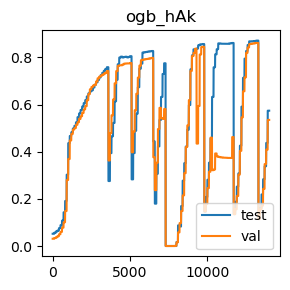

Last Validation Scores: {'ogb_hAk': 0.5348680415614769}
Best Validation Scores: {'ogb_hAk': 0.8612919416581142} at iterations {'ogb_hAk': 13200}
Last Test Scores: {'ogb_hAk': 0.5740248260156268}
Best Test Scores: {'ogb_hAk': 0.8712777831881279} at iterations {'ogb_hAk': 13200}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.5740248260156268
val
key='ogb_hAk': 0.5348680415614769


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/optimization_utils.py:494:::  

Finished CrossVal!




In [ ]:
#DDI ieclam h@20
#DECIDE ON A MODEL AND DATASET
model_name = 'ieclam'
ds_name = 'ogbl-ddi'

# SET RANGE PARAMETERS
use_global_config_base = True
densify = False
attr_opt = False
test_p = 0.1
val_p = 0.0
n_reps = 1

'''to do cross validation, give a list of parameters for every one of the parameters as given in the following'''
dim_feats = [120, 170]
n_iters_feats = [14000] 
lr_feats = [3e-6, 5*1e-6, 1e-5]
l1_regs = [0.1, 0.5, 0.7]
s_regs = [0.0, 0.1]
range_triplets = [
    # ['clamiter_init','s_reg', s_regs],
    # ['clamiter_init','l1_reg', l1_regs],
    ['clamiter_init', 'dim_feat', dim_feats],
    ['feat_opt','n_iter', n_iters_feats],
    ['feat_opt','lr', lr_feats],
    ]

# if model_name in ['pclam', 'pieclam']:
#     range_triplets += [
#         ['back_forth', 'first_func_in_fit', first_funcs_in_fit],
#         ['prior_opt','n_iter', n_iters_prior],
#         ['prior_opt','lr', lr_prior],
#         ['prior_opt','noise_amp', noise_amps],
#         ['back_forth','n_back_forth', n_back_forth]
#     ]

'''another method is to give a list of perturbations to the base config'''
#! when i do the deltas the parameters arent saved
# deltas ={
# # 'clamiter_init': {'s_reg': 0.001,
# #                   'l1_reg': 0.001,
# #                   'dim_feat': 2},
# # 'feat_opt': {'n_iter': 50,
# #             'lr': 0.0000001},
# # 'prior_opt': {'n_iter': 50,
# #               'lr': 0.0000001,
# #               'noise_amp': 0.005},
# 'back_forth': {'scheduler_gamma' : 0.1}
# }

# range_triplets = ou.perturb_config('link_prediction',
#                                    ds_name, 
#                                    model_name, 
#                                    deltas, 
#                                    use_global_config=use_global_config_base)

#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
ou.cross_val_link(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=range_triplets,
    use_global_config_base=use_global_config_base,
    densify=densify,
    attr_opt=attr_opt,
    metric='ogb_hAk',
    n_reps=n_reps,
    acc_every=100,
    device=device,
    plot_every= 7000
    )
#test that texas still works




/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:25:00 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 3e-06,
        "n_iter": 14000,
        "early_stop": 0
    }
}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:364:::  staring fit_feats for 14000 iterations


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6999


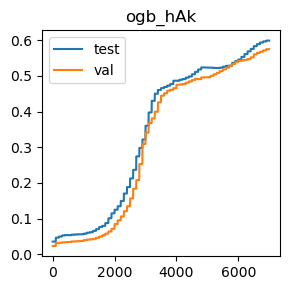

Last Validation Scores: {'ogb_hAk': 0.5747514776498438}
Best Validation Scores: {'ogb_hAk': 0.5747514776498438} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.5986935253092015}
Best Test Scores: {'ogb_hAk': 0.5986935253092015} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


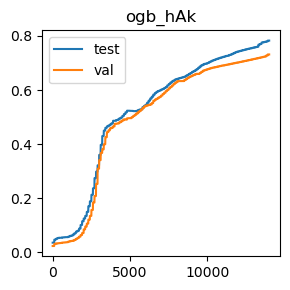

Last Validation Scores: {'ogb_hAk': 0.731558405561507}
Best Validation Scores: {'ogb_hAk': 0.731558405561507} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.7827536351309846}
Best Test Scores: {'ogb_hAk': 0.7827536351309846} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.7827536351309846
val
key='ogb_hAk': 0.731558405561507


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:34:32 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 4.9999999999999996e-06,
        "n_iter": 14

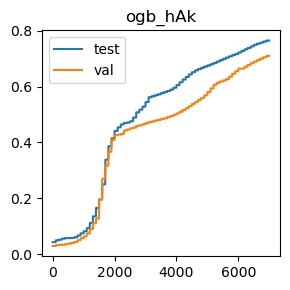

Last Validation Scores: {'ogb_hAk': 0.7093693113290234}
Best Validation Scores: {'ogb_hAk': 0.7093693113290234} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.7644599929582213}
Best Test Scores: {'ogb_hAk': 0.7644599929582213} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


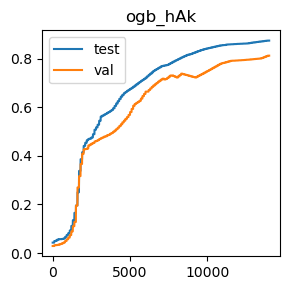

Last Validation Scores: {'ogb_hAk': 0.8121792806897946}
Best Validation Scores: {'ogb_hAk': 0.8121792806897946} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.874109477185386}
Best Test Scores: {'ogb_hAk': 0.874109477185386} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.874109477185386
val
key='ogb_hAk': 0.8121792806897946


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:44:04 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 14000,
        "ear

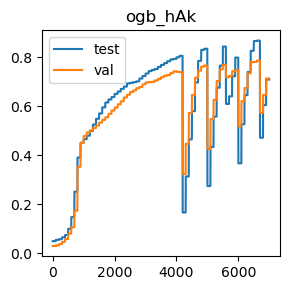

Last Validation Scores: {'ogb_hAk': 0.7144408902606207}
Best Validation Scores: {'ogb_hAk': 0.7874731251264149} at iterations {'ogb_hAk': 6600}
Last Test Scores: {'ogb_hAk': 0.7100285416775914}
Best Test Scores: {'ogb_hAk': 0.8690154244919057} at iterations {'ogb_hAk': 6600}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


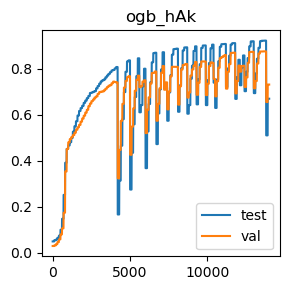

Last Validation Scores: {'ogb_hAk': 0.7307193851178749}
Best Validation Scores: {'ogb_hAk': 0.8749484976290182} at iterations {'ogb_hAk': 13700}
Last Test Scores: {'ogb_hAk': 0.6692461551139045}
Best Test Scores: {'ogb_hAk': 0.9215965360441685} at iterations {'ogb_hAk': 13700}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.6692461551139045
val
key='ogb_hAk': 0.7307193851178749


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:53:36 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 3e-06,
        "n_iter": 14000,
        "

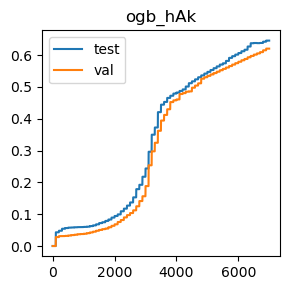

Last Validation Scores: {'ogb_hAk': 0.620410670542142}
Best Validation Scores: {'ogb_hAk': 0.620410670542142} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.6456187401209088}
Best Test Scores: {'ogb_hAk': 0.6456187401209088} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


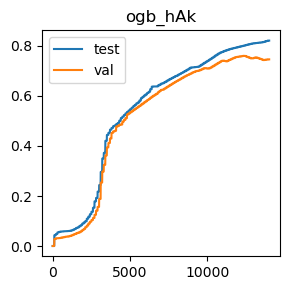

Last Validation Scores: {'ogb_hAk': 0.746488474705781}
Best Validation Scores: {'ogb_hAk': 0.760504610866813} at iterations {'ogb_hAk': 12300}
Last Test Scores: {'ogb_hAk': 0.8215433481410453}
Best Test Scores: {'ogb_hAk': 0.8215433481410453} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.8215433481410453
val
key='ogb_hAk': 0.746488474705781


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 05:06:49 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 4.9999999999999996e-06,
        "n_iter": 14

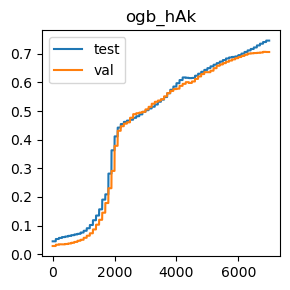

Last Validation Scores: {'ogb_hAk': 0.7061930196495592}
Best Validation Scores: {'ogb_hAk': 0.7066424948872192} at iterations {'ogb_hAk': 6800}
Last Test Scores: {'ogb_hAk': 0.746001543198316}
Best Test Scores: {'ogb_hAk': 0.746001543198316} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


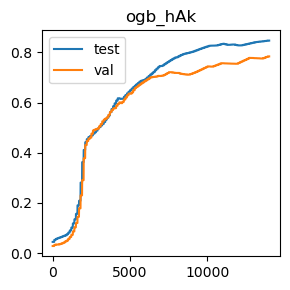

Last Validation Scores: {'ogb_hAk': 0.7842968334469507}
Best Validation Scores: {'ogb_hAk': 0.7842968334469507} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.8473057705129261}
Best Test Scores: {'ogb_hAk': 0.8473057705129261} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.8473057705129261
val
key='ogb_hAk': 0.7842968334469507


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 05:20:02 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 14000,
        "

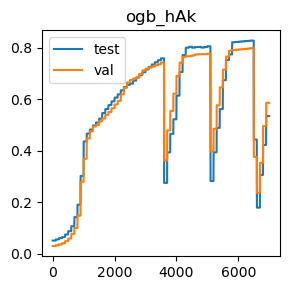

Last Validation Scores: {'ogb_hAk': 0.5861232011626426}
Best Validation Scores: {'ogb_hAk': 0.7980133194495427} at iterations {'ogb_hAk': 6400}
Last Test Scores: {'ogb_hAk': 0.5347556727520619}
Best Test Scores: {'ogb_hAk': 0.8271617886117957} at iterations {'ogb_hAk': 6400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


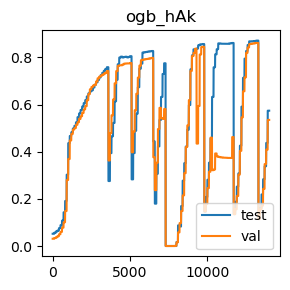

Last Validation Scores: {'ogb_hAk': 0.5348680415614769}
Best Validation Scores: {'ogb_hAk': 0.8612919416581142} at iterations {'ogb_hAk': 13200}
Last Test Scores: {'ogb_hAk': 0.5740248260156268}
Best Test Scores: {'ogb_hAk': 0.8712777831881279} at iterations {'ogb_hAk': 13200}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.5740248260156268
val
key='ogb_hAk': 0.5348680415614769


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/optimization_utils.py:494:::  

Finished CrossVal!




In [ ]:
#DDI ieclam h@20
#DECIDE ON A MODEL AND DATASET
model_name = 'ieclam'
ds_name = 'ogbl-ddi'

# SET RANGE PARAMETERS
use_global_config_base = True
densify = False
attr_opt = False
test_p = 0.1
val_p = 0.0
n_reps = 1

'''to do cross validation, give a list of parameters for every one of the parameters as given in the following'''
dim_feats = [120, 170]
n_iters_feats = [14000] 
lr_feats = [3e-6, 5*1e-6, 1e-5]
l1_regs = [0.1, 0.5, 0.7]
s_regs = [0.0, 0.1]
range_triplets = [
    # ['clamiter_init','s_reg', s_regs],
    # ['clamiter_init','l1_reg', l1_regs],
    ['clamiter_init', 'dim_feat', dim_feats],
    ['feat_opt','n_iter', n_iters_feats],
    ['feat_opt','lr', lr_feats],
    ]

# if model_name in ['pclam', 'pieclam']:
#     range_triplets += [
#         ['back_forth', 'first_func_in_fit', first_funcs_in_fit],
#         ['prior_opt','n_iter', n_iters_prior],
#         ['prior_opt','lr', lr_prior],
#         ['prior_opt','noise_amp', noise_amps],
#         ['back_forth','n_back_forth', n_back_forth]
#     ]

'''another method is to give a list of perturbations to the base config'''
#! when i do the deltas the parameters arent saved
# deltas ={
# # 'clamiter_init': {'s_reg': 0.001,
# #                   'l1_reg': 0.001,
# #                   'dim_feat': 2},
# # 'feat_opt': {'n_iter': 50,
# #             'lr': 0.0000001},
# # 'prior_opt': {'n_iter': 50,
# #               'lr': 0.0000001,
# #               'noise_amp': 0.005},
# 'back_forth': {'scheduler_gamma' : 0.1}
# }

# range_triplets = ou.perturb_config('link_prediction',
#                                    ds_name, 
#                                    model_name, 
#                                    deltas, 
#                                    use_global_config=use_global_config_base)

#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
ou.cross_val_link(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=range_triplets,
    use_global_config_base=use_global_config_base,
    densify=densify,
    attr_opt=attr_opt,
    metric='ogb_hAk',
    n_reps=n_reps,
    acc_every=100,
    device=device,
    plot_every= 7000
    )
#test that texas still works




/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:25:00 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 3e-06,
        "n_iter": 14000,
        "early_stop": 0
    }
}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:364:::  staring fit_feats for 14000 iterations


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6999


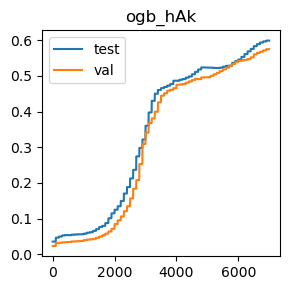

Last Validation Scores: {'ogb_hAk': 0.5747514776498438}
Best Validation Scores: {'ogb_hAk': 0.5747514776498438} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.5986935253092015}
Best Test Scores: {'ogb_hAk': 0.5986935253092015} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


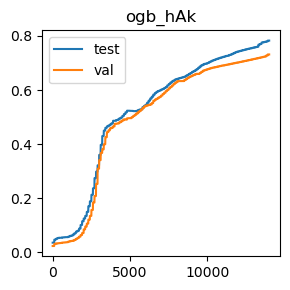

Last Validation Scores: {'ogb_hAk': 0.731558405561507}
Best Validation Scores: {'ogb_hAk': 0.731558405561507} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.7827536351309846}
Best Test Scores: {'ogb_hAk': 0.7827536351309846} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.7827536351309846
val
key='ogb_hAk': 0.731558405561507


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:34:32 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 4.9999999999999996e-06,
        "n_iter": 14

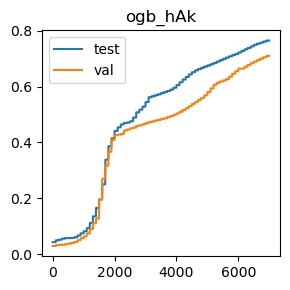

Last Validation Scores: {'ogb_hAk': 0.7093693113290234}
Best Validation Scores: {'ogb_hAk': 0.7093693113290234} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.7644599929582213}
Best Test Scores: {'ogb_hAk': 0.7644599929582213} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


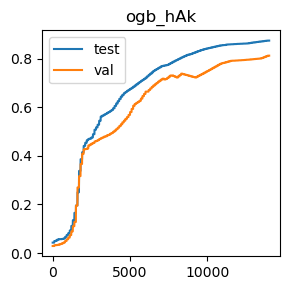

Last Validation Scores: {'ogb_hAk': 0.8121792806897946}
Best Validation Scores: {'ogb_hAk': 0.8121792806897946} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.874109477185386}
Best Test Scores: {'ogb_hAk': 0.874109477185386} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.874109477185386
val
key='ogb_hAk': 0.8121792806897946


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:44:04 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 14000,
        "ear

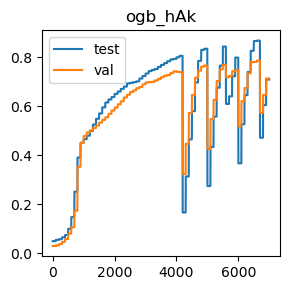

Last Validation Scores: {'ogb_hAk': 0.7144408902606207}
Best Validation Scores: {'ogb_hAk': 0.7874731251264149} at iterations {'ogb_hAk': 6600}
Last Test Scores: {'ogb_hAk': 0.7100285416775914}
Best Test Scores: {'ogb_hAk': 0.8690154244919057} at iterations {'ogb_hAk': 6600}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


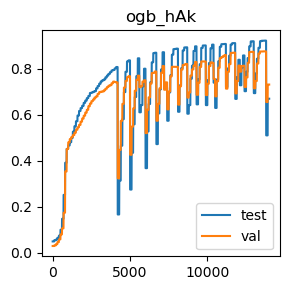

Last Validation Scores: {'ogb_hAk': 0.7307193851178749}
Best Validation Scores: {'ogb_hAk': 0.8749484976290182} at iterations {'ogb_hAk': 13700}
Last Test Scores: {'ogb_hAk': 0.6692461551139045}
Best Test Scores: {'ogb_hAk': 0.9215965360441685} at iterations {'ogb_hAk': 13700}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.6692461551139045
val
key='ogb_hAk': 0.7307193851178749


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 04:53:36 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 3e-06,
        "n_iter": 14000,
        "

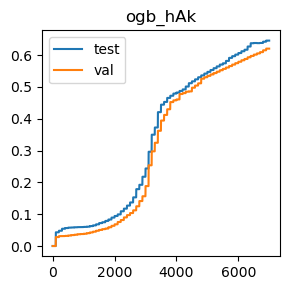

Last Validation Scores: {'ogb_hAk': 0.620410670542142}
Best Validation Scores: {'ogb_hAk': 0.620410670542142} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.6456187401209088}
Best Test Scores: {'ogb_hAk': 0.6456187401209088} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


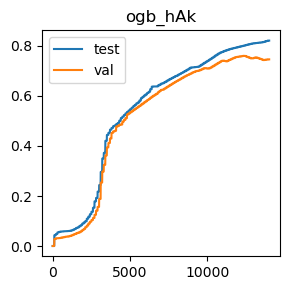

Last Validation Scores: {'ogb_hAk': 0.746488474705781}
Best Validation Scores: {'ogb_hAk': 0.760504610866813} at iterations {'ogb_hAk': 12300}
Last Test Scores: {'ogb_hAk': 0.8215433481410453}
Best Test Scores: {'ogb_hAk': 0.8215433481410453} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.8215433481410453
val
key='ogb_hAk': 0.746488474705781


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 05:06:49 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 4.9999999999999996e-06,
        "n_iter": 14

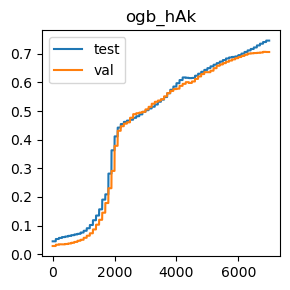

Last Validation Scores: {'ogb_hAk': 0.7061930196495592}
Best Validation Scores: {'ogb_hAk': 0.7066424948872192} at iterations {'ogb_hAk': 6800}
Last Test Scores: {'ogb_hAk': 0.746001543198316}
Best Test Scores: {'ogb_hAk': 0.746001543198316} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


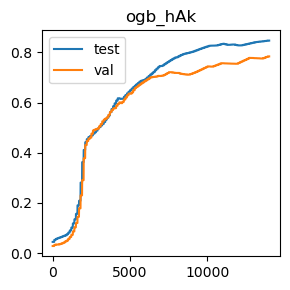

Last Validation Scores: {'ogb_hAk': 0.7842968334469507}
Best Validation Scores: {'ogb_hAk': 0.7842968334469507} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.8473057705129261}
Best Test Scores: {'ogb_hAk': 0.8473057705129261} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.8473057705129261
val
key='ogb_hAk': 0.7842968334469507


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 05:20:02 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 14000,
        "

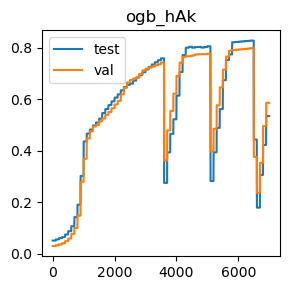

Last Validation Scores: {'ogb_hAk': 0.5861232011626426}
Best Validation Scores: {'ogb_hAk': 0.7980133194495427} at iterations {'ogb_hAk': 6400}
Last Test Scores: {'ogb_hAk': 0.5347556727520619}
Best Test Scores: {'ogb_hAk': 0.8271617886117957} at iterations {'ogb_hAk': 6400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


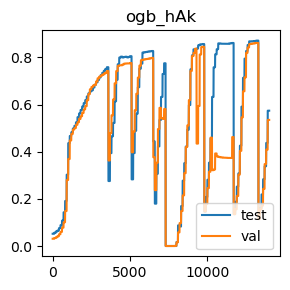

Last Validation Scores: {'ogb_hAk': 0.5348680415614769}
Best Validation Scores: {'ogb_hAk': 0.8612919416581142} at iterations {'ogb_hAk': 13200}
Last Test Scores: {'ogb_hAk': 0.5740248260156268}
Best Test Scores: {'ogb_hAk': 0.8712777831881279} at iterations {'ogb_hAk': 13200}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.5740248260156268
val
key='ogb_hAk': 0.5348680415614769


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/optimization_utils.py:494:::  

Finished CrossVal!




In [ ]:
#DDI ieclam h@20
#DECIDE ON A MODEL AND DATASET
model_name = 'ieclam'
ds_name = 'ogbl-ddi'

# SET RANGE PARAMETERS
use_global_config_base = True
densify = False
attr_opt = False
test_p = 0.1
val_p = 0.0
n_reps = 1

'''to do cross validation, give a list of parameters for every one of the parameters as given in the following'''
dim_feats = [120, 170]
n_iters_feats = [14000] 
lr_feats = [3e-6, 5*1e-6, 1e-5]
l1_regs = [0.1, 0.5, 0.7]
s_regs = [0.0, 0.1]
range_triplets = [
    # ['clamiter_init','s_reg', s_regs],
    # ['clamiter_init','l1_reg', l1_regs],
    ['clamiter_init', 'dim_feat', dim_feats],
    ['feat_opt','n_iter', n_iters_feats],
    ['feat_opt','lr', lr_feats],
    ]

# if model_name in ['pclam', 'pieclam']:
#     range_triplets += [
#         ['back_forth', 'first_func_in_fit', first_funcs_in_fit],
#         ['prior_opt','n_iter', n_iters_prior],
#         ['prior_opt','lr', lr_prior],
#         ['prior_opt','noise_amp', noise_amps],
#         ['back_forth','n_back_forth', n_back_forth]
#     ]

'''another method is to give a list of perturbations to the base config'''
#! when i do the deltas the parameters arent saved
# deltas ={
# # 'clamiter_init': {'s_reg': 0.001,
# #                   'l1_reg': 0.001,
# #                   'dim_feat': 2},
# # 'feat_opt': {'n_iter': 50,
# #             'lr': 0.0000001},
# # 'prior_opt': {'n_iter': 50,
# #               'lr': 0.0000001,
# #               'noise_amp': 0.005},
# 'back_forth': {'scheduler_gamma' : 0.1}
# }

# range_triplets = ou.perturb_config('link_prediction',
#                                    ds_name, 
#                                    model_name, 
#                                    deltas, 
#                                    use_global_config=use_global_config_base)

#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
ou.cross_val_link(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=range_triplets,
    use_global_config_base=use_global_config_base,
    densify=densify,
    attr_opt=attr_opt,
    metric='ogb_hAk',
    n_reps=n_reps,
    acc_every=100,
    device=device,
    plot_every= 7000
    )
#test that texas still works


In [4]:
#DDI only on test dataset
#DECIDE ON A MODEL AND DATASET
model_name = 'ieclam'
ds_name = 'ogbl-ddi'

# SET RANGE PARAMETERS

densify = False
attr_opt = False
n_reps = 10

#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
ou.cross_val_link(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=[],
    use_global_config_base=False,
    densify=densify,
    attr_opt=attr_opt,
    metric='ogb_hAk',
    n_reps=n_reps,
    acc_every=100,
    device=device,
    test_only=True,
    plot_every= -1
    #! add calculation type and finish the hAk function
    )
#test that texas still works
#todo: i would try ieclam with 1e-5




/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/optimization_utils.py:515:::  

Finished CrossVal!




AssertionError: dyads_to_omit[0] must be a subset of edge_index

### bigclam



/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 10:17:10 starting optimization of bigclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 50,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 3e-06,
        "n_iter": 14000,
        "early_stop": 0
    }
}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:364:::  staring fit_feats for 14000 iterations


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 499


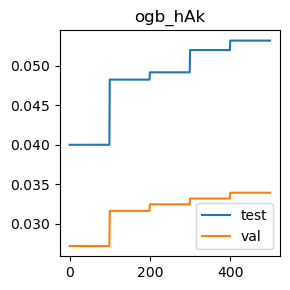

Last Validation Scores: {'ogb_hAk': 0.03391290668144941}
Best Validation Scores: {'ogb_hAk': 0.03391290668144941} at iterations {'ogb_hAk': 400}
Last Test Scores: {'ogb_hAk': 0.053165429361220776}
Best Test Scores: {'ogb_hAk': 0.053165429361220776} at iterations {'ogb_hAk': 400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 999


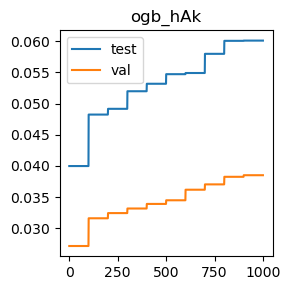

Last Validation Scores: {'ogb_hAk': 0.038512536613503734}
Best Validation Scores: {'ogb_hAk': 0.038512536613503734} at iterations {'ogb_hAk': 900}
Last Test Scores: {'ogb_hAk': 0.060079856767224264}
Best Test Scores: {'ogb_hAk': 0.060079856767224264} at iterations {'ogb_hAk': 900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1499


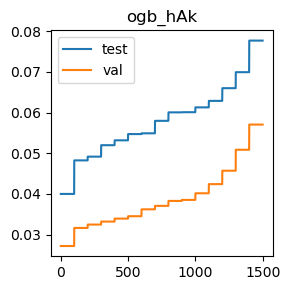

Last Validation Scores: {'ogb_hAk': 0.05703840765905805}
Best Validation Scores: {'ogb_hAk': 0.05703840765905805} at iterations {'ogb_hAk': 1400}
Last Test Scores: {'ogb_hAk': 0.07769179482953652}
Best Test Scores: {'ogb_hAk': 0.07769179482953652} at iterations {'ogb_hAk': 1400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1999


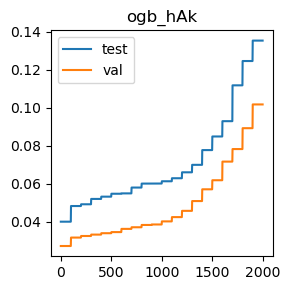

Last Validation Scores: {'ogb_hAk': 0.10173872004434822}
Best Validation Scores: {'ogb_hAk': 0.10173872004434822} at iterations {'ogb_hAk': 1900}
Last Test Scores: {'ogb_hAk': 0.1353594678213186}
Best Test Scores: {'ogb_hAk': 0.1353594678213186} at iterations {'ogb_hAk': 1900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2499


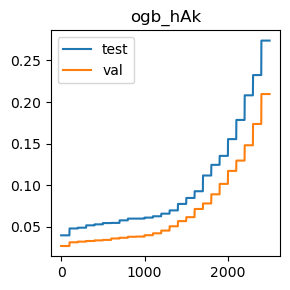

Last Validation Scores: {'ogb_hAk': 0.20958281206691187}
Best Validation Scores: {'ogb_hAk': 0.20958281206691187} at iterations {'ogb_hAk': 2400}
Last Test Scores: {'ogb_hAk': 0.27373041973495943}
Best Test Scores: {'ogb_hAk': 0.27373041973495943} at iterations {'ogb_hAk': 2400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2999


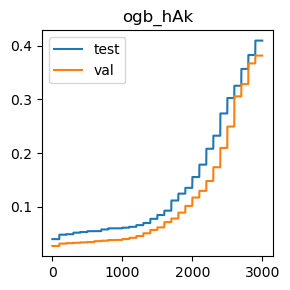

Last Validation Scores: {'ogb_hAk': 0.38137224790057606}
Best Validation Scores: {'ogb_hAk': 0.38137224790057606} at iterations {'ogb_hAk': 2900}
Last Test Scores: {'ogb_hAk': 0.40922473012757604}
Best Test Scores: {'ogb_hAk': 0.40922473012757604} at iterations {'ogb_hAk': 2900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3499


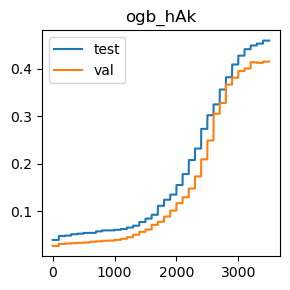

Last Validation Scores: {'ogb_hAk': 0.4153975233914405}
Best Validation Scores: {'ogb_hAk': 0.4153975233914405} at iterations {'ogb_hAk': 3400}
Last Test Scores: {'ogb_hAk': 0.4595210092217336}
Best Test Scores: {'ogb_hAk': 0.4595210092217336} at iterations {'ogb_hAk': 3400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3999


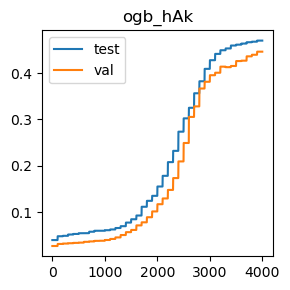

Last Validation Scores: {'ogb_hAk': 0.4462614897107627}
Best Validation Scores: {'ogb_hAk': 0.4462614897107627} at iterations {'ogb_hAk': 3900}
Last Test Scores: {'ogb_hAk': 0.47013611608447137}
Best Test Scores: {'ogb_hAk': 0.47013611608447137} at iterations {'ogb_hAk': 3900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4499


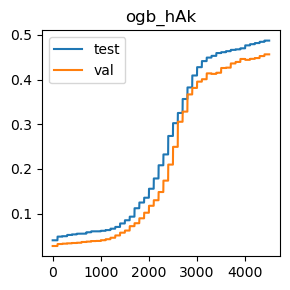

Last Validation Scores: {'ogb_hAk': 0.4565919289229824}
Best Validation Scores: {'ogb_hAk': 0.4565919289229824} at iterations {'ogb_hAk': 4400}
Last Test Scores: {'ogb_hAk': 0.4874034564645776}
Best Test Scores: {'ogb_hAk': 0.4874034564645776} at iterations {'ogb_hAk': 4400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4999


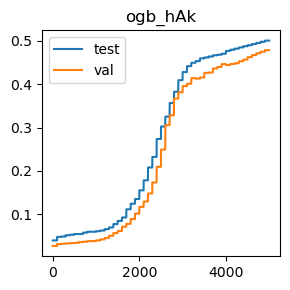

Last Validation Scores: {'ogb_hAk': 0.47833154791780597}
Best Validation Scores: {'ogb_hAk': 0.47833154791780597} at iterations {'ogb_hAk': 4900}
Last Test Scores: {'ogb_hAk': 0.5003932908329525}
Best Test Scores: {'ogb_hAk': 0.5003932908329525} at iterations {'ogb_hAk': 4900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5499


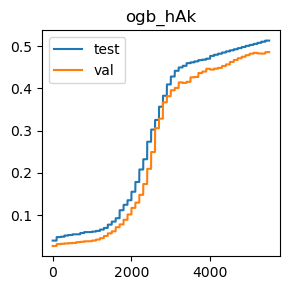

Last Validation Scores: {'ogb_hAk': 0.4855830817520545}
Best Validation Scores: {'ogb_hAk': 0.4855830817520545} at iterations {'ogb_hAk': 5400}
Last Test Scores: {'ogb_hAk': 0.5128437549161354}
Best Test Scores: {'ogb_hAk': 0.5128437549161354} at iterations {'ogb_hAk': 5400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5999


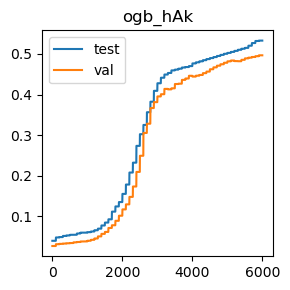

Last Validation Scores: {'ogb_hAk': 0.49668512012225724}
Best Validation Scores: {'ogb_hAk': 0.49668512012225724} at iterations {'ogb_hAk': 5900}
Last Test Scores: {'ogb_hAk': 0.5328978417697339}
Best Test Scores: {'ogb_hAk': 0.5328978417697339} at iterations {'ogb_hAk': 5900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6499


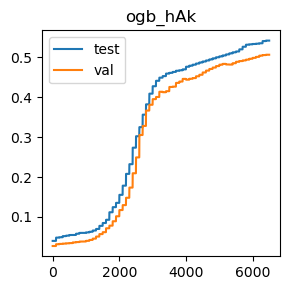

Last Validation Scores: {'ogb_hAk': 0.506820786731491}
Best Validation Scores: {'ogb_hAk': 0.506820786731491} at iterations {'ogb_hAk': 6400}
Last Test Scores: {'ogb_hAk': 0.5422619092209845}
Best Test Scores: {'ogb_hAk': 0.5422619092209845} at iterations {'ogb_hAk': 6400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6999


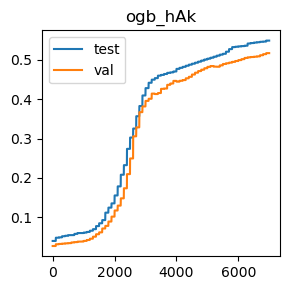

Last Validation Scores: {'ogb_hAk': 0.5166942594520897}
Best Validation Scores: {'ogb_hAk': 0.5166942594520897} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.5484721587546539}
Best Test Scores: {'ogb_hAk': 0.5484721587546539} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7499


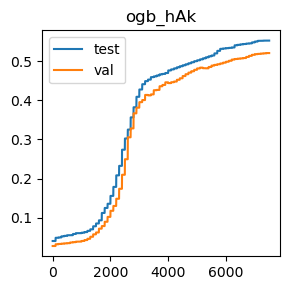

Last Validation Scores: {'ogb_hAk': 0.521211485590573}
Best Validation Scores: {'ogb_hAk': 0.521211485590573} at iterations {'ogb_hAk': 7400}
Last Test Scores: {'ogb_hAk': 0.5531017537025523}
Best Test Scores: {'ogb_hAk': 0.5531017537025523} at iterations {'ogb_hAk': 7400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7999


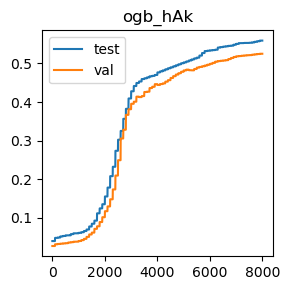

Last Validation Scores: {'ogb_hAk': 0.5250245338567223}
Best Validation Scores: {'ogb_hAk': 0.5250245338567223} at iterations {'ogb_hAk': 7900}
Last Test Scores: {'ogb_hAk': 0.5590947568713527}
Best Test Scores: {'ogb_hAk': 0.5590947568713527} at iterations {'ogb_hAk': 7900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8499


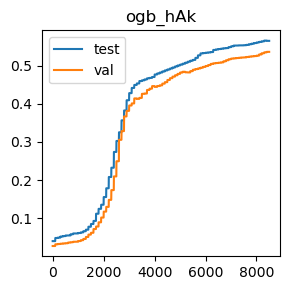

Last Validation Scores: {'ogb_hAk': 0.5360741334491981}
Best Validation Scores: {'ogb_hAk': 0.5360741334491981} at iterations {'ogb_hAk': 8400}
Last Test Scores: {'ogb_hAk': 0.5648854961832062}
Best Test Scores: {'ogb_hAk': 0.5655522177857352} at iterations {'ogb_hAk': 8300}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8999


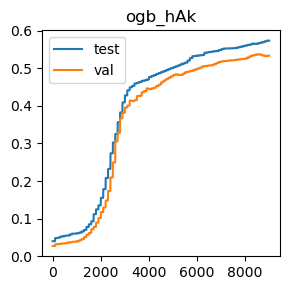

Last Validation Scores: {'ogb_hAk': 0.5333772820232379}
Best Validation Scores: {'ogb_hAk': 0.5372802253369191} at iterations {'ogb_hAk': 8500}
Last Test Scores: {'ogb_hAk': 0.5736352808096548}
Best Test Scores: {'ogb_hAk': 0.5736352808096548} at iterations {'ogb_hAk': 8900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9499


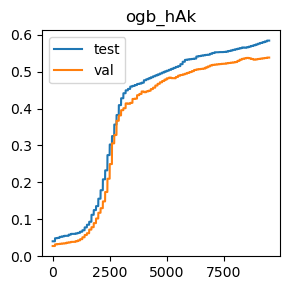

Last Validation Scores: {'ogb_hAk': 0.5381941583201613}
Best Validation Scores: {'ogb_hAk': 0.5381941583201613} at iterations {'ogb_hAk': 9400}
Last Test Scores: {'ogb_hAk': 0.5842204226565485}
Best Test Scores: {'ogb_hAk': 0.5842204226565485} at iterations {'ogb_hAk': 9400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9999


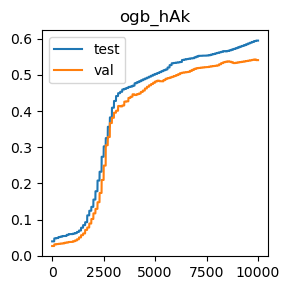

Last Validation Scores: {'ogb_hAk': 0.5407112196510574}
Best Validation Scores: {'ogb_hAk': 0.5424791555858535} at iterations {'ogb_hAk': 9800}
Last Test Scores: {'ogb_hAk': 0.5946107919004562}
Best Test Scores: {'ogb_hAk': 0.5946107919004562} at iterations {'ogb_hAk': 9900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10499


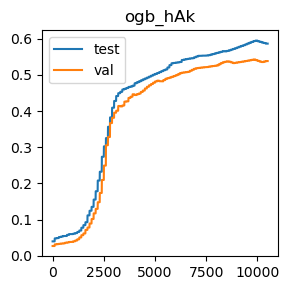

Last Validation Scores: {'ogb_hAk': 0.5381192457805513}
Best Validation Scores: {'ogb_hAk': 0.5424791555858535} at iterations {'ogb_hAk': 9800}
Last Test Scores: {'ogb_hAk': 0.5862880087497846}
Best Test Scores: {'ogb_hAk': 0.5946107919004562} at iterations {'ogb_hAk': 9900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10999


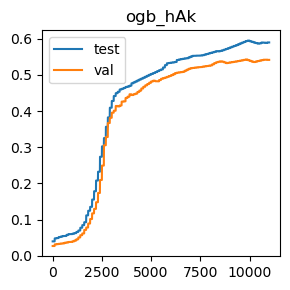

Last Validation Scores: {'ogb_hAk': 0.5413554674917035}
Best Validation Scores: {'ogb_hAk': 0.5424791555858535} at iterations {'ogb_hAk': 9800}
Last Test Scores: {'ogb_hAk': 0.5895242304609368}
Best Test Scores: {'ogb_hAk': 0.5946107919004562} at iterations {'ogb_hAk': 9900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11499


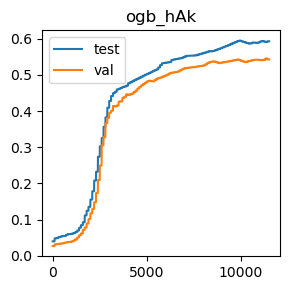

Last Validation Scores: {'ogb_hAk': 0.5426589456809175}
Best Validation Scores: {'ogb_hAk': 0.5451310594880477} at iterations {'ogb_hAk': 11300}
Last Test Scores: {'ogb_hAk': 0.5927454696641671}
Best Test Scores: {'ogb_hAk': 0.5946107919004562} at iterations {'ogb_hAk': 9900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11999


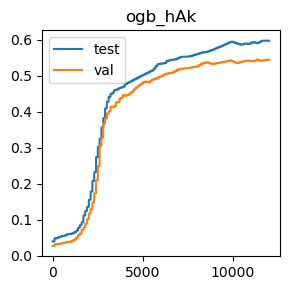

Last Validation Scores: {'ogb_hAk': 0.5449362868850617}
Best Validation Scores: {'ogb_hAk': 0.5451310594880477} at iterations {'ogb_hAk': 11300}
Last Test Scores: {'ogb_hAk': 0.5971128707234304}
Best Test Scores: {'ogb_hAk': 0.5976447497546614} at iterations {'ogb_hAk': 11800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12499


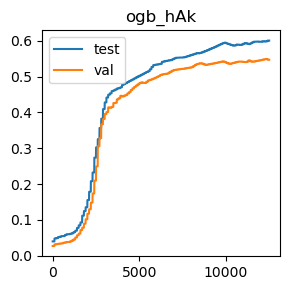

Last Validation Scores: {'ogb_hAk': 0.5470263467401808}
Best Validation Scores: {'ogb_hAk': 0.5490265115477679} at iterations {'ogb_hAk': 12300}
Last Test Scores: {'ogb_hAk': 0.6003865487043877}
Best Test Scores: {'ogb_hAk': 0.6003865487043877} at iterations {'ogb_hAk': 12400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12999


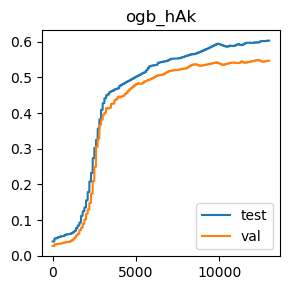

Last Validation Scores: {'ogb_hAk': 0.5471237330416738}
Best Validation Scores: {'ogb_hAk': 0.5490265115477679} at iterations {'ogb_hAk': 12300}
Last Test Scores: {'ogb_hAk': 0.6034504715744369}
Best Test Scores: {'ogb_hAk': 0.6034504715744369} at iterations {'ogb_hAk': 12900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13499


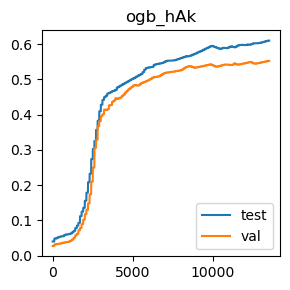

Last Validation Scores: {'ogb_hAk': 0.5522028032272323}
Best Validation Scores: {'ogb_hAk': 0.5522028032272323} at iterations {'ogb_hAk': 13400}
Last Test Scores: {'ogb_hAk': 0.6096906861239503}
Best Test Scores: {'ogb_hAk': 0.6096906861239503} at iterations {'ogb_hAk': 13400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


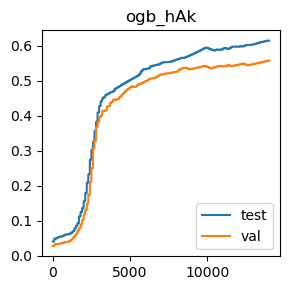

Last Validation Scores: {'ogb_hAk': 0.5570196795241555}
Best Validation Scores: {'ogb_hAk': 0.5570196795241555} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.6146199312302887}
Best Test Scores: {'ogb_hAk': 0.6146199312302887} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.6146199312302887
val
key='ogb_hAk': 0.5570196795241555


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 10:21:31 starting optimization of bigclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 50,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 6e-06,
        "

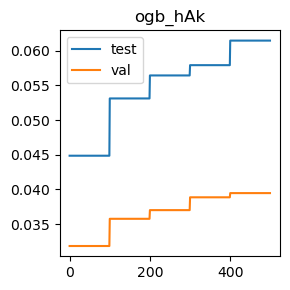

Last Validation Scores: {'ogb_hAk': 0.0394639258665508}
Best Validation Scores: {'ogb_hAk': 0.0394639258665508} at iterations {'ogb_hAk': 400}
Last Test Scores: {'ogb_hAk': 0.061465738750009366}
Best Test Scores: {'ogb_hAk': 0.061465738750009366} at iterations {'ogb_hAk': 400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 999


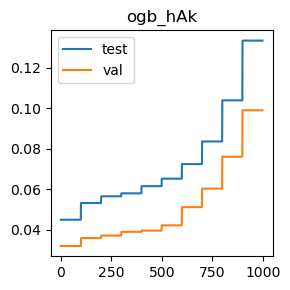

Last Validation Scores: {'ogb_hAk': 0.09903437736442704}
Best Validation Scores: {'ogb_hAk': 0.09903437736442704} at iterations {'ogb_hAk': 900}
Last Test Scores: {'ogb_hAk': 0.1335465843627565}
Best Test Scores: {'ogb_hAk': 0.1335465843627565} at iterations {'ogb_hAk': 900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1499


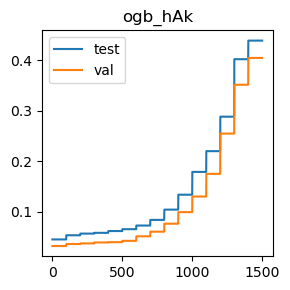

Last Validation Scores: {'ogb_hAk': 0.40469252148117074}
Best Validation Scores: {'ogb_hAk': 0.40469252148117074} at iterations {'ogb_hAk': 1400}
Last Test Scores: {'ogb_hAk': 0.4390623946542412}
Best Test Scores: {'ogb_hAk': 0.4390623946542412} at iterations {'ogb_hAk': 1400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1999


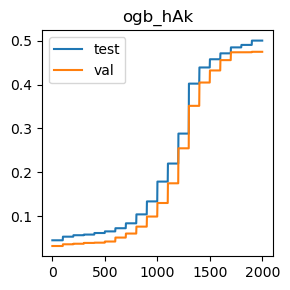

Last Validation Scores: {'ogb_hAk': 0.4747881847942527}
Best Validation Scores: {'ogb_hAk': 0.4747881847942527} at iterations {'ogb_hAk': 1900}
Last Test Scores: {'ogb_hAk': 0.5003333608012646}
Best Test Scores: {'ogb_hAk': 0.5003333608012646} at iterations {'ogb_hAk': 1900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2499


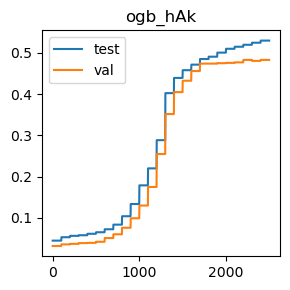

Last Validation Scores: {'ogb_hAk': 0.4826839664691473}
Best Validation Scores: {'ogb_hAk': 0.4826914577231083} at iterations {'ogb_hAk': 2200}
Last Test Scores: {'ogb_hAk': 0.5294743387095566}
Best Test Scores: {'ogb_hAk': 0.5294743387095566} at iterations {'ogb_hAk': 2400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2999


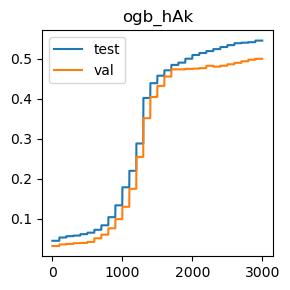

Last Validation Scores: {'ogb_hAk': 0.5001011319284735}
Best Validation Scores: {'ogb_hAk': 0.5001011319284735} at iterations {'ogb_hAk': 2900}
Last Test Scores: {'ogb_hAk': 0.5456030084875907}
Best Test Scores: {'ogb_hAk': 0.5456030084875907} at iterations {'ogb_hAk': 2900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3499


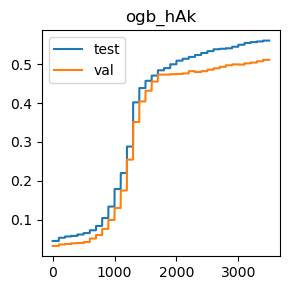

Last Validation Scores: {'ogb_hAk': 0.5118474181393223}
Best Validation Scores: {'ogb_hAk': 0.5118474181393223} at iterations {'ogb_hAk': 3400}
Last Test Scores: {'ogb_hAk': 0.5614320281071848}
Best Test Scores: {'ogb_hAk': 0.5614320281071848} at iterations {'ogb_hAk': 3400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3999


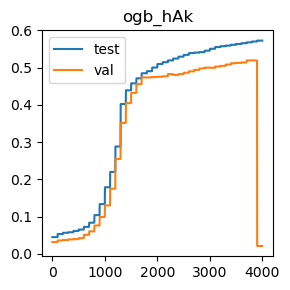

Last Validation Scores: {'ogb_hAk': 0.02099798485268449}
Best Validation Scores: {'ogb_hAk': 0.5195334447033089} at iterations {'ogb_hAk': 3700}
Last Test Scores: {'ogb_hAk': 0.5726164702709586}
Best Test Scores: {'ogb_hAk': 0.5726164702709586} at iterations {'ogb_hAk': 3900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4499


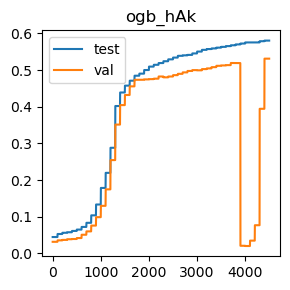

Last Validation Scores: {'ogb_hAk': 0.5313771172156507}
Best Validation Scores: {'ogb_hAk': 0.5313771172156507} at iterations {'ogb_hAk': 4400}
Last Test Scores: {'ogb_hAk': 0.5806021469933852}
Best Test Scores: {'ogb_hAk': 0.5806021469933852} at iterations {'ogb_hAk': 4400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4999


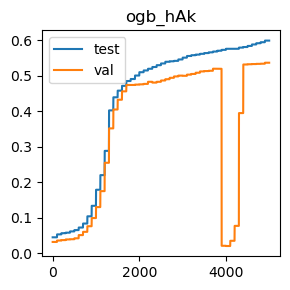

Last Validation Scores: {'ogb_hAk': 0.536381274861599}
Best Validation Scores: {'ogb_hAk': 0.536381274861599} at iterations {'ogb_hAk': 4900}
Last Test Scores: {'ogb_hAk': 0.5986710515473185}
Best Test Scores: {'ogb_hAk': 0.5986710515473185} at iterations {'ogb_hAk': 4900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5499


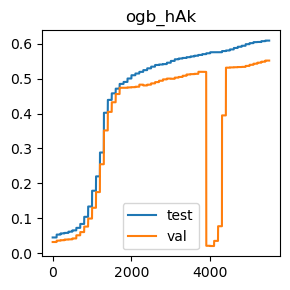

Last Validation Scores: {'ogb_hAk': 0.5516784154499622}
Best Validation Scores: {'ogb_hAk': 0.5516784154499622} at iterations {'ogb_hAk': 5400}
Last Test Scores: {'ogb_hAk': 0.6089265782199282}
Best Test Scores: {'ogb_hAk': 0.6089265782199282} at iterations {'ogb_hAk': 5400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5999


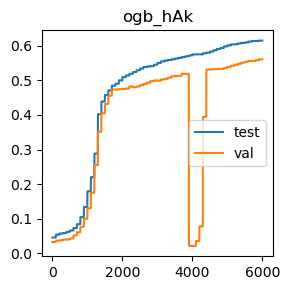

Last Validation Scores: {'ogb_hAk': 0.5613795893294579}
Best Validation Scores: {'ogb_hAk': 0.5613795893294579} at iterations {'ogb_hAk': 5900}
Last Test Scores: {'ogb_hAk': 0.6155413554674917}
Best Test Scores: {'ogb_hAk': 0.6155413554674917} at iterations {'ogb_hAk': 5900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6499


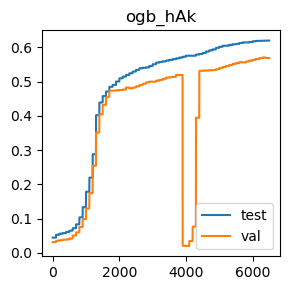

Last Validation Scores: {'ogb_hAk': 0.5688558607825364}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.619713983923769}
Best Test Scores: {'ogb_hAk': 0.619713983923769} at iterations {'ogb_hAk': 6400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6999


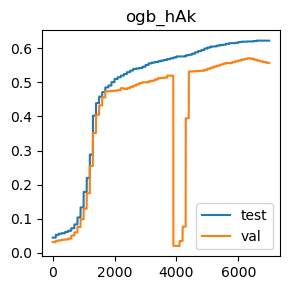

Last Validation Scores: {'ogb_hAk': 0.5570271707781166}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.6218340087947322}
Best Test Scores: {'ogb_hAk': 0.6220362726516792} at iterations {'ogb_hAk': 6600}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7499


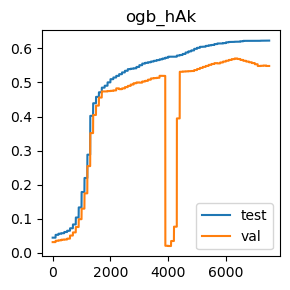

Last Validation Scores: {'ogb_hAk': 0.548419719976927}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.6228228543175842}
Best Test Scores: {'ogb_hAk': 0.6228228543175842} at iterations {'ogb_hAk': 7400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7999


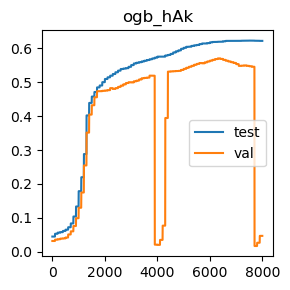

Last Validation Scores: {'ogb_hAk': 0.04692521481170733}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.6220812201754452}
Best Test Scores: {'ogb_hAk': 0.6229127493651162} at iterations {'ogb_hAk': 7500}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8499


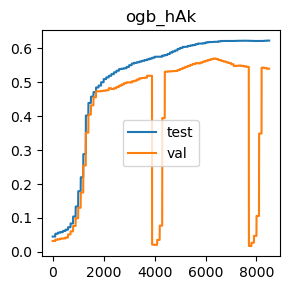

Last Validation Scores: {'ogb_hAk': 0.5403441482069684}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.6232049082695953}
Best Test Scores: {'ogb_hAk': 0.6232049082695953} at iterations {'ogb_hAk': 8400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8999


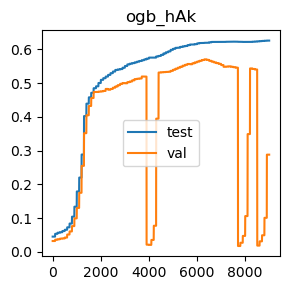

Last Validation Scores: {'ogb_hAk': 0.2878589247054064}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.6260216197589314}
Best Test Scores: {'ogb_hAk': 0.6260216197589314} at iterations {'ogb_hAk': 8900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9499


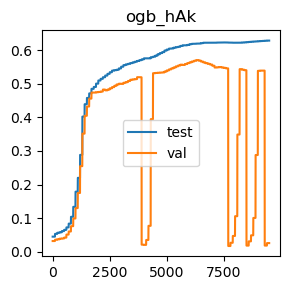

Last Validation Scores: {'ogb_hAk': 0.025687509832270822}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.6284188210264516}
Best Test Scores: {'ogb_hAk': 0.6284188210264516} at iterations {'ogb_hAk': 9400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9999


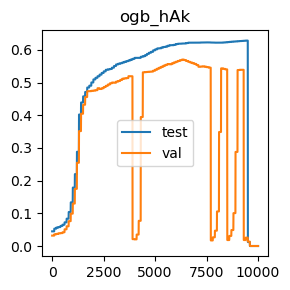

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.6284188210264516} at iterations {'ogb_hAk': 9400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10499


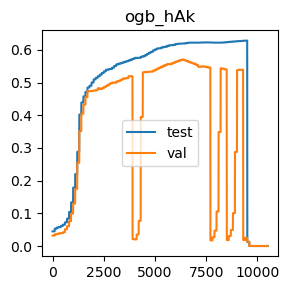

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.6284188210264516} at iterations {'ogb_hAk': 9400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10999


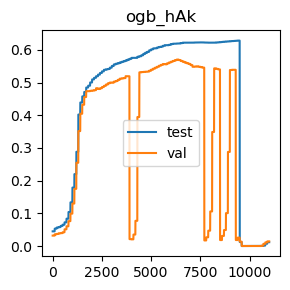

Last Validation Scores: {'ogb_hAk': 0.014180943748174007}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.011738794956887833}
Best Test Scores: {'ogb_hAk': 0.6284188210264516} at iterations {'ogb_hAk': 9400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11499


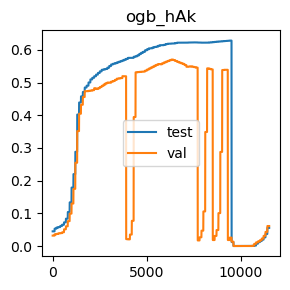

Last Validation Scores: {'ogb_hAk': 0.06114361482968634}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.055450261819325934}
Best Test Scores: {'ogb_hAk': 0.6284188210264516} at iterations {'ogb_hAk': 9400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11999


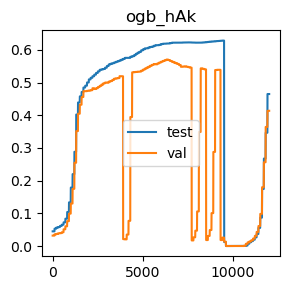

Last Validation Scores: {'ogb_hAk': 0.41365955247248837}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.46495216834345904}
Best Test Scores: {'ogb_hAk': 0.6284188210264516} at iterations {'ogb_hAk': 9400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12499


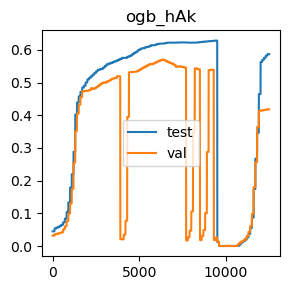

Last Validation Scores: {'ogb_hAk': 0.4182217261347377}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.5870071691300407}
Best Test Scores: {'ogb_hAk': 0.6284188210264516} at iterations {'ogb_hAk': 9400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12999


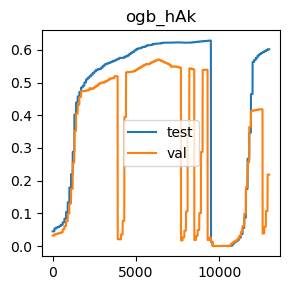

Last Validation Scores: {'ogb_hAk': 0.2183325966933605}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.6020046595599637}
Best Test Scores: {'ogb_hAk': 0.6284188210264516} at iterations {'ogb_hAk': 9400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13499


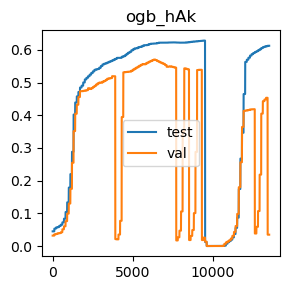

Last Validation Scores: {'ogb_hAk': 0.03464704956962746}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.6126197664227016}
Best Test Scores: {'ogb_hAk': 0.6284188210264516} at iterations {'ogb_hAk': 9400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


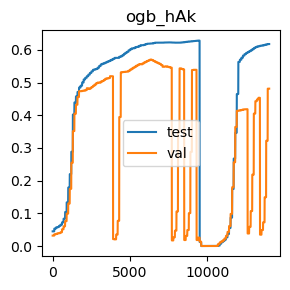

Last Validation Scores: {'ogb_hAk': 0.48139547078785516}
Best Validation Scores: {'ogb_hAk': 0.5703690940826585} at iterations {'ogb_hAk': 6300}
Last Test Scores: {'ogb_hAk': 0.6179385567350119}
Best Test Scores: {'ogb_hAk': 0.6284188210264516} at iterations {'ogb_hAk': 9400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.6179385567350119
val
key='ogb_hAk': 0.48139547078785516


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 10:25:53 starting optimization of bigclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 50,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "

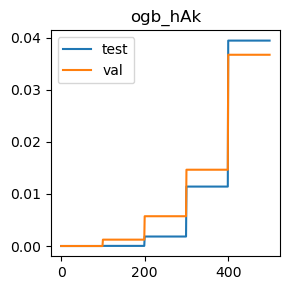

Last Validation Scores: {'ogb_hAk': 0.03671463566286361}
Best Validation Scores: {'ogb_hAk': 0.03671463566286361} at iterations {'ogb_hAk': 400}
Last Test Scores: {'ogb_hAk': 0.0394339608507068}
Best Test Scores: {'ogb_hAk': 0.0394339608507068} at iterations {'ogb_hAk': 400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 999


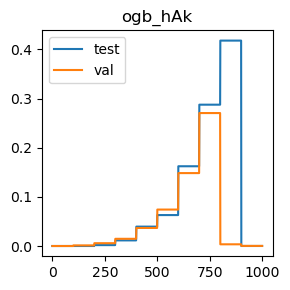

Last Validation Scores: {'ogb_hAk': 0.00022473761883001596}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 5.2438777727003724e-05}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1499


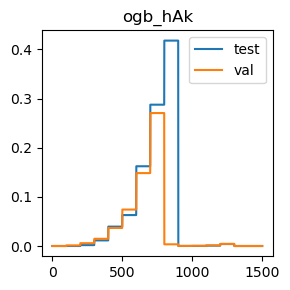

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1999


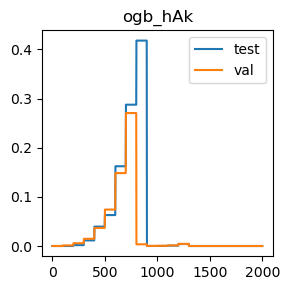

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2499


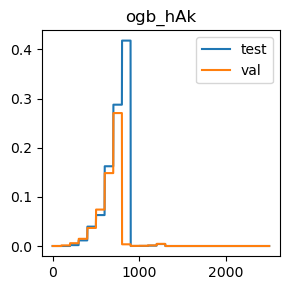

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2999


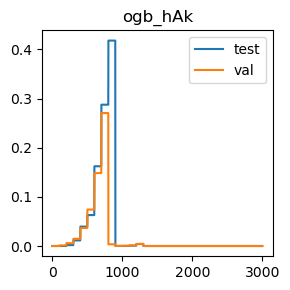

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3499


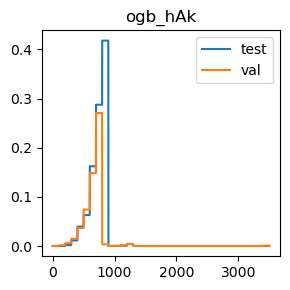

Last Validation Scores: {'ogb_hAk': 0.0006891953644120489}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3999


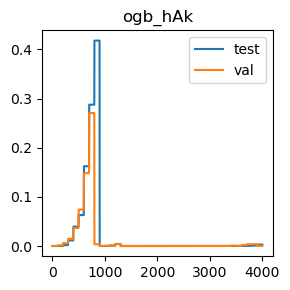

Last Validation Scores: {'ogb_hAk': 0.0002846676505180202}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.0027642727116091964}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4499


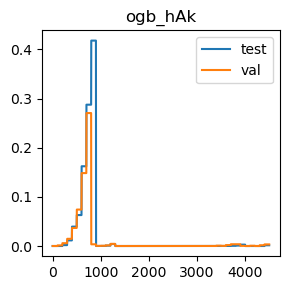

Last Validation Scores: {'ogb_hAk': 0.003266186726996232}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.0015057420461611069}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4999


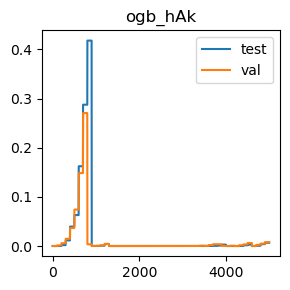

Last Validation Scores: {'ogb_hAk': 0.007865816659050558}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.006599794739641469}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5499


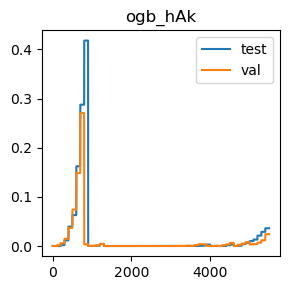

Last Validation Scores: {'ogb_hAk': 0.024106855246499713}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.03610035283806156}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5999


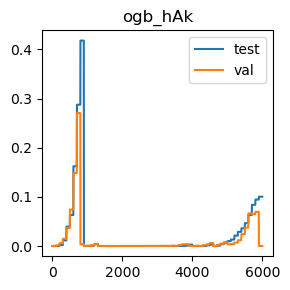

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.10029290802987512}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6499


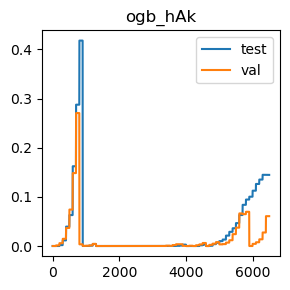

Last Validation Scores: {'ogb_hAk': 0.06069413959202631}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.14467858774880327}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6999


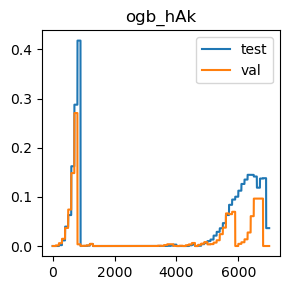

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.036355055472735584}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7499


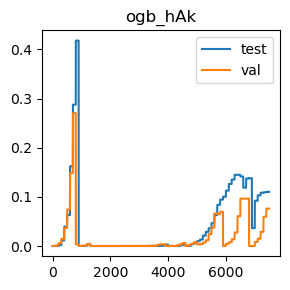

Last Validation Scores: {'ogb_hAk': 0.0761036489898044}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.11015139824255182}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7999


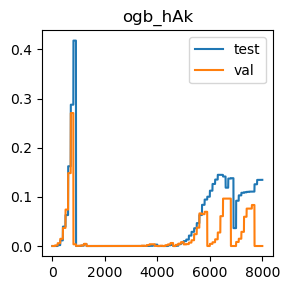

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.13458037740937456}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8499


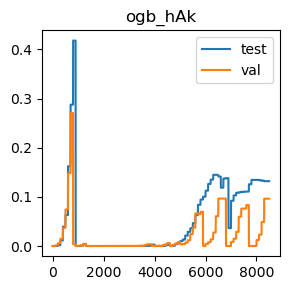

Last Validation Scores: {'ogb_hAk': 0.09619519211320783}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.13189101723737537}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8999


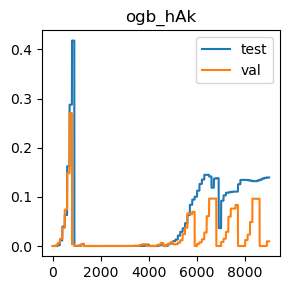

Last Validation Scores: {'ogb_hAk': 0.009483927514626673}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.1394197274681809}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9499


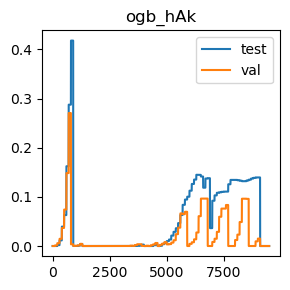

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9999


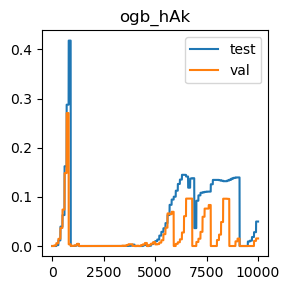

Last Validation Scores: {'ogb_hAk': 0.01534957936609009}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.049756908808965536}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10499


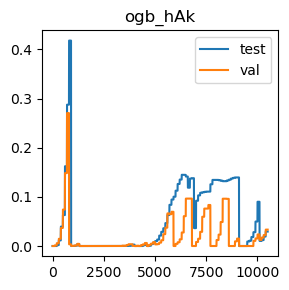

Last Validation Scores: {'ogb_hAk': 0.03332109761853037}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.029395680542966086}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10999


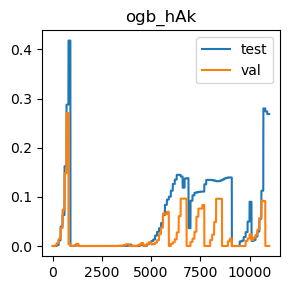

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.26834420813700005}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11499


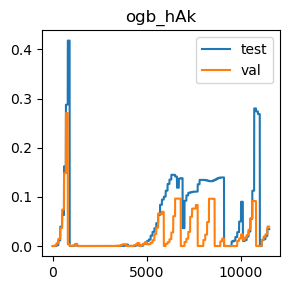

Last Validation Scores: {'ogb_hAk': 0.039374030819018795}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.03437736442703144}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11999


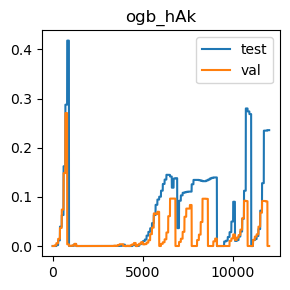

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.23570481462892073}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12499


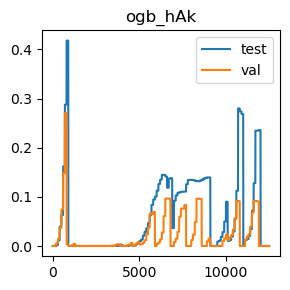

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12999


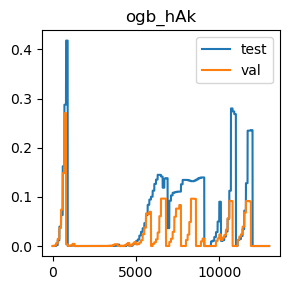

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13499


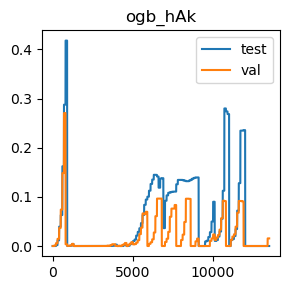

Last Validation Scores: {'ogb_hAk': 0.015454456921544098}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


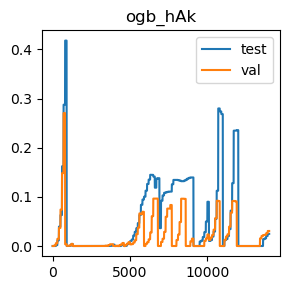

Last Validation Scores: {'ogb_hAk': 0.03057180741484317}
Best Validation Scores: {'ogb_hAk': 0.2704492505000412} at iterations {'ogb_hAk': 700}
Last Test Scores: {'ogb_hAk': 0.02475859434110676}
Best Test Scores: {'ogb_hAk': 0.41783967218272666} at iterations {'ogb_hAk': 800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.02475859434110676
val
key='ogb_hAk': 0.03057180741484317


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 10:30:14 starting optimization of bigclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 90,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 3e-06,
        

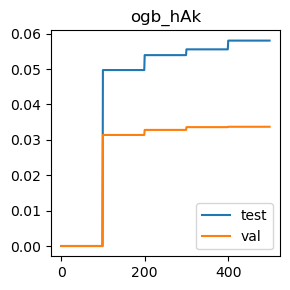

Last Validation Scores: {'ogb_hAk': 0.03369566031658039}
Best Validation Scores: {'ogb_hAk': 0.03369566031658039} at iterations {'ogb_hAk': 400}
Last Test Scores: {'ogb_hAk': 0.05804223568983212}
Best Test Scores: {'ogb_hAk': 0.05804223568983212} at iterations {'ogb_hAk': 400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 999


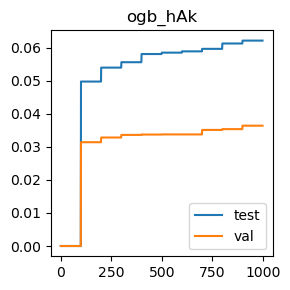

Last Validation Scores: {'ogb_hAk': 0.03637752923461858}
Best Validation Scores: {'ogb_hAk': 0.03637752923461858} at iterations {'ogb_hAk': 900}
Last Test Scores: {'ogb_hAk': 0.06210249533669441}
Best Test Scores: {'ogb_hAk': 0.06210249533669441} at iterations {'ogb_hAk': 900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1499


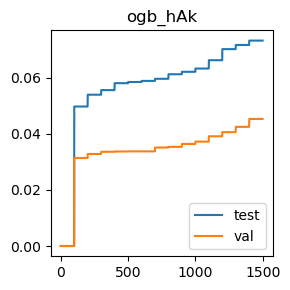

Last Validation Scores: {'ogb_hAk': 0.045299612702170214}
Best Validation Scores: {'ogb_hAk': 0.045299612702170214} at iterations {'ogb_hAk': 1400}
Last Test Scores: {'ogb_hAk': 0.0732195162148192}
Best Test Scores: {'ogb_hAk': 0.0732195162148192} at iterations {'ogb_hAk': 1400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1999


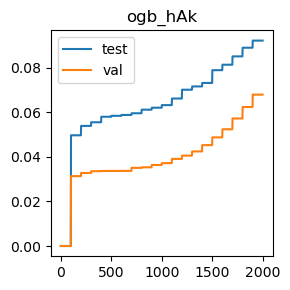

Last Validation Scores: {'ogb_hAk': 0.06799062095004083}
Best Validation Scores: {'ogb_hAk': 0.06799062095004083} at iterations {'ogb_hAk': 1900}
Last Test Scores: {'ogb_hAk': 0.09223981002179955}
Best Test Scores: {'ogb_hAk': 0.09223981002179955} at iterations {'ogb_hAk': 1900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2499


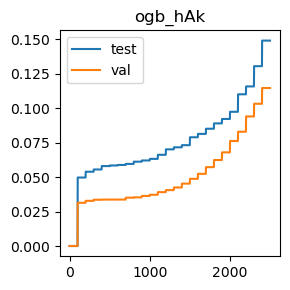

Last Validation Scores: {'ogb_hAk': 0.11471357190480115}
Best Validation Scores: {'ogb_hAk': 0.11471357190480115} at iterations {'ogb_hAk': 2400}
Last Test Scores: {'ogb_hAk': 0.14914337510955958}
Best Test Scores: {'ogb_hAk': 0.14914337510955958} at iterations {'ogb_hAk': 2400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2999


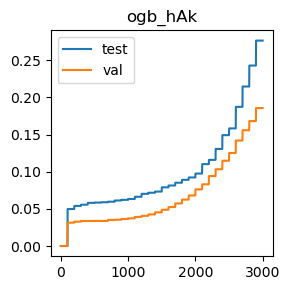

Last Validation Scores: {'ogb_hAk': 0.18555836061398318}
Best Validation Scores: {'ogb_hAk': 0.18555836061398318} at iterations {'ogb_hAk': 2900}
Last Test Scores: {'ogb_hAk': 0.2763298848594266}
Best Test Scores: {'ogb_hAk': 0.2763298848594266} at iterations {'ogb_hAk': 2900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3499


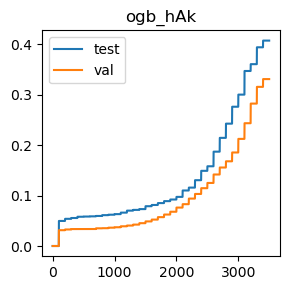

Last Validation Scores: {'ogb_hAk': 0.3311658638539505}
Best Validation Scores: {'ogb_hAk': 0.3311658638539505} at iterations {'ogb_hAk': 3400}
Last Test Scores: {'ogb_hAk': 0.4075317067323899}
Best Test Scores: {'ogb_hAk': 0.4075317067323899} at iterations {'ogb_hAk': 3400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3999


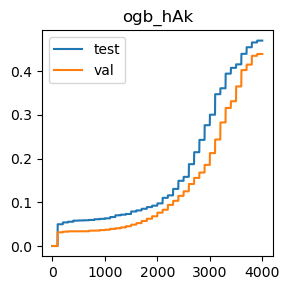

Last Validation Scores: {'ogb_hAk': 0.4392047284795002}
Best Validation Scores: {'ogb_hAk': 0.4392047284795002} at iterations {'ogb_hAk': 3900}
Last Test Scores: {'ogb_hAk': 0.46982897467207035}
Best Test Scores: {'ogb_hAk': 0.46982897467207035} at iterations {'ogb_hAk': 3900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4499


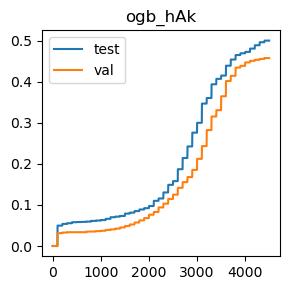

Last Validation Scores: {'ogb_hAk': 0.45826996981024654}
Best Validation Scores: {'ogb_hAk': 0.45826996981024654} at iterations {'ogb_hAk': 4400}
Last Test Scores: {'ogb_hAk': 0.5007753447849635}
Best Test Scores: {'ogb_hAk': 0.5007753447849635} at iterations {'ogb_hAk': 4400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4999


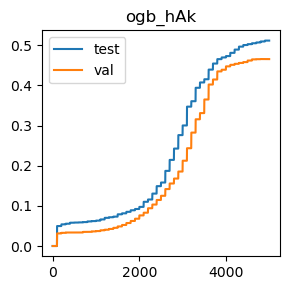

Last Validation Scores: {'ogb_hAk': 0.46573125875540305}
Best Validation Scores: {'ogb_hAk': 0.46584362756481806} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.5118099618695173}
Best Test Scores: {'ogb_hAk': 0.5118099618695173} at iterations {'ogb_hAk': 4900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5499


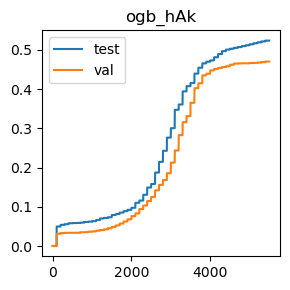

Last Validation Scores: {'ogb_hAk': 0.47029343241765237}
Best Validation Scores: {'ogb_hAk': 0.47029343241765237} at iterations {'ogb_hAk': 5400}
Last Test Scores: {'ogb_hAk': 0.5236835993977031}
Best Test Scores: {'ogb_hAk': 0.5236835993977031} at iterations {'ogb_hAk': 5400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5999


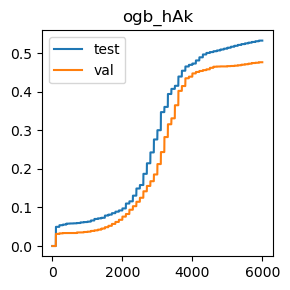

Last Validation Scores: {'ogb_hAk': 0.47662354201469787}
Best Validation Scores: {'ogb_hAk': 0.47662354201469787} at iterations {'ogb_hAk': 5900}
Last Test Scores: {'ogb_hAk': 0.5327480166905139}
Best Test Scores: {'ogb_hAk': 0.5327480166905139} at iterations {'ogb_hAk': 5900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6499


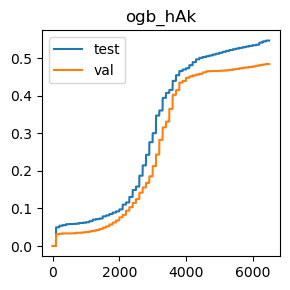

Last Validation Scores: {'ogb_hAk': 0.4841971997692694}
Best Validation Scores: {'ogb_hAk': 0.4841971997692694} at iterations {'ogb_hAk': 6400}
Last Test Scores: {'ogb_hAk': 0.5467491703436238}
Best Test Scores: {'ogb_hAk': 0.5467491703436238} at iterations {'ogb_hAk': 6400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6999


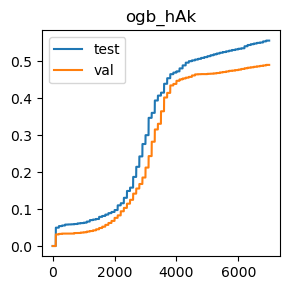

Last Validation Scores: {'ogb_hAk': 0.49072957322326183}
Best Validation Scores: {'ogb_hAk': 0.49072957322326183} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.5565552217785735}
Best Test Scores: {'ogb_hAk': 0.5565552217785735} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7499


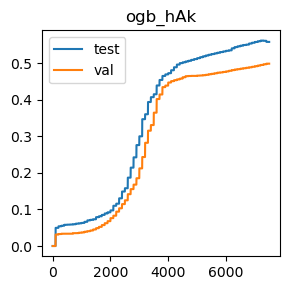

Last Validation Scores: {'ogb_hAk': 0.4992471289769195}
Best Validation Scores: {'ogb_hAk': 0.4992471289769195} at iterations {'ogb_hAk': 7400}
Last Test Scores: {'ogb_hAk': 0.5588625279985617}
Best Test Scores: {'ogb_hAk': 0.5624208736300369} at iterations {'ogb_hAk': 7200}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7999


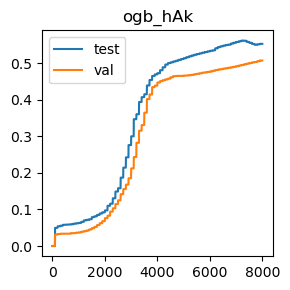

Last Validation Scores: {'ogb_hAk': 0.5078845447939531}
Best Validation Scores: {'ogb_hAk': 0.5078845447939531} at iterations {'ogb_hAk': 7900}
Last Test Scores: {'ogb_hAk': 0.5534987901624853}
Best Test Scores: {'ogb_hAk': 0.5624208736300369} at iterations {'ogb_hAk': 7200}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8499


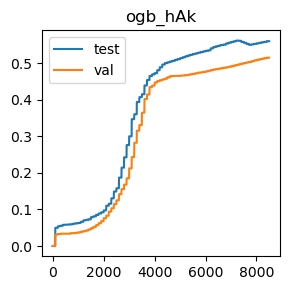

Last Validation Scores: {'ogb_hAk': 0.5156230101356666}
Best Validation Scores: {'ogb_hAk': 0.5156230101356666} at iterations {'ogb_hAk': 8400}
Last Test Scores: {'ogb_hAk': 0.5607952715204998}
Best Test Scores: {'ogb_hAk': 0.5624208736300369} at iterations {'ogb_hAk': 7200}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8999


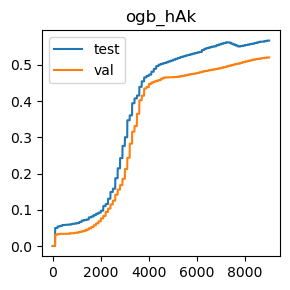

Last Validation Scores: {'ogb_hAk': 0.5206346590355759}
Best Validation Scores: {'ogb_hAk': 0.5206346590355759} at iterations {'ogb_hAk': 8900}
Last Test Scores: {'ogb_hAk': 0.5671928024031943}
Best Test Scores: {'ogb_hAk': 0.5671928024031943} at iterations {'ogb_hAk': 8900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9499


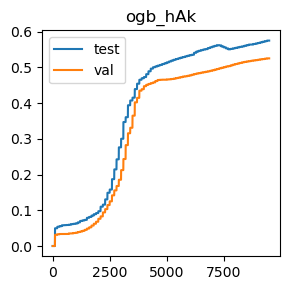

Last Validation Scores: {'ogb_hAk': 0.5255339391260703}
Best Validation Scores: {'ogb_hAk': 0.5255339391260703} at iterations {'ogb_hAk': 9400}
Last Test Scores: {'ogb_hAk': 0.5753133216969188}
Best Test Scores: {'ogb_hAk': 0.5753133216969188} at iterations {'ogb_hAk': 9400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9999


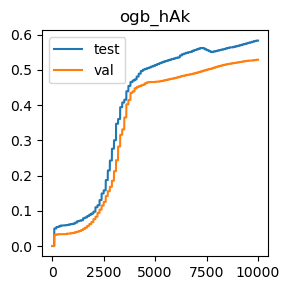

Last Validation Scores: {'ogb_hAk': 0.5290997760115066}
Best Validation Scores: {'ogb_hAk': 0.5290997760115066} at iterations {'ogb_hAk': 9900}
Last Test Scores: {'ogb_hAk': 0.5834188584827215}
Best Test Scores: {'ogb_hAk': 0.5834188584827215} at iterations {'ogb_hAk': 9900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10499


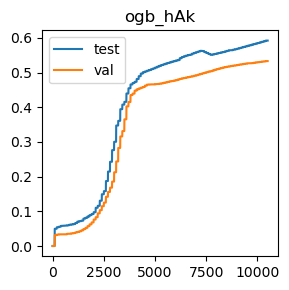

Last Validation Scores: {'ogb_hAk': 0.5329203155316168}
Best Validation Scores: {'ogb_hAk': 0.5329203155316168} at iterations {'ogb_hAk': 10400}
Last Test Scores: {'ogb_hAk': 0.591973870506184}
Best Test Scores: {'ogb_hAk': 0.591973870506184} at iterations {'ogb_hAk': 10400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10999


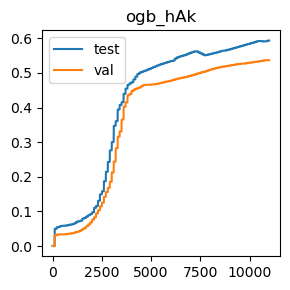

Last Validation Scores: {'ogb_hAk': 0.5367558375596491}
Best Validation Scores: {'ogb_hAk': 0.5367558375596491} at iterations {'ogb_hAk': 10900}
Last Test Scores: {'ogb_hAk': 0.5933297874731251}
Best Test Scores: {'ogb_hAk': 0.5933297874731251} at iterations {'ogb_hAk': 10900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11499


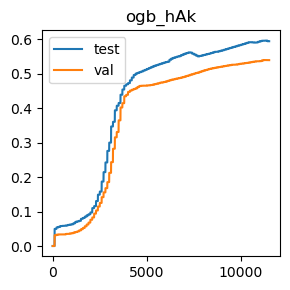

Last Validation Scores: {'ogb_hAk': 0.5400220242866454}
Best Validation Scores: {'ogb_hAk': 0.5403066919371634} at iterations {'ogb_hAk': 11200}
Last Test Scores: {'ogb_hAk': 0.5949928458524673}
Best Test Scores: {'ogb_hAk': 0.5967532905333024} at iterations {'ogb_hAk': 11300}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11999


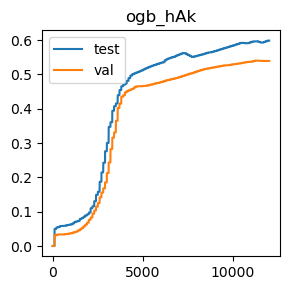

Last Validation Scores: {'ogb_hAk': 0.5394077414618433}
Best Validation Scores: {'ogb_hAk': 0.5403066919371634} at iterations {'ogb_hAk': 11200}
Last Test Scores: {'ogb_hAk': 0.5987234903250455}
Best Test Scores: {'ogb_hAk': 0.5987234903250455} at iterations {'ogb_hAk': 11900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12499


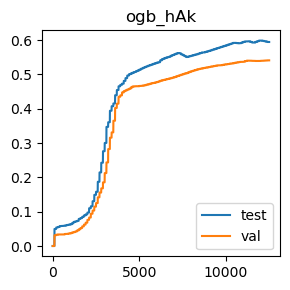

Last Validation Scores: {'ogb_hAk': 0.5411532036347564}
Best Validation Scores: {'ogb_hAk': 0.5411532036347564} at iterations {'ogb_hAk': 12400}
Last Test Scores: {'ogb_hAk': 0.5946931956940272}
Best Test Scores: {'ogb_hAk': 0.5987384728329675} at iterations {'ogb_hAk': 12000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12999


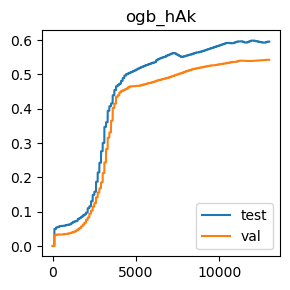

Last Validation Scores: {'ogb_hAk': 0.5428462270299426}
Best Validation Scores: {'ogb_hAk': 0.5428462270299426} at iterations {'ogb_hAk': 12900}
Last Test Scores: {'ogb_hAk': 0.5958168837881773}
Best Test Scores: {'ogb_hAk': 0.5987384728329675} at iterations {'ogb_hAk': 12000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13499


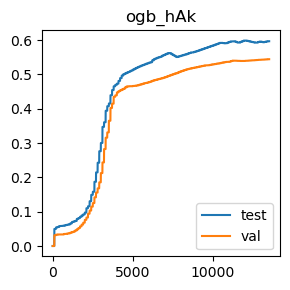

Last Validation Scores: {'ogb_hAk': 0.5445092854092847}
Best Validation Scores: {'ogb_hAk': 0.5445092854092847} at iterations {'ogb_hAk': 13400}
Last Test Scores: {'ogb_hAk': 0.5969405718823274}
Best Test Scores: {'ogb_hAk': 0.5987384728329675} at iterations {'ogb_hAk': 12000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


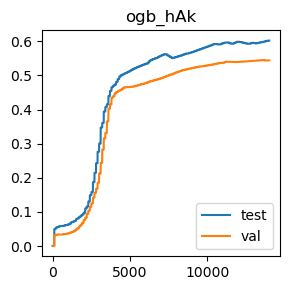

Last Validation Scores: {'ogb_hAk': 0.5440972664414296}
Best Validation Scores: {'ogb_hAk': 0.5451235682340867} at iterations {'ogb_hAk': 13600}
Last Test Scores: {'ogb_hAk': 0.6021919409089888}
Best Test Scores: {'ogb_hAk': 0.6021919409089888} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.6021919409089888
val
key='ogb_hAk': 0.5440972664414296


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 10:37:43 starting optimization of bigclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 90,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 6e-06,
        "

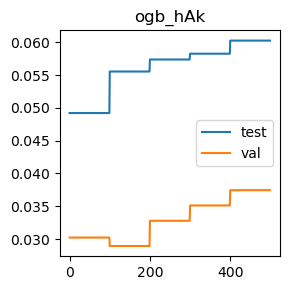

Last Validation Scores: {'ogb_hAk': 0.03744877855104166}
Best Validation Scores: {'ogb_hAk': 0.03744877855104166} at iterations {'ogb_hAk': 400}
Last Test Scores: {'ogb_hAk': 0.06028212062417128}
Best Test Scores: {'ogb_hAk': 0.06028212062417128} at iterations {'ogb_hAk': 400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 999


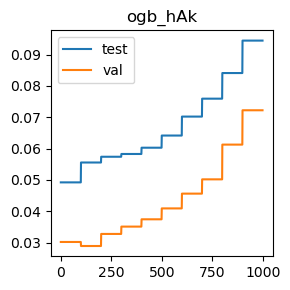

Last Validation Scores: {'ogb_hAk': 0.07222317943800613}
Best Validation Scores: {'ogb_hAk': 0.07222317943800613} at iterations {'ogb_hAk': 900}
Last Test Scores: {'ogb_hAk': 0.09444223868633371}
Best Test Scores: {'ogb_hAk': 0.09444223868633371} at iterations {'ogb_hAk': 900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1499


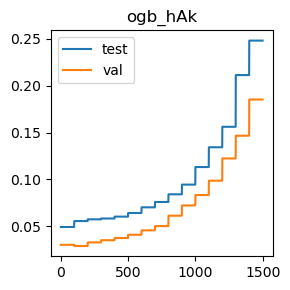

Last Validation Scores: {'ogb_hAk': 0.18527369296346516}
Best Validation Scores: {'ogb_hAk': 0.18527369296346516} at iterations {'ogb_hAk': 1400}
Last Test Scores: {'ogb_hAk': 0.24812531369625962}
Best Test Scores: {'ogb_hAk': 0.24812531369625962} at iterations {'ogb_hAk': 1400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1999


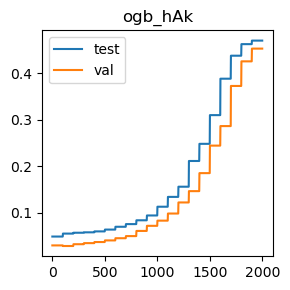

Last Validation Scores: {'ogb_hAk': 0.45241930046670514}
Best Validation Scores: {'ogb_hAk': 0.45241930046670514} at iterations {'ogb_hAk': 1900}
Last Test Scores: {'ogb_hAk': 0.46958925454531836}
Best Test Scores: {'ogb_hAk': 0.46958925454531836} at iterations {'ogb_hAk': 1900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2499


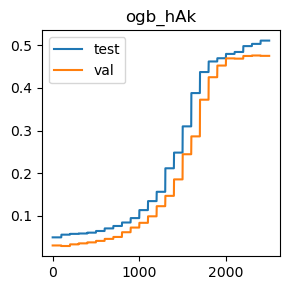

Last Validation Scores: {'ogb_hAk': 0.47517773000022473}
Best Validation Scores: {'ogb_hAk': 0.4760542067136618} at iterations {'ogb_hAk': 2300}
Last Test Scores: {'ogb_hAk': 0.5109859239338073}
Best Test Scores: {'ogb_hAk': 0.5109859239338073} at iterations {'ogb_hAk': 2400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2999


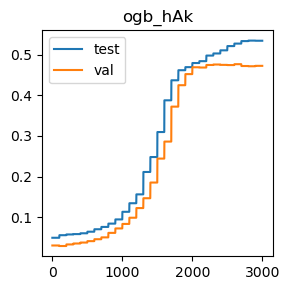

Last Validation Scores: {'ogb_hAk': 0.47278052873270454}
Best Validation Scores: {'ogb_hAk': 0.47687824464937184} at iterations {'ogb_hAk': 2600}
Last Test Scores: {'ogb_hAk': 0.534620830180764}
Best Test Scores: {'ogb_hAk': 0.53496542786297} at iterations {'ogb_hAk': 2800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3499


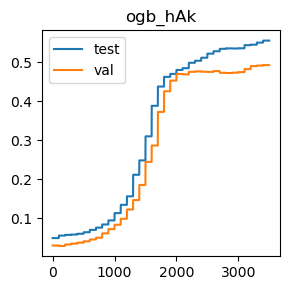

Last Validation Scores: {'ogb_hAk': 0.4921304377139689}
Best Validation Scores: {'ogb_hAk': 0.4921304377139689} at iterations {'ogb_hAk': 3400}
Last Test Scores: {'ogb_hAk': 0.5548322333675434}
Best Test Scores: {'ogb_hAk': 0.5548322333675434} at iterations {'ogb_hAk': 3400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3999


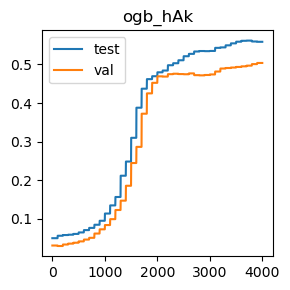

Last Validation Scores: {'ogb_hAk': 0.5039741102263108}
Best Validation Scores: {'ogb_hAk': 0.5039741102263108} at iterations {'ogb_hAk': 3900}
Last Test Scores: {'ogb_hAk': 0.5588999842683667}
Best Test Scores: {'ogb_hAk': 0.5620088546621819} at iterations {'ogb_hAk': 3700}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4499


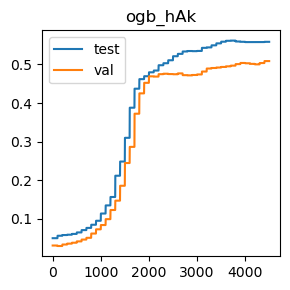

Last Validation Scores: {'ogb_hAk': 0.5088658990628442}
Best Validation Scores: {'ogb_hAk': 0.5088658990628442} at iterations {'ogb_hAk': 4400}
Last Test Scores: {'ogb_hAk': 0.5588325629827177}
Best Test Scores: {'ogb_hAk': 0.5620088546621819} at iterations {'ogb_hAk': 3700}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4999


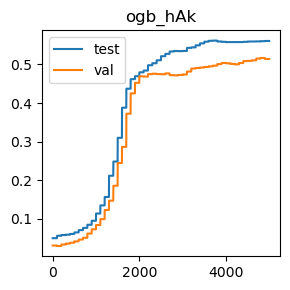

Last Validation Scores: {'ogb_hAk': 0.5142820756766475}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.5610874304249789}
Best Test Scores: {'ogb_hAk': 0.5620088546621819} at iterations {'ogb_hAk': 3700}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5499


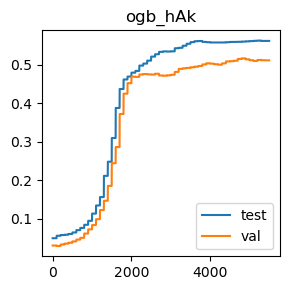

Last Validation Scores: {'ogb_hAk': 0.5116751192982193}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.5622560660428949}
Best Test Scores: {'ogb_hAk': 0.563065121470683} at iterations {'ogb_hAk': 5200}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5999


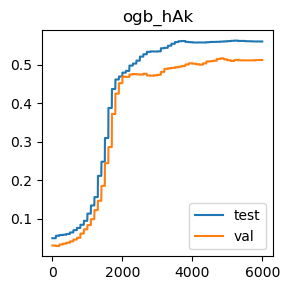

Last Validation Scores: {'ogb_hAk': 0.5126414910591884}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.5607353414888118}
Best Test Scores: {'ogb_hAk': 0.563065121470683} at iterations {'ogb_hAk': 5200}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6499


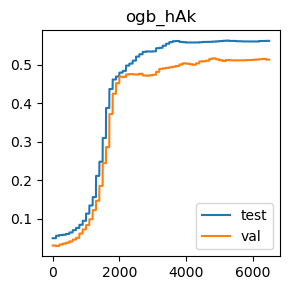

Last Validation Scores: {'ogb_hAk': 0.5137576878993775}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.5623983998681539}
Best Test Scores: {'ogb_hAk': 0.563065121470683} at iterations {'ogb_hAk': 5200}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6999


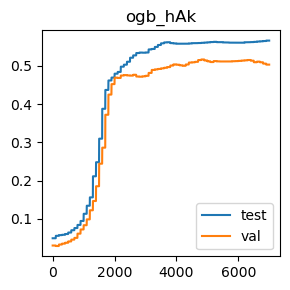

Last Validation Scores: {'ogb_hAk': 0.5034647049569627}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.5662788694199522}
Best Test Scores: {'ogb_hAk': 0.5662788694199522} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7499


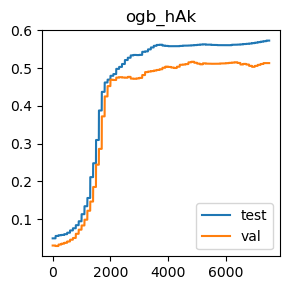

Last Validation Scores: {'ogb_hAk': 0.5133756339473664}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.5729460854452427}
Best Test Scores: {'ogb_hAk': 0.5729460854452427} at iterations {'ogb_hAk': 7400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7999


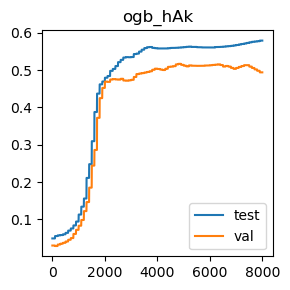

Last Validation Scores: {'ogb_hAk': 0.4941455850294781}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.5791862999947561}
Best Test Scores: {'ogb_hAk': 0.5791862999947561} at iterations {'ogb_hAk': 7900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8499


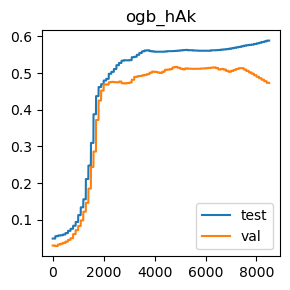

Last Validation Scores: {'ogb_hAk': 0.4733273902718576}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.5884454898905528}
Best Test Scores: {'ogb_hAk': 0.5884454898905528} at iterations {'ogb_hAk': 8400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8999


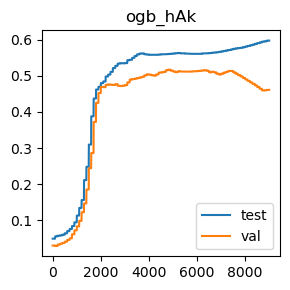

Last Validation Scores: {'ogb_hAk': 0.46101176875997274}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.5974499771516755}
Best Test Scores: {'ogb_hAk': 0.5974499771516755} at iterations {'ogb_hAk': 8900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9499


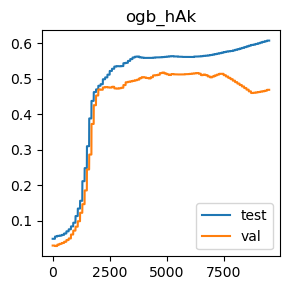

Last Validation Scores: {'ogb_hAk': 0.46836068889571425}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.6068290271108481}
Best Test Scores: {'ogb_hAk': 0.6068290271108481} at iterations {'ogb_hAk': 9400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9999


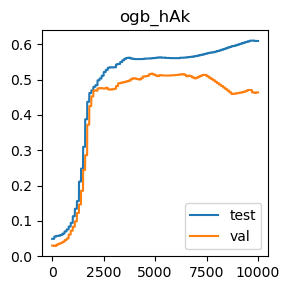

Last Validation Scores: {'ogb_hAk': 0.46376105896365993}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.6093460884417443}
Best Test Scores: {'ogb_hAk': 0.6104922502977773} at iterations {'ogb_hAk': 9700}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10499


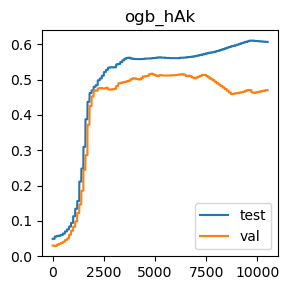

Last Validation Scores: {'ogb_hAk': 0.4701286248305104}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.6068515008727311}
Best Test Scores: {'ogb_hAk': 0.6104922502977773} at iterations {'ogb_hAk': 9700}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10999


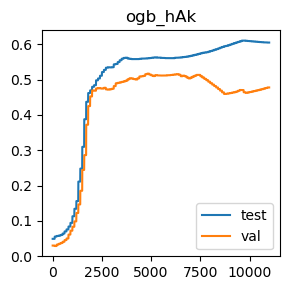

Last Validation Scores: {'ogb_hAk': 0.4778221426484579}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.604963704874559}
Best Test Scores: {'ogb_hAk': 0.6104922502977773} at iterations {'ogb_hAk': 9700}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11499


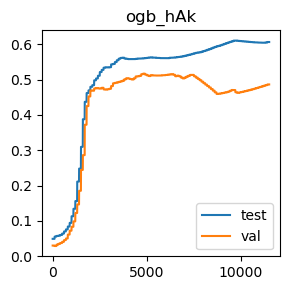

Last Validation Scores: {'ogb_hAk': 0.48635468091003753}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.606491920682603}
Best Test Scores: {'ogb_hAk': 0.6104922502977773} at iterations {'ogb_hAk': 9700}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11999


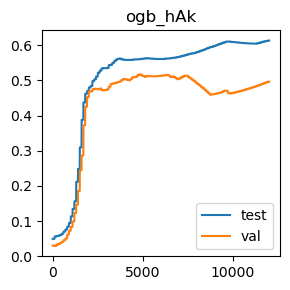

Last Validation Scores: {'ogb_hAk': 0.49612327607518225}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.6131291716920495}
Best Test Scores: {'ogb_hAk': 0.6131291716920495} at iterations {'ogb_hAk': 11900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12499


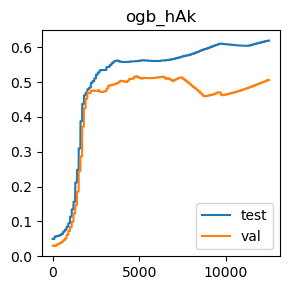

Last Validation Scores: {'ogb_hAk': 0.506131591367079}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.619459281289095}
Best Test Scores: {'ogb_hAk': 0.619459281289095} at iterations {'ogb_hAk': 12400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12999


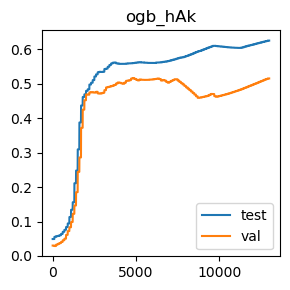

Last Validation Scores: {'ogb_hAk': 0.5157278876911207}
Best Validation Scores: {'ogb_hAk': 0.5169040145629977} at iterations {'ogb_hAk': 4800}
Last Test Scores: {'ogb_hAk': 0.6257294608544525}
Best Test Scores: {'ogb_hAk': 0.6257294608544525} at iterations {'ogb_hAk': 12900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13499


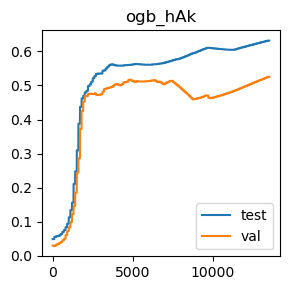

Last Validation Scores: {'ogb_hAk': 0.5251818501899033}
Best Validation Scores: {'ogb_hAk': 0.5251818501899033} at iterations {'ogb_hAk': 13400}
Last Test Scores: {'ogb_hAk': 0.6315876214519548}
Best Test Scores: {'ogb_hAk': 0.6315876214519548} at iterations {'ogb_hAk': 13400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


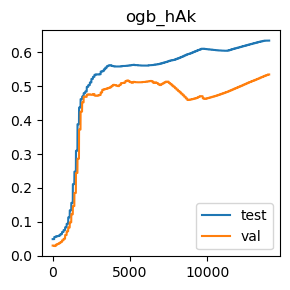

Last Validation Scores: {'ogb_hAk': 0.534583373910959}
Best Validation Scores: {'ogb_hAk': 0.534583373910959} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.634456771719018}
Best Test Scores: {'ogb_hAk': 0.634456771719018} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.634456771719018
val
key='ogb_hAk': 0.534583373910959


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 10:45:09 starting optimization of bigclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 90,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter

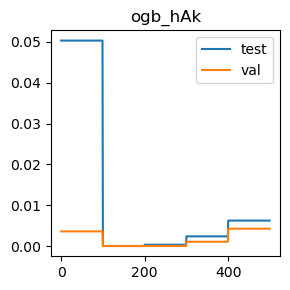

Last Validation Scores: {'ogb_hAk': 0.004247540995887302}
Best Validation Scores: {'ogb_hAk': 0.004247540995887302} at iterations {'ogb_hAk': 400}
Last Test Scores: {'ogb_hAk': 0.006225232041591442}
Best Test Scores: {'ogb_hAk': 0.050326244110001576} at iterations {'ogb_hAk': 0}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 999


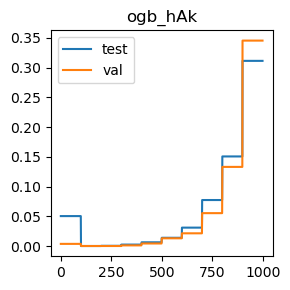

Last Validation Scores: {'ogb_hAk': 0.34555656271303253}
Best Validation Scores: {'ogb_hAk': 0.34555656271303253} at iterations {'ogb_hAk': 900}
Last Test Scores: {'ogb_hAk': 0.31147135719048014}
Best Test Scores: {'ogb_hAk': 0.31147135719048014} at iterations {'ogb_hAk': 900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1499


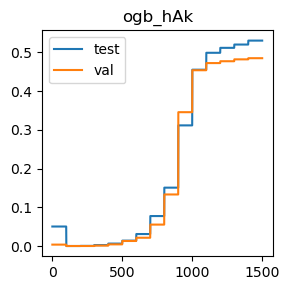

Last Validation Scores: {'ogb_hAk': 0.48496130767329143}
Best Validation Scores: {'ogb_hAk': 0.48496130767329143} at iterations {'ogb_hAk': 1400}
Last Test Scores: {'ogb_hAk': 0.5303882716927987}
Best Test Scores: {'ogb_hAk': 0.5303882716927987} at iterations {'ogb_hAk': 1400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1999


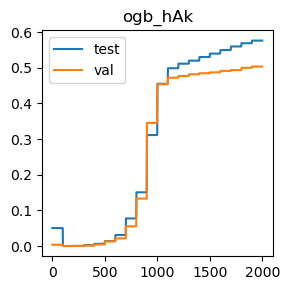

Last Validation Scores: {'ogb_hAk': 0.5036819513218318}
Best Validation Scores: {'ogb_hAk': 0.5036819513218318} at iterations {'ogb_hAk': 1900}
Last Test Scores: {'ogb_hAk': 0.576459483552952}
Best Test Scores: {'ogb_hAk': 0.576459483552952} at iterations {'ogb_hAk': 1900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2499


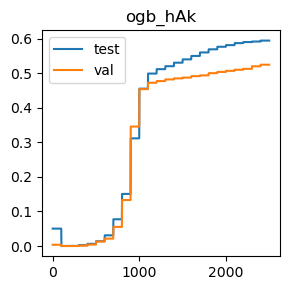

Last Validation Scores: {'ogb_hAk': 0.5245301110952962}
Best Validation Scores: {'ogb_hAk': 0.5245301110952962} at iterations {'ogb_hAk': 2400}
Last Test Scores: {'ogb_hAk': 0.5942811767261722}
Best Test Scores: {'ogb_hAk': 0.5942811767261722} at iterations {'ogb_hAk': 2400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2999


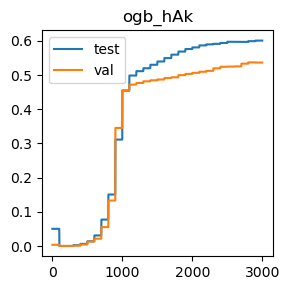

Last Validation Scores: {'ogb_hAk': 0.5368981713849081}
Best Validation Scores: {'ogb_hAk': 0.5373551378765291} at iterations {'ogb_hAk': 2800}
Last Test Scores: {'ogb_hAk': 0.6011281828465267}
Best Test Scores: {'ogb_hAk': 0.6011281828465267} at iterations {'ogb_hAk': 2900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3499


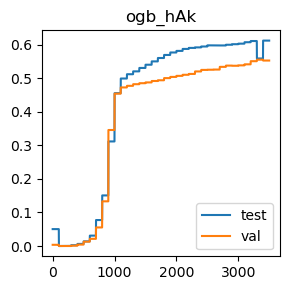

Last Validation Scores: {'ogb_hAk': 0.5524275408460623}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.6118406760107574}
Best Test Scores: {'ogb_hAk': 0.6118406760107574} at iterations {'ogb_hAk': 3400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3999


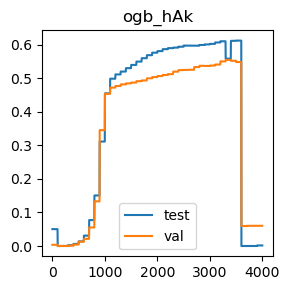

Last Validation Scores: {'ogb_hAk': 0.06031957689397628}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.001663058379342118}
Best Test Scores: {'ogb_hAk': 0.6125373626291305} at iterations {'ogb_hAk': 3500}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4499


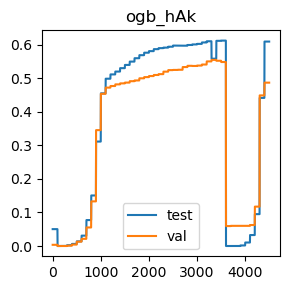

Last Validation Scores: {'ogb_hAk': 0.4871412625759426}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.6096682123620673}
Best Test Scores: {'ogb_hAk': 0.6125373626291305} at iterations {'ogb_hAk': 3500}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4999


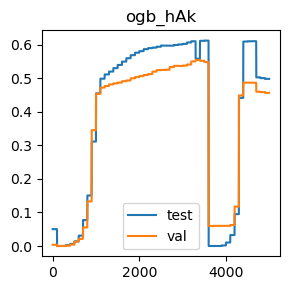

Last Validation Scores: {'ogb_hAk': 0.4568466315576564}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.49845305605705337}
Best Test Scores: {'ogb_hAk': 0.6125373626291305} at iterations {'ogb_hAk': 3500}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5499


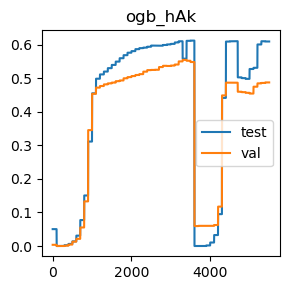

Last Validation Scores: {'ogb_hAk': 0.48781547543243264}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.6098779674729753}
Best Test Scores: {'ogb_hAk': 0.6125373626291305} at iterations {'ogb_hAk': 3500}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5999


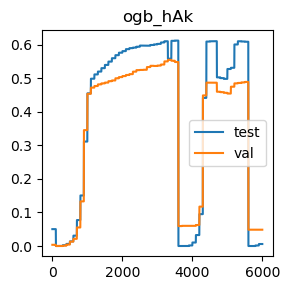

Last Validation Scores: {'ogb_hAk': 0.04861074695293245}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.005940564391073422}
Best Test Scores: {'ogb_hAk': 0.6125373626291305} at iterations {'ogb_hAk': 3500}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6499


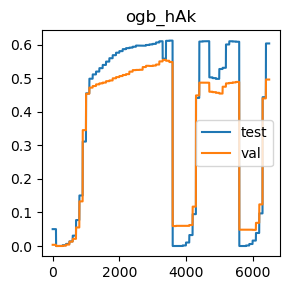

Last Validation Scores: {'ogb_hAk': 0.49643041748758326}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.6040048243675509}
Best Test Scores: {'ogb_hAk': 0.6125373626291305} at iterations {'ogb_hAk': 3500}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6999


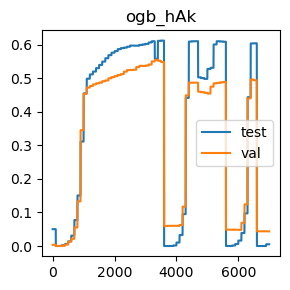

Last Validation Scores: {'ogb_hAk': 0.04377139689412611}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.005221404010817371}
Best Test Scores: {'ogb_hAk': 0.6125373626291305} at iterations {'ogb_hAk': 3500}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7499


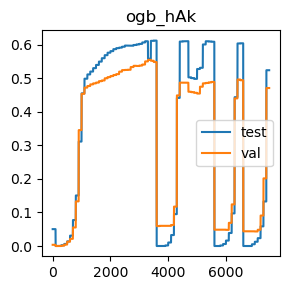

Last Validation Scores: {'ogb_hAk': 0.47110248784544045}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.5242304609368562}
Best Test Scores: {'ogb_hAk': 0.6125373626291305} at iterations {'ogb_hAk': 3500}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7999


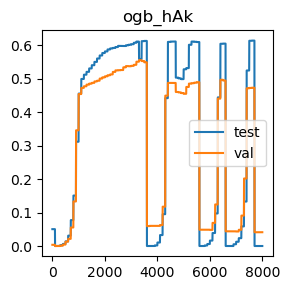

Last Validation Scores: {'ogb_hAk': 0.041179423023619925}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.6134962431361386} at iterations {'ogb_hAk': 7600}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8499


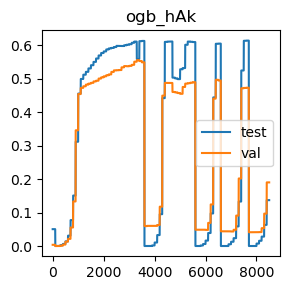

Last Validation Scores: {'ogb_hAk': 0.18998569170493448}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.1369850699308557}
Best Test Scores: {'ogb_hAk': 0.6134962431361386} at iterations {'ogb_hAk': 7600}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8999


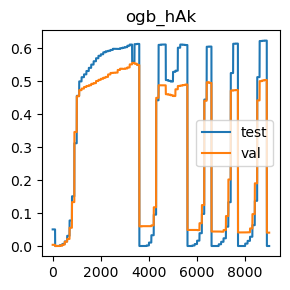

Last Validation Scores: {'ogb_hAk': 0.040467753897324876}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.6225681516829102} at iterations {'ogb_hAk': 8800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9499


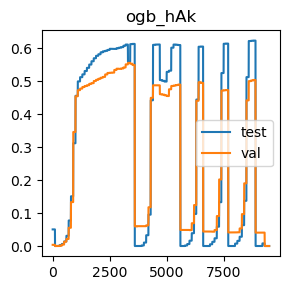

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.6225681516829102} at iterations {'ogb_hAk': 8800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9999


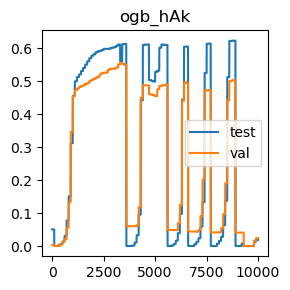

Last Validation Scores: {'ogb_hAk': 0.023739783802410687}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.018608274839125322}
Best Test Scores: {'ogb_hAk': 0.6225681516829102} at iterations {'ogb_hAk': 8800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10499


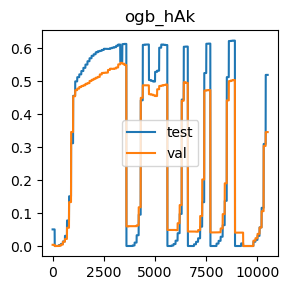

Last Validation Scores: {'ogb_hAk': 0.3453018600783585}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.5186494767359108}
Best Test Scores: {'ogb_hAk': 0.6225681516829102} at iterations {'ogb_hAk': 8800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10999


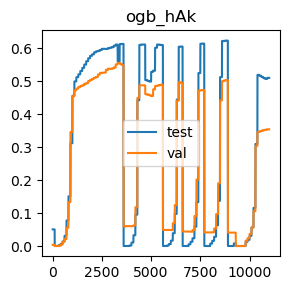

Last Validation Scores: {'ogb_hAk': 0.3536021694671471}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.5096374982208272}
Best Test Scores: {'ogb_hAk': 0.6225681516829102} at iterations {'ogb_hAk': 8800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11499


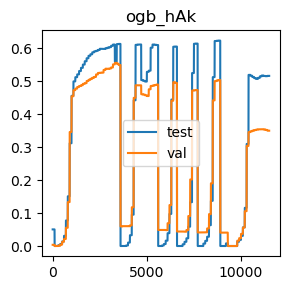

Last Validation Scores: {'ogb_hAk': 0.3495119448044408}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.5156529751515107}
Best Test Scores: {'ogb_hAk': 0.6225681516829102} at iterations {'ogb_hAk': 8800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11999


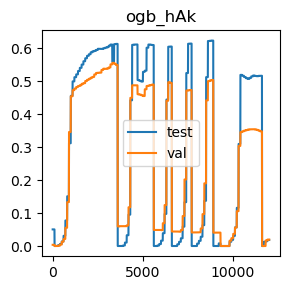

Last Validation Scores: {'ogb_hAk': 0.01943980402879638}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.0182861509188023}
Best Test Scores: {'ogb_hAk': 0.6225681516829102} at iterations {'ogb_hAk': 8800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12499


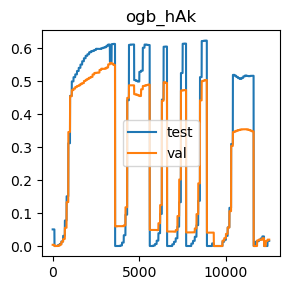

Last Validation Scores: {'ogb_hAk': 0.01931245271145937}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.01565672077849111}
Best Test Scores: {'ogb_hAk': 0.6225681516829102} at iterations {'ogb_hAk': 8800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12999


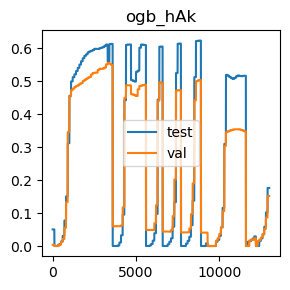

Last Validation Scores: {'ogb_hAk': 0.15159301515480678}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.1760219943216295}
Best Test Scores: {'ogb_hAk': 0.6225681516829102} at iterations {'ogb_hAk': 8800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13499


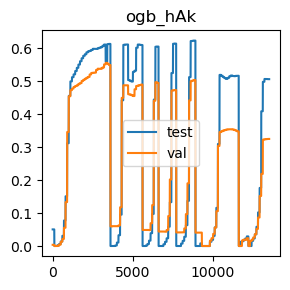

Last Validation Scores: {'ogb_hAk': 0.32451363033658204}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.5057120811452629}
Best Test Scores: {'ogb_hAk': 0.6225681516829102} at iterations {'ogb_hAk': 8800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


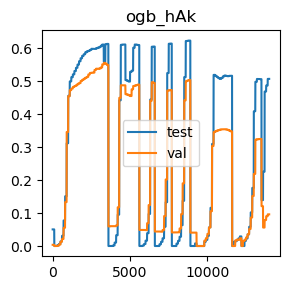

Last Validation Scores: {'ogb_hAk': 0.09594798073249482}
Best Validation Scores: {'ogb_hAk': 0.5550419884784514} at iterations {'ogb_hAk': 3300}
Last Test Scores: {'ogb_hAk': 0.506543610334934}
Best Test Scores: {'ogb_hAk': 0.6225681516829102} at iterations {'ogb_hAk': 8800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.506543610334934
val
key='ogb_hAk': 0.09594798073249482


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 10:52:37 starting optimization of bigclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 3e-06,
        "n

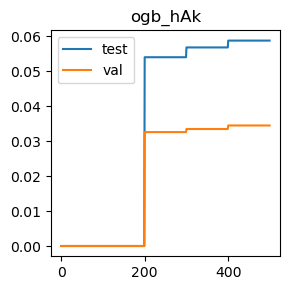

Last Validation Scores: {'ogb_hAk': 0.03448973323644645}
Best Validation Scores: {'ogb_hAk': 0.03448973323644645} at iterations {'ogb_hAk': 400}
Last Test Scores: {'ogb_hAk': 0.05877637857801017}
Best Test Scores: {'ogb_hAk': 0.05877637857801017} at iterations {'ogb_hAk': 400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 999


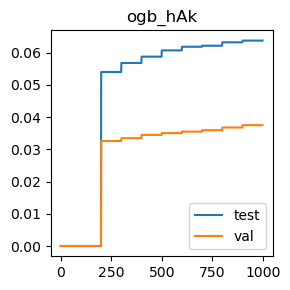

Last Validation Scores: {'ogb_hAk': 0.03751619983669066}
Best Validation Scores: {'ogb_hAk': 0.03751619983669066} at iterations {'ogb_hAk': 900}
Last Test Scores: {'ogb_hAk': 0.06376555371603652}
Best Test Scores: {'ogb_hAk': 0.06376555371603652} at iterations {'ogb_hAk': 900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1499


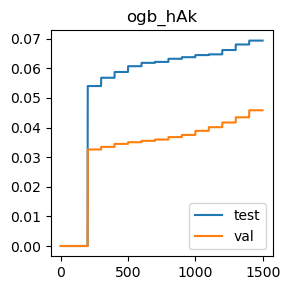

Last Validation Scores: {'ogb_hAk': 0.04583149173340125}
Best Validation Scores: {'ogb_hAk': 0.04583149173340125} at iterations {'ogb_hAk': 1400}
Last Test Scores: {'ogb_hAk': 0.06936901167886493}
Best Test Scores: {'ogb_hAk': 0.06936901167886493} at iterations {'ogb_hAk': 1400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1999


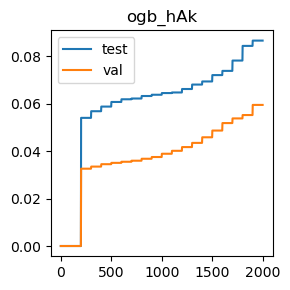

Last Validation Scores: {'ogb_hAk': 0.059480556450344224}
Best Validation Scores: {'ogb_hAk': 0.059480556450344224} at iterations {'ogb_hAk': 1900}
Last Test Scores: {'ogb_hAk': 0.08659140453520515}
Best Test Scores: {'ogb_hAk': 0.08659140453520515} at iterations {'ogb_hAk': 1900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2499


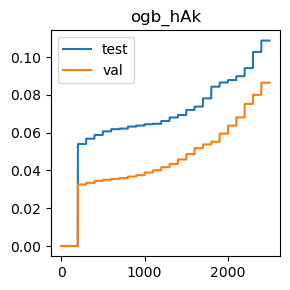

Last Validation Scores: {'ogb_hAk': 0.08649401823371214}
Best Validation Scores: {'ogb_hAk': 0.08649401823371214} at iterations {'ogb_hAk': 2400}
Last Test Scores: {'ogb_hAk': 0.10875802500580573}
Best Test Scores: {'ogb_hAk': 0.10875802500580573} at iterations {'ogb_hAk': 2400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2999


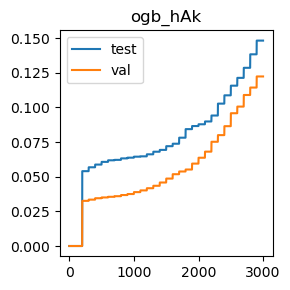

Last Validation Scores: {'ogb_hAk': 0.12237712470690469}
Best Validation Scores: {'ogb_hAk': 0.12237712470690469} at iterations {'ogb_hAk': 2900}
Last Test Scores: {'ogb_hAk': 0.14825940714216151}
Best Test Scores: {'ogb_hAk': 0.14825940714216151} at iterations {'ogb_hAk': 2900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3499


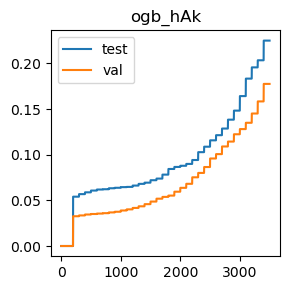

Last Validation Scores: {'ogb_hAk': 0.1775277363677906}
Best Validation Scores: {'ogb_hAk': 0.1775277363677906} at iterations {'ogb_hAk': 3400}
Last Test Scores: {'ogb_hAk': 0.22493988268696297}
Best Test Scores: {'ogb_hAk': 0.22493988268696297} at iterations {'ogb_hAk': 3400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3999


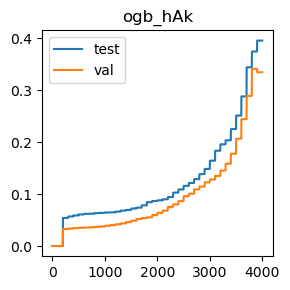

Last Validation Scores: {'ogb_hAk': 0.33418483920023373}
Best Validation Scores: {'ogb_hAk': 0.34098689779682223} at iterations {'ogb_hAk': 3800}
Last Test Scores: {'ogb_hAk': 0.39517113769673906}
Best Test Scores: {'ogb_hAk': 0.39517113769673906} at iterations {'ogb_hAk': 3900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4499


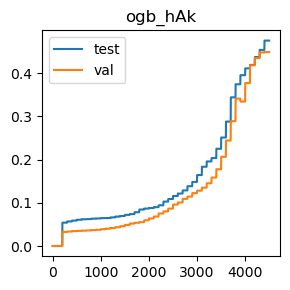

Last Validation Scores: {'ogb_hAk': 0.44864370847036084}
Best Validation Scores: {'ogb_hAk': 0.44864370847036084} at iterations {'ogb_hAk': 4400}
Last Test Scores: {'ogb_hAk': 0.4751477649843807}
Best Test Scores: {'ogb_hAk': 0.4751477649843807} at iterations {'ogb_hAk': 4400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4999


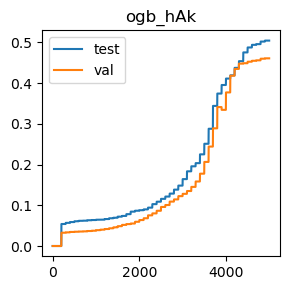

Last Validation Scores: {'ogb_hAk': 0.46062222355400073}
Best Validation Scores: {'ogb_hAk': 0.46062222355400073} at iterations {'ogb_hAk': 4900}
Last Test Scores: {'ogb_hAk': 0.5041314265594918}
Best Test Scores: {'ogb_hAk': 0.5041314265594918} at iterations {'ogb_hAk': 4900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5499


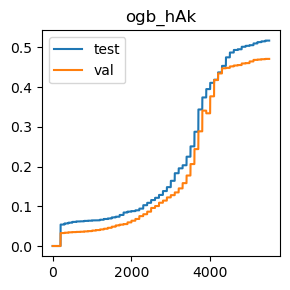

Last Validation Scores: {'ogb_hAk': 0.47122983916277744}
Best Validation Scores: {'ogb_hAk': 0.47122983916277744} at iterations {'ogb_hAk': 5400}
Last Test Scores: {'ogb_hAk': 0.5173085422768917}
Best Test Scores: {'ogb_hAk': 0.5173085422768917} at iterations {'ogb_hAk': 5400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5999


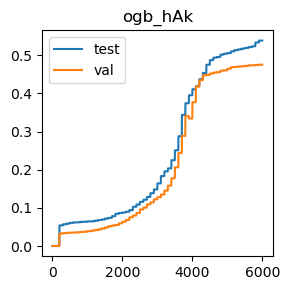

Last Validation Scores: {'ogb_hAk': 0.47529009880963974}
Best Validation Scores: {'ogb_hAk': 0.47529009880963974} at iterations {'ogb_hAk': 5900}
Last Test Scores: {'ogb_hAk': 0.5384863172246402}
Best Test Scores: {'ogb_hAk': 0.5384863172246402} at iterations {'ogb_hAk': 5900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6499


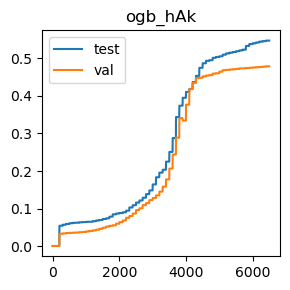

Last Validation Scores: {'ogb_hAk': 0.47903572579014003}
Best Validation Scores: {'ogb_hAk': 0.47903572579014003} at iterations {'ogb_hAk': 6400}
Last Test Scores: {'ogb_hAk': 0.5477005595966709}
Best Test Scores: {'ogb_hAk': 0.5477005595966709} at iterations {'ogb_hAk': 6400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6999


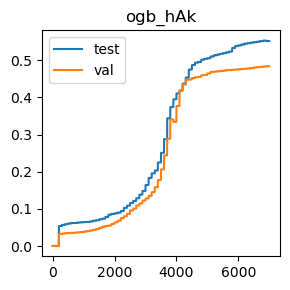

Last Validation Scores: {'ogb_hAk': 0.4842496385469964}
Best Validation Scores: {'ogb_hAk': 0.4842496385469964} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.5520829431638562}
Best Test Scores: {'ogb_hAk': 0.5531242274644352} at iterations {'ogb_hAk': 6800}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7499


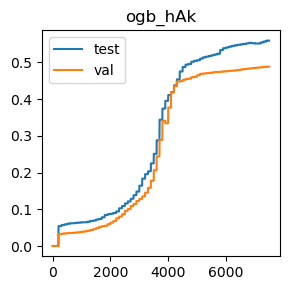

Last Validation Scores: {'ogb_hAk': 0.48820502063840465}
Best Validation Scores: {'ogb_hAk': 0.48820502063840465} at iterations {'ogb_hAk': 7400}
Last Test Scores: {'ogb_hAk': 0.5592146169347287}
Best Test Scores: {'ogb_hAk': 0.5592146169347287} at iterations {'ogb_hAk': 7400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7999


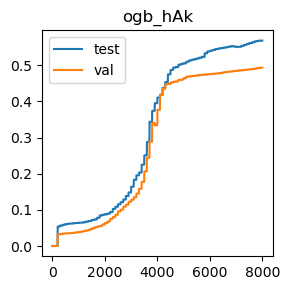

Last Validation Scores: {'ogb_hAk': 0.4937934960933111}
Best Validation Scores: {'ogb_hAk': 0.4937934960933111} at iterations {'ogb_hAk': 7900}
Last Test Scores: {'ogb_hAk': 0.5685337368622133}
Best Test Scores: {'ogb_hAk': 0.5685337368622133} at iterations {'ogb_hAk': 7900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8499


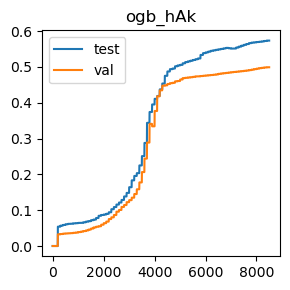

Last Validation Scores: {'ogb_hAk': 0.4990448651199724}
Best Validation Scores: {'ogb_hAk': 0.4990448651199724} at iterations {'ogb_hAk': 8400}
Last Test Scores: {'ogb_hAk': 0.5734704732225128}
Best Test Scores: {'ogb_hAk': 0.5734704732225128} at iterations {'ogb_hAk': 8400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8999


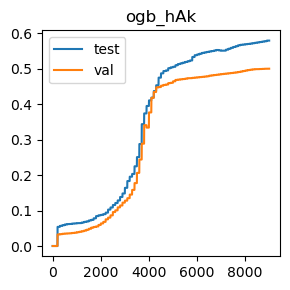

Last Validation Scores: {'ogb_hAk': 0.5003857995789915}
Best Validation Scores: {'ogb_hAk': 0.5003857995789915} at iterations {'ogb_hAk': 8900}
Last Test Scores: {'ogb_hAk': 0.5796732315022212}
Best Test Scores: {'ogb_hAk': 0.5796732315022212} at iterations {'ogb_hAk': 8900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9499


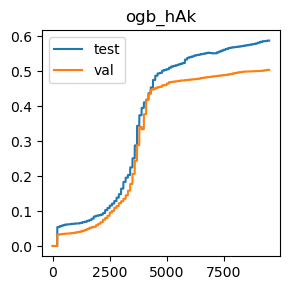

Last Validation Scores: {'ogb_hAk': 0.5039890927342328}
Best Validation Scores: {'ogb_hAk': 0.5039890927342328} at iterations {'ogb_hAk': 9400}
Last Test Scores: {'ogb_hAk': 0.5877038557484138}
Best Test Scores: {'ogb_hAk': 0.5877038557484138} at iterations {'ogb_hAk': 9400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9999


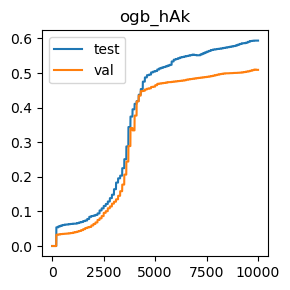

Last Validation Scores: {'ogb_hAk': 0.5091355842054401}
Best Validation Scores: {'ogb_hAk': 0.5098996921094622} at iterations {'ogb_hAk': 9800}
Last Test Scores: {'ogb_hAk': 0.5936743851553311}
Best Test Scores: {'ogb_hAk': 0.5936743851553311} at iterations {'ogb_hAk': 9900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10499


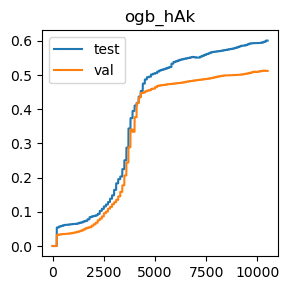

Last Validation Scores: {'ogb_hAk': 0.5123043846309434}
Best Validation Scores: {'ogb_hAk': 0.5130535100270435} at iterations {'ogb_hAk': 10300}
Last Test Scores: {'ogb_hAk': 0.6009259189895797}
Best Test Scores: {'ogb_hAk': 0.6009259189895797} at iterations {'ogb_hAk': 10400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10999


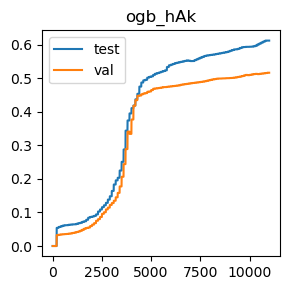

Last Validation Scores: {'ogb_hAk': 0.5164620305792986}
Best Validation Scores: {'ogb_hAk': 0.5164620305792986} at iterations {'ogb_hAk': 10900}
Last Test Scores: {'ogb_hAk': 0.6122227299627685}
Best Test Scores: {'ogb_hAk': 0.6122227299627685} at iterations {'ogb_hAk': 10900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11499


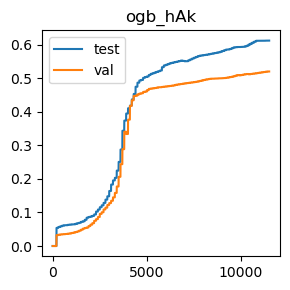

Last Validation Scores: {'ogb_hAk': 0.520627167781615}
Best Validation Scores: {'ogb_hAk': 0.520627167781615} at iterations {'ogb_hAk': 11400}
Last Test Scores: {'ogb_hAk': 0.6127471177400385}
Best Test Scores: {'ogb_hAk': 0.6127471177400385} at iterations {'ogb_hAk': 11400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11999


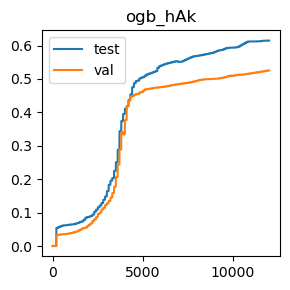

Last Validation Scores: {'ogb_hAk': 0.5254365528245774}
Best Validation Scores: {'ogb_hAk': 0.5254365528245774} at iterations {'ogb_hAk': 11900}
Last Test Scores: {'ogb_hAk': 0.6148371775951577}
Best Test Scores: {'ogb_hAk': 0.6148371775951577} at iterations {'ogb_hAk': 11900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12499


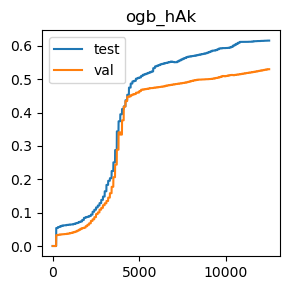

Last Validation Scores: {'ogb_hAk': 0.5303283416611106}
Best Validation Scores: {'ogb_hAk': 0.5303283416611106} at iterations {'ogb_hAk': 12400}
Last Test Scores: {'ogb_hAk': 0.6160882170066447}
Best Test Scores: {'ogb_hAk': 0.6160882170066447} at iterations {'ogb_hAk': 12400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12999


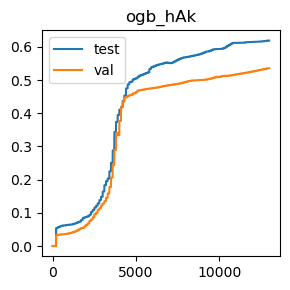

Last Validation Scores: {'ogb_hAk': 0.535729535766992}
Best Validation Scores: {'ogb_hAk': 0.535729535766992} at iterations {'ogb_hAk': 12900}
Last Test Scores: {'ogb_hAk': 0.6190547535752009}
Best Test Scores: {'ogb_hAk': 0.6190547535752009} at iterations {'ogb_hAk': 12900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13499


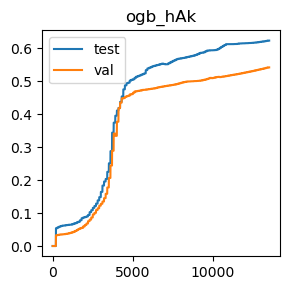

Last Validation Scores: {'ogb_hAk': 0.5417150476818314}
Best Validation Scores: {'ogb_hAk': 0.5417150476818314} at iterations {'ogb_hAk': 13400}
Last Test Scores: {'ogb_hAk': 0.6230176269205703}
Best Test Scores: {'ogb_hAk': 0.6230176269205703} at iterations {'ogb_hAk': 13400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


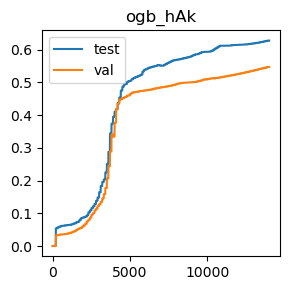

Last Validation Scores: {'ogb_hAk': 0.5474758219778408}
Best Validation Scores: {'ogb_hAk': 0.5474758219778408} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.6279693457887916}
Best Test Scores: {'ogb_hAk': 0.6279693457887916} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.6279693457887916
val
key='ogb_hAk': 0.5474758219778408


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 11:02:12 starting optimization of bigclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 6e-06,
        

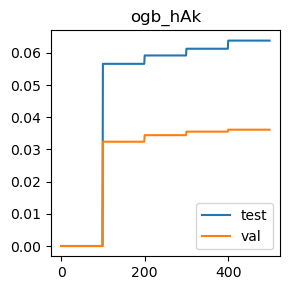

Last Validation Scores: {'ogb_hAk': 0.036130317853905566}
Best Validation Scores: {'ogb_hAk': 0.036130317853905566} at iterations {'ogb_hAk': 400}
Last Test Scores: {'ogb_hAk': 0.06380300998584153}
Best Test Scores: {'ogb_hAk': 0.06380300998584153} at iterations {'ogb_hAk': 400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 999


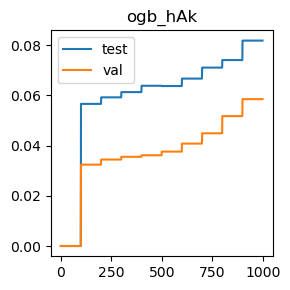

Last Validation Scores: {'ogb_hAk': 0.05846923716560915}
Best Validation Scores: {'ogb_hAk': 0.05846923716560915} at iterations {'ogb_hAk': 900}
Last Test Scores: {'ogb_hAk': 0.08178201949224281}
Best Test Scores: {'ogb_hAk': 0.08178201949224281} at iterations {'ogb_hAk': 900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1499


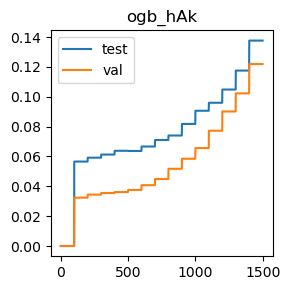

Last Validation Scores: {'ogb_hAk': 0.12191266696132265}
Best Validation Scores: {'ogb_hAk': 0.12191266696132265} at iterations {'ogb_hAk': 1400}
Last Test Scores: {'ogb_hAk': 0.13762931777150178}
Best Test Scores: {'ogb_hAk': 0.13762931777150178} at iterations {'ogb_hAk': 1400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1999


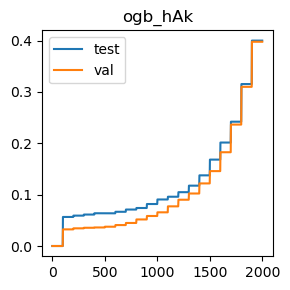

Last Validation Scores: {'ogb_hAk': 0.39784551536081625}
Best Validation Scores: {'ogb_hAk': 0.39784551536081625} at iterations {'ogb_hAk': 1900}
Last Test Scores: {'ogb_hAk': 0.4000928915491164}
Best Test Scores: {'ogb_hAk': 0.4000928915491164} at iterations {'ogb_hAk': 1900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2499


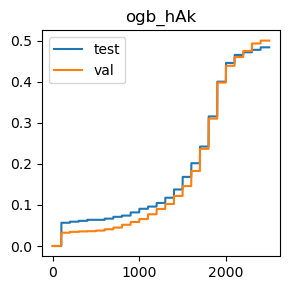

Last Validation Scores: {'ogb_hAk': 0.5000486931507465}
Best Validation Scores: {'ogb_hAk': 0.5000486931507465} at iterations {'ogb_hAk': 2400}
Last Test Scores: {'ogb_hAk': 0.48368779449992133}
Best Test Scores: {'ogb_hAk': 0.48368779449992133} at iterations {'ogb_hAk': 2400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2999


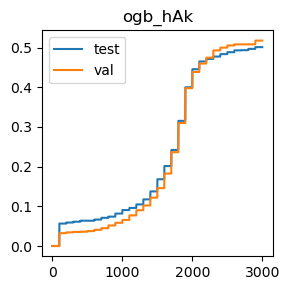

Last Validation Scores: {'ogb_hAk': 0.5177580175145517}
Best Validation Scores: {'ogb_hAk': 0.5177580175145517} at iterations {'ogb_hAk': 2900}
Last Test Scores: {'ogb_hAk': 0.5013296975780775}
Best Test Scores: {'ogb_hAk': 0.5013296975780775} at iterations {'ogb_hAk': 2900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3499


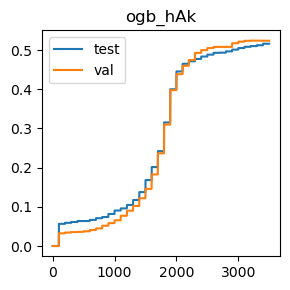

Last Validation Scores: {'ogb_hAk': 0.5240731446036752}
Best Validation Scores: {'ogb_hAk': 0.5243578122541932} at iterations {'ogb_hAk': 3200}
Last Test Scores: {'ogb_hAk': 0.5163796267857277}
Best Test Scores: {'ogb_hAk': 0.5163796267857277} at iterations {'ogb_hAk': 3400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3999


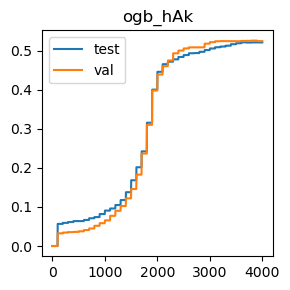

Last Validation Scores: {'ogb_hAk': 0.5242229696828952}
Best Validation Scores: {'ogb_hAk': 0.5255564128879533} at iterations {'ogb_hAk': 3800}
Last Test Scores: {'ogb_hAk': 0.5208369228925229}
Best Test Scores: {'ogb_hAk': 0.521181520574729} at iterations {'ogb_hAk': 3600}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4499


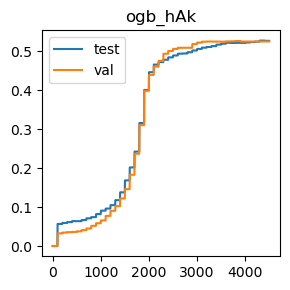

Last Validation Scores: {'ogb_hAk': 0.5244926548254912}
Best Validation Scores: {'ogb_hAk': 0.5255564128879533} at iterations {'ogb_hAk': 3800}
Last Test Scores: {'ogb_hAk': 0.5260808006652233}
Best Test Scores: {'ogb_hAk': 0.5266875922360644} at iterations {'ogb_hAk': 4300}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4999


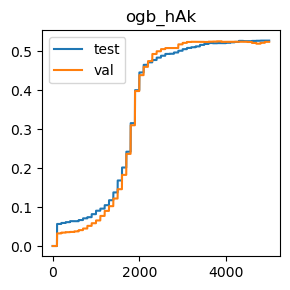

Last Validation Scores: {'ogb_hAk': 0.5241705309051682}
Best Validation Scores: {'ogb_hAk': 0.5255564128879533} at iterations {'ogb_hAk': 3800}
Last Test Scores: {'ogb_hAk': 0.5273992613623595}
Best Test Scores: {'ogb_hAk': 0.5273992613623595} at iterations {'ogb_hAk': 4900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5499


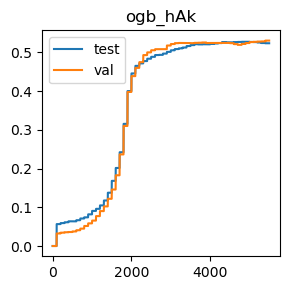

Last Validation Scores: {'ogb_hAk': 0.5304407104705257}
Best Validation Scores: {'ogb_hAk': 0.5304407104705257} at iterations {'ogb_hAk': 5400}
Last Test Scores: {'ogb_hAk': 0.5236011956041322}
Best Test Scores: {'ogb_hAk': 0.5273992613623595} at iterations {'ogb_hAk': 4900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5999


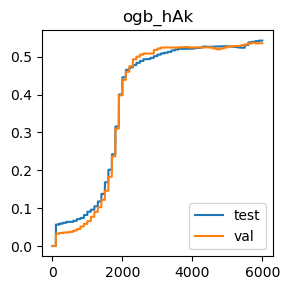

Last Validation Scores: {'ogb_hAk': 0.535437376862513}
Best Validation Scores: {'ogb_hAk': 0.5366734337660781} at iterations {'ogb_hAk': 5700}
Last Test Scores: {'ogb_hAk': 0.5424042430462435}
Best Test Scores: {'ogb_hAk': 0.5424042430462435} at iterations {'ogb_hAk': 5900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6499


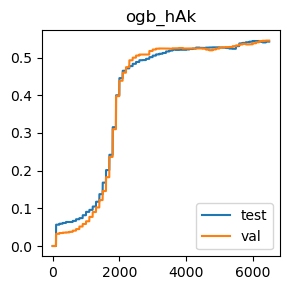

Last Validation Scores: {'ogb_hAk': 0.5452733933133067}
Best Validation Scores: {'ogb_hAk': 0.5452733933133067} at iterations {'ogb_hAk': 6400}
Last Test Scores: {'ogb_hAk': 0.5425465768715025}
Best Test Scores: {'ogb_hAk': 0.5442470915206497} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6999


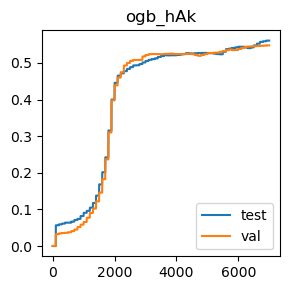

Last Validation Scores: {'ogb_hAk': 0.5479252972155009}
Best Validation Scores: {'ogb_hAk': 0.5479252972155009} at iterations {'ogb_hAk': 6900}
Last Test Scores: {'ogb_hAk': 0.5609975353774468}
Best Test Scores: {'ogb_hAk': 0.5609975353774468} at iterations {'ogb_hAk': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7499


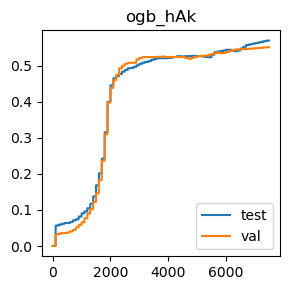

Last Validation Scores: {'ogb_hAk': 0.5512663964821072}
Best Validation Scores: {'ogb_hAk': 0.5512663964821072} at iterations {'ogb_hAk': 7400}
Last Test Scores: {'ogb_hAk': 0.5697697937657784}
Best Test Scores: {'ogb_hAk': 0.5697697937657784} at iterations {'ogb_hAk': 7400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7999


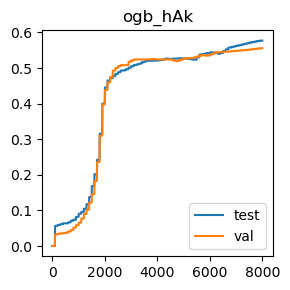

Last Validation Scores: {'ogb_hAk': 0.5557536576047465}
Best Validation Scores: {'ogb_hAk': 0.5557536576047465} at iterations {'ogb_hAk': 7900}
Last Test Scores: {'ogb_hAk': 0.577223591456974}
Best Test Scores: {'ogb_hAk': 0.577223591456974} at iterations {'ogb_hAk': 7900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8499


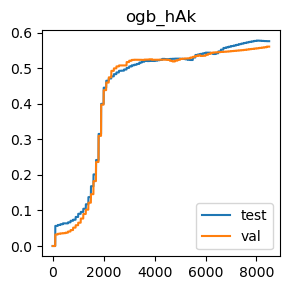

Last Validation Scores: {'ogb_hAk': 0.5612447467581598}
Best Validation Scores: {'ogb_hAk': 0.5612447467581598} at iterations {'ogb_hAk': 8400}
Last Test Scores: {'ogb_hAk': 0.5765493786004839}
Best Test Scores: {'ogb_hAk': 0.578189963217943} at iterations {'ogb_hAk': 8000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8999


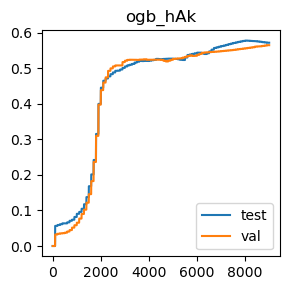

Last Validation Scores: {'ogb_hAk': 0.5653424626748271}
Best Validation Scores: {'ogb_hAk': 0.5653424626748271} at iterations {'ogb_hAk': 8900}
Last Test Scores: {'ogb_hAk': 0.5722344163189477}
Best Test Scores: {'ogb_hAk': 0.578189963217943} at iterations {'ogb_hAk': 8000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9499


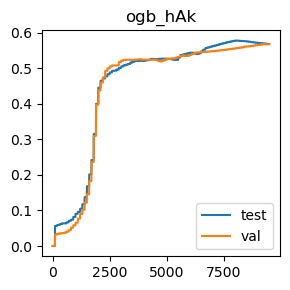

Last Validation Scores: {'ogb_hAk': 0.5676497688948153}
Best Validation Scores: {'ogb_hAk': 0.5683988942909154} at iterations {'ogb_hAk': 9200}
Last Test Scores: {'ogb_hAk': 0.5686835619414333}
Best Test Scores: {'ogb_hAk': 0.578189963217943} at iterations {'ogb_hAk': 8000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9999


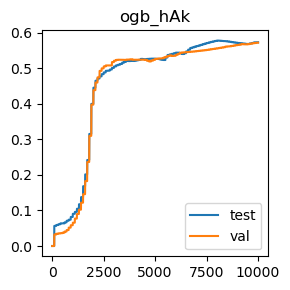

Last Validation Scores: {'ogb_hAk': 0.5722344163189477}
Best Validation Scores: {'ogb_hAk': 0.5722344163189477} at iterations {'ogb_hAk': 9900}
Last Test Scores: {'ogb_hAk': 0.5735304032542007}
Best Test Scores: {'ogb_hAk': 0.578189963217943} at iterations {'ogb_hAk': 8000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10499


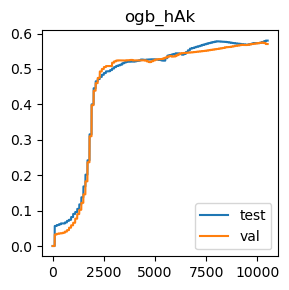

Last Validation Scores: {'ogb_hAk': 0.5705339016698006}
Best Validation Scores: {'ogb_hAk': 0.5747140213800388} at iterations {'ogb_hAk': 10200}
Last Test Scores: {'ogb_hAk': 0.5801976192794912}
Best Test Scores: {'ogb_hAk': 0.5801976192794912} at iterations {'ogb_hAk': 10400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10999


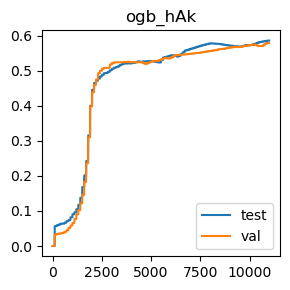

Last Validation Scores: {'ogb_hAk': 0.5794185288675472}
Best Validation Scores: {'ogb_hAk': 0.5794185288675472} at iterations {'ogb_hAk': 10900}
Last Test Scores: {'ogb_hAk': 0.5859883585913446}
Best Test Scores: {'ogb_hAk': 0.5859883585913446} at iterations {'ogb_hAk': 10900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11499


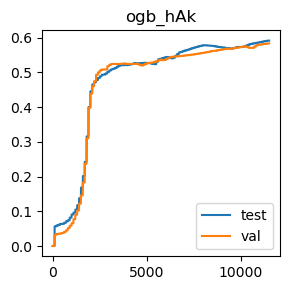

Last Validation Scores: {'ogb_hAk': 0.5833364546891504}
Best Validation Scores: {'ogb_hAk': 0.5833364546891504} at iterations {'ogb_hAk': 11400}
Last Test Scores: {'ogb_hAk': 0.591434500220992}
Best Test Scores: {'ogb_hAk': 0.591434500220992} at iterations {'ogb_hAk': 11400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11999


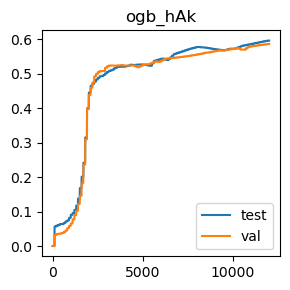

Last Validation Scores: {'ogb_hAk': 0.5868273790349766}
Best Validation Scores: {'ogb_hAk': 0.5868273790349766} at iterations {'ogb_hAk': 11900}
Last Test Scores: {'ogb_hAk': 0.5967308167714194}
Best Test Scores: {'ogb_hAk': 0.5967308167714194} at iterations {'ogb_hAk': 11900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12499


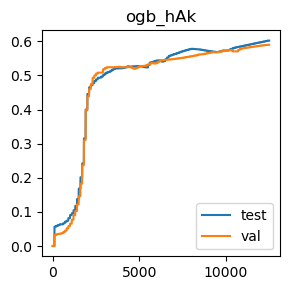

Last Validation Scores: {'ogb_hAk': 0.5899437406827529}
Best Validation Scores: {'ogb_hAk': 0.5899437406827529} at iterations {'ogb_hAk': 12400}
Last Test Scores: {'ogb_hAk': 0.6022219059248327}
Best Test Scores: {'ogb_hAk': 0.6022219059248327} at iterations {'ogb_hAk': 12400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12999


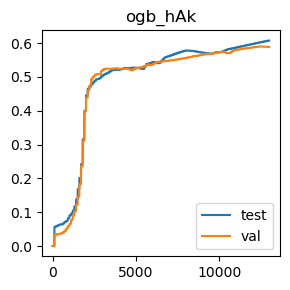

Last Validation Scores: {'ogb_hAk': 0.5885653499539288}
Best Validation Scores: {'ogb_hAk': 0.5899437406827529} at iterations {'ogb_hAk': 12400}
Last Test Scores: {'ogb_hAk': 0.6073833799039621}
Best Test Scores: {'ogb_hAk': 0.6073833799039621} at iterations {'ogb_hAk': 12900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13499


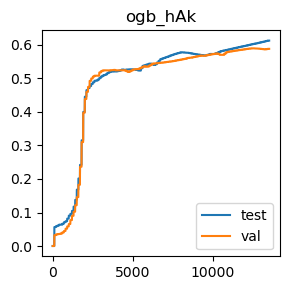

Last Validation Scores: {'ogb_hAk': 0.5884305073826308}
Best Validation Scores: {'ogb_hAk': 0.5899437406827529} at iterations {'ogb_hAk': 12400}
Last Test Scores: {'ogb_hAk': 0.6130317853905565}
Best Test Scores: {'ogb_hAk': 0.6130317853905565} at iterations {'ogb_hAk': 13400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


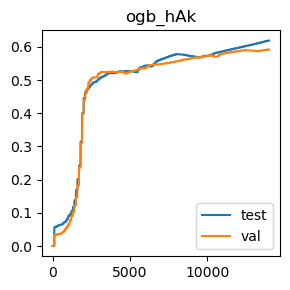

Last Validation Scores: {'ogb_hAk': 0.592108713077482}
Best Validation Scores: {'ogb_hAk': 0.592108713077482} at iterations {'ogb_hAk': 13900}
Last Test Scores: {'ogb_hAk': 0.6188749634801369}
Best Test Scores: {'ogb_hAk': 0.6188749634801369} at iterations {'ogb_hAk': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.6188749634801369
val
key='ogb_hAk': 0.592108713077482


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 11:11:47 starting optimization of bigclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_

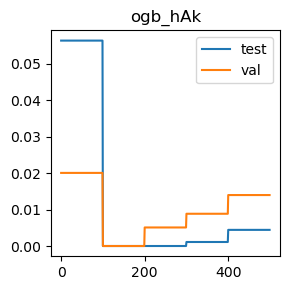

Last Validation Scores: {'ogb_hAk': 0.013978679891226992}
Best Validation Scores: {'ogb_hAk': 0.020054086853598423} at iterations {'ogb_hAk': 0}
Last Test Scores: {'ogb_hAk': 0.004427331090951315}
Best Test Scores: {'ogb_hAk': 0.056349212294646} at iterations {'ogb_hAk': 0}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 999


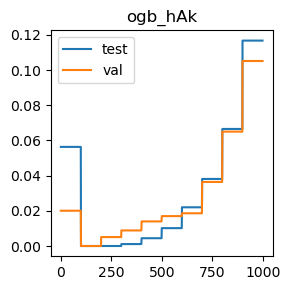

Last Validation Scores: {'ogb_hAk': 0.10519218812036947}
Best Validation Scores: {'ogb_hAk': 0.10519218812036947} at iterations {'ogb_hAk': 900}
Last Test Scores: {'ogb_hAk': 0.11678864925199829}
Best Test Scores: {'ogb_hAk': 0.11678864925199829} at iterations {'ogb_hAk': 900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1499


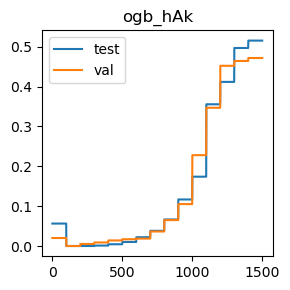

Last Validation Scores: {'ogb_hAk': 0.4718141569717355}
Best Validation Scores: {'ogb_hAk': 0.4718141569717355} at iterations {'ogb_hAk': 1400}
Last Test Scores: {'ogb_hAk': 0.5154806763104076}
Best Test Scores: {'ogb_hAk': 0.5154806763104076} at iterations {'ogb_hAk': 1400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 1999


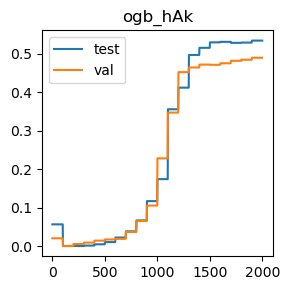

Last Validation Scores: {'ogb_hAk': 0.48962835889099476}
Best Validation Scores: {'ogb_hAk': 0.48962835889099476} at iterations {'ogb_hAk': 1900}
Last Test Scores: {'ogb_hAk': 0.5342387762287529}
Best Test Scores: {'ogb_hAk': 0.5342387762287529} at iterations {'ogb_hAk': 1900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2499


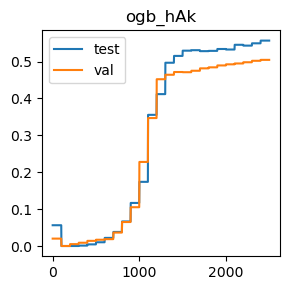

Last Validation Scores: {'ogb_hAk': 0.5047532006382548}
Best Validation Scores: {'ogb_hAk': 0.5047532006382548} at iterations {'ogb_hAk': 2400}
Last Test Scores: {'ogb_hAk': 0.5569972057622725}
Best Test Scores: {'ogb_hAk': 0.5569972057622725} at iterations {'ogb_hAk': 2400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 2999


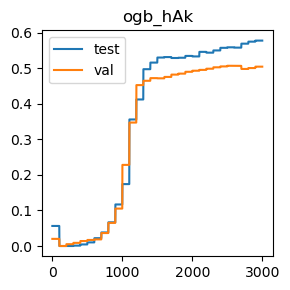

Last Validation Scores: {'ogb_hAk': 0.5040565140198818}
Best Validation Scores: {'ogb_hAk': 0.5065885578586999} at iterations {'ogb_hAk': 2500}
Last Test Scores: {'ogb_hAk': 0.5773059952505449}
Best Test Scores: {'ogb_hAk': 0.5773059952505449} at iterations {'ogb_hAk': 2900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3499


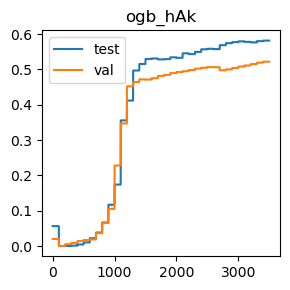

Last Validation Scores: {'ogb_hAk': 0.5218632246851801}
Best Validation Scores: {'ogb_hAk': 0.5218632246851801} at iterations {'ogb_hAk': 3400}
Last Test Scores: {'ogb_hAk': 0.5816284487860423}
Best Test Scores: {'ogb_hAk': 0.5816284487860423} at iterations {'ogb_hAk': 3400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 3999


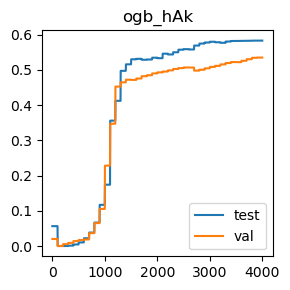

Last Validation Scores: {'ogb_hAk': 0.5346433039426469}
Best Validation Scores: {'ogb_hAk': 0.5346433039426469} at iterations {'ogb_hAk': 3900}
Last Test Scores: {'ogb_hAk': 0.5827521368801923}
Best Test Scores: {'ogb_hAk': 0.5827521368801923} at iterations {'ogb_hAk': 3900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4499


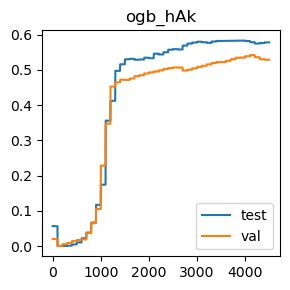

Last Validation Scores: {'ogb_hAk': 0.5284929844406655}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.57764310167879}
Best Test Scores: {'ogb_hAk': 0.5827521368801923} at iterations {'ogb_hAk': 3900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 4999


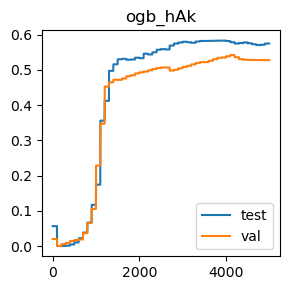

Last Validation Scores: {'ogb_hAk': 0.5273318400767104}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.5744593187453648}
Best Test Scores: {'ogb_hAk': 0.5827521368801923} at iterations {'ogb_hAk': 3900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5499


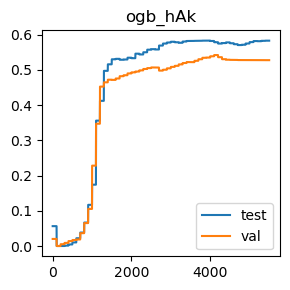

Last Validation Scores: {'ogb_hAk': 0.5272494362831395}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.5825498730232453}
Best Test Scores: {'ogb_hAk': 0.5827521368801923} at iterations {'ogb_hAk': 3900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 5999


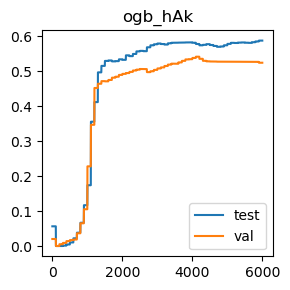

Last Validation Scores: {'ogb_hAk': 0.5245151285873743}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.5878536808276338}
Best Test Scores: {'ogb_hAk': 0.5878536808276338} at iterations {'ogb_hAk': 5900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6499


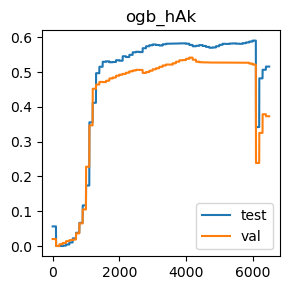

Last Validation Scores: {'ogb_hAk': 0.3731093947815925}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.5159301515480677}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6999


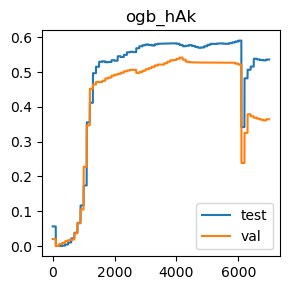

Last Validation Scores: {'ogb_hAk': 0.3644869614724809}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.536193993512574}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7499


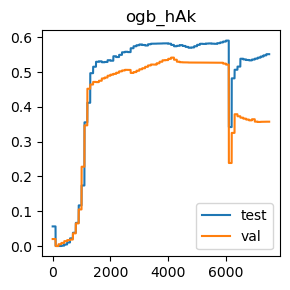

Last Validation Scores: {'ogb_hAk': 0.35746765651102336}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.5516184854182742}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 7999


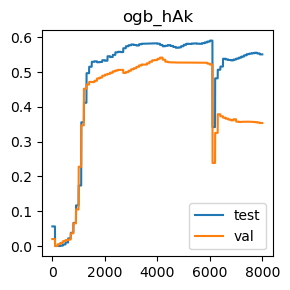

Last Validation Scores: {'ogb_hAk': 0.3536246432290301}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.5510116938474331}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8499


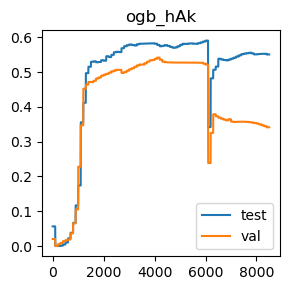

Last Validation Scores: {'ogb_hAk': 0.3414663380503262}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.5507494999587981}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 8999


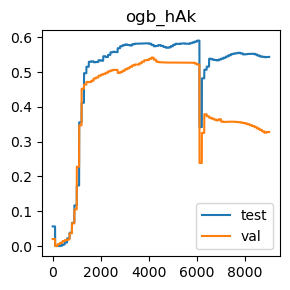

Last Validation Scores: {'ogb_hAk': 0.3278472383492273}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.5437077212354576}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9499


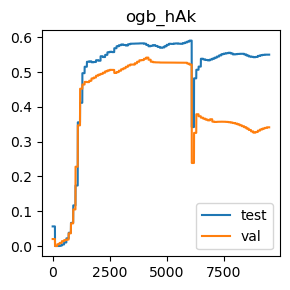

Last Validation Scores: {'ogb_hAk': 0.34129403920922324}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.5502326034354891}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 9999


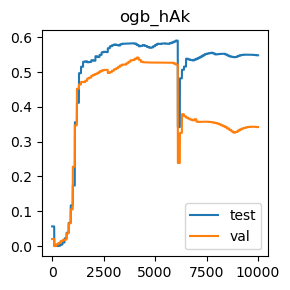

Last Validation Scores: {'ogb_hAk': 0.34203567335136226}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.548479650008615}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10499


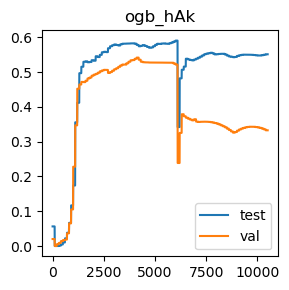

Last Validation Scores: {'ogb_hAk': 0.3327315359317996}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.5513113440058731}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 10999


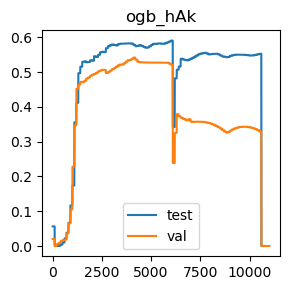

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11499


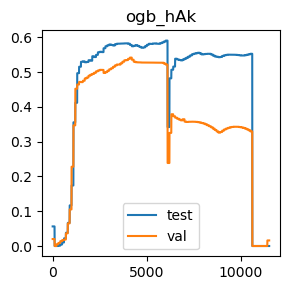

Last Validation Scores: {'ogb_hAk': 0.016023792222580137}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 11999


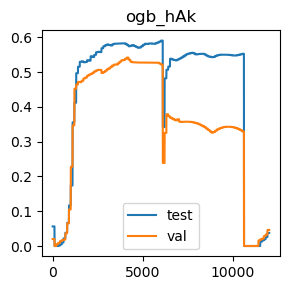

Last Validation Scores: {'ogb_hAk': 0.04622103693937328}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.037621077392144674}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12499


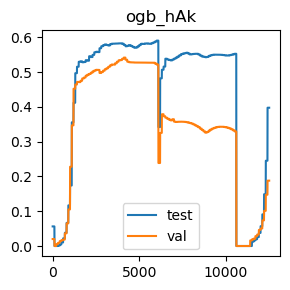

Last Validation Scores: {'ogb_hAk': 0.18793308811962034}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.3976282689959472}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 12999


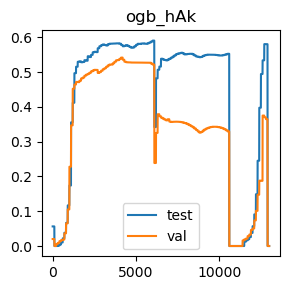

Last Validation Scores: {'ogb_hAk': 0.0}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.0}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13499


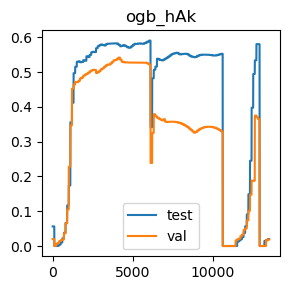

Last Validation Scores: {'ogb_hAk': 0.01885548621983834}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.019941718044183415}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


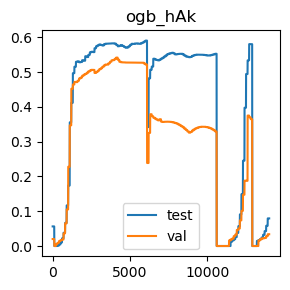

Last Validation Scores: {'ogb_hAk': 0.03387545041164441}
Best Validation Scores: {'ogb_hAk': 0.5417450126976755} at iterations {'ogb_hAk': 4100}
Last Test Scores: {'ogb_hAk': 0.07936234446283963}
Best Test Scores: {'ogb_hAk': 0.590640427301126} at iterations {'ogb_hAk': 6000}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='ogb_hAk': 0.07936234446283963
val
key='ogb_hAk': 0.03387545041164441


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/optimization_utils.py:494:::  

Finished CrossVal!




In [11]:
#DDI bigclam
#DECIDE ON A MODEL AND DATASET
model_name = 'bigclam'
ds_name = 'ogbl-ddi'

# SET RANGE PARAMETERS
use_global_config_base = True
densify = False
attr_opt = False
test_p = 0.1
val_p = 0.0
n_reps = 1

'''to do cross validation, give a list of parameters for every one of the parameters as given in the following'''
dim_feats = [50, 90, 120]
n_iters_feats = [14000] 
lr_feats = [3*1e-6, 6*1e-6, 1e-5]
# l1_regs = [1.0, 0.1]
range_triplets = [
    # ['clamiter_init','s_reg', s_regs],
    # ['clamiter_init','l1_reg', l1_regs],
    ['clamiter_init', 'dim_feat', dim_feats],
    ['feat_opt','n_iter', n_iters_feats],
    ['feat_opt','lr', lr_feats],
    ]

'''another method is to give a list of perturbations to the base config'''
# deltas ={
# # 'clamiter_init': {'s_reg': 0.001,
# #                   'l1_reg': 0.001,
# #                   'dim_feat': 2},
# # 'feat_opt': {'n_iter': 50,
# #             'lr': 0.0000001},
# # 'prior_opt': {'n_iter': 50,
# #               'lr': 0.0000001,
# #               'noise_amp': 0.005},
# 'back_forth': {'scheduler_gamma' : 0.1}
# }

# range_triplets = ou.perturb_config('link_prediction',
#                                    ds_name, 
#                                    model_name, 
#                                    deltas, 
#                                    use_global_config=use_global_config_base)
#todo: make metric a list

#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
ou.cross_val_link(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=range_triplets,
    use_global_config_base=use_global_config_base,
    densify=densify,
    attr_opt=attr_opt,
    metric='ogb_hAk',
    n_reps=n_reps,
    acc_every=100,
    device=device,
    plot_every= 500
    #! add calculation type and finish the hAk function
    )
#test that texas still works

### PieClam

In [ ]:
#DDI pieclam hits@20
#DECIDE ON A MODEL AND DATASET
model_name = 'pieclam'
ds_name = 'ogbl-ddi'

# SET RANGE PARAMETERS
densify = False
attr_opt = False
n_reps = 1

'''to do cross validation, give a list of parameters for every one of the parameters as given in the following'''

range_triplets = [
    # ['clamiter_init','s_reg', s_regs],
    # ['clamiter_init','l1_reg', l1_regs],
    ['clamiter_init', 'dim_feat', [170, 120]],
    ['feat_opt','n_iter', [2000, 1500]],
    ['feat_opt','lr', [1e-5, 2e-5]],
    ['prior_opt', 'lr', [1e-6, 5e-66]],
    ['prior_opt', 'n_iter', [1000, 2000]],
    ['prior_opt', 'noise_amp', [0.05, 0.03]],
    ['back_forth', 'scheduler_step_size', [4]],
    ['back_forth', 'scheduler_gamma', [0.8]],
    ['back_forth', 'n_back_forth', [7]]
    ][::-1] 

'''another method is to give a list of perturbations to the base config'''
# deltas ={
# # 'clamiter_init': {'s_reg': 0.001,
# #                   'l1_reg': 0.001,
# #                   'dim_feat': 2},
# # 'feat_opt': {'n_iter': 50,
# #             'lr': 0.0000001},
# # 'prior_opt': {'n_iter': 50,
# #               'lr': 0.0000001,
# #               'noise_amp': 0.005},
# 'back_forth': {'scheduler_gamma' : 0.1}
# }

# range_triplets = ou.perturb_config('link_prediction',
#                                    ds_name, 
#                                    model_name, 
#                                    deltas, 
#                                    use_global_config=use_global_config_base)
#todo: make metric a list

#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
ou.cross_val_link(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=range_triplets,
    use_global_config_base=True,
    densify=densify,
    attr_opt=attr_opt,
    metric='ogb_hAk',
    n_reps=n_reps,
    acc_every=100,
    device=device,
    plot_every= 2
    #! add calculation type and finish the hAk function
    )
#test that texas still works



/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-31 13:53:26 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 2500,
        "lr": 1e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early_stop": 0
    },
    "back_forth": {
        "n_back_forth": 7,
        "scheduler_step_size": 4,
        "scheduler_gamma": 0.8,
        "early_stop_fit": 0,
        "first_func_in_fit": "fit_feats"
    }
}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:577:::  
in fit,
first_func_in_fit='fit_feats'
second_function_name='fit_prior'


/home/us

KeyboardInterrupt: 

## Auc

### DDI

#### PieClam



/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-31 20:24:04 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early_stop": 0
    },
    "back_forth": {
        "n_back_forth": 10,
        "scheduler_step_size": 3,
        "scheduler_gamma": 0.5,
        "early_stop_fit": 0,
        "first_func_in_fit": "fit_feats"
    }
}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:577:::  
in fit,
first_func_in_fit='fit_feats'
second_function_name='fit_prior'


/home/u

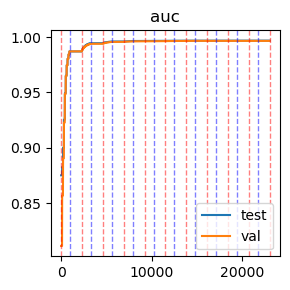



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9967672713968072
val
key='auc': 0.9965027274778326


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-31 20:42:15 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

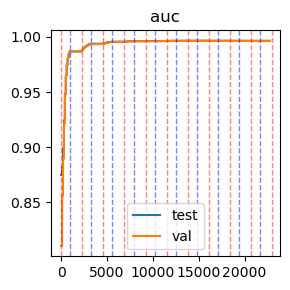



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9964855348084215
val
key='auc': 0.9963032064262967


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-31 20:59:57 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

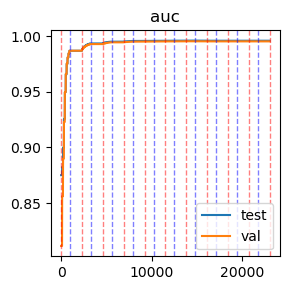



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9959574720859885
val
key='auc': 0.9953541749087071


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-31 21:18:02 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

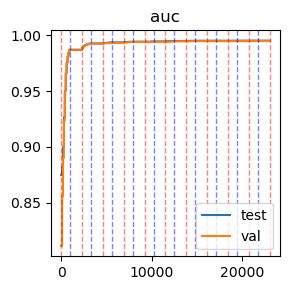



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9952342426820104
val
key='auc': 0.9948530287538364


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-31 21:36:08 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

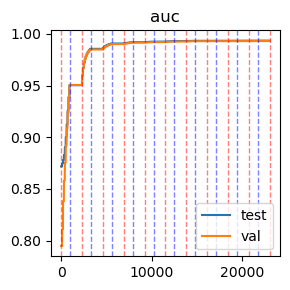



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9934291209411488
val
key='auc': 0.9929993010422262


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-31 21:54:13 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

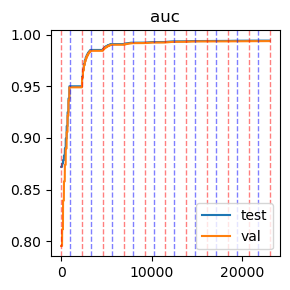



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9943732701271153
val
key='auc': 0.9938814316737459


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-31 22:12:17 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

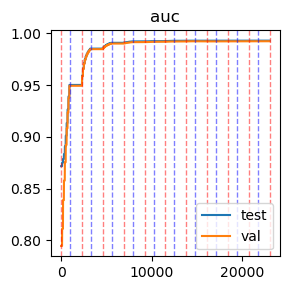



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9928277588231142
val
key='auc': 0.9922403675019165


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-31 22:30:22 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

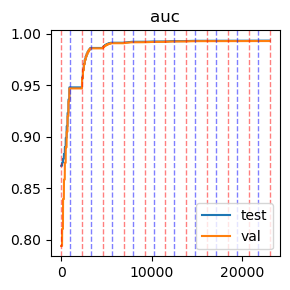



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9933512852930702
val
key='auc': 0.9929201416302906


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-31 22:48:24 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

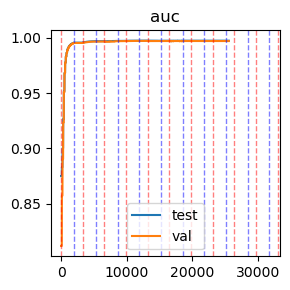



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9973431313661955
val
key='auc': 0.9970402313832983


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-31 23:09:52 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

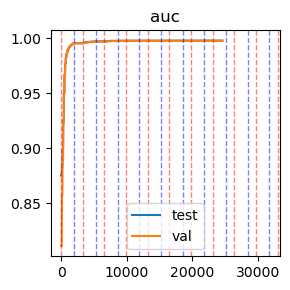



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9977334310731433
val
key='auc': 0.9975746274132137


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-31 23:30:00 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

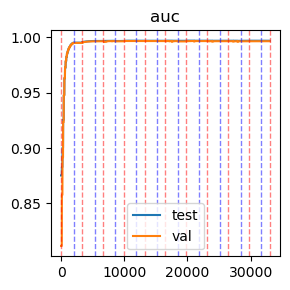



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9968861452842703
val
key='auc': 0.9964550856776169


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 00:01:46 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

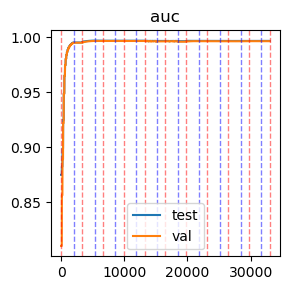



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9965674849689088
val
key='auc': 0.9962885524815


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 00:33:29 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early_st

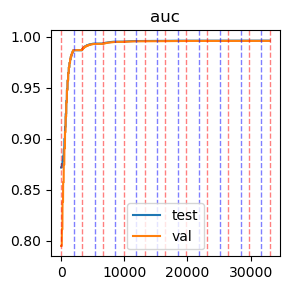



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9963346547129597
val
key='auc': 0.9960366398576808


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 01:05:15 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

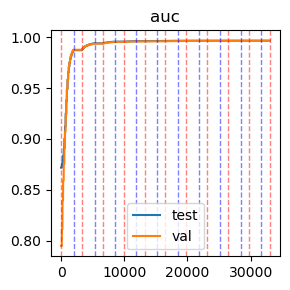



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9966350335131737
val
key='auc': 0.9964042707818683


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 01:36:59 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

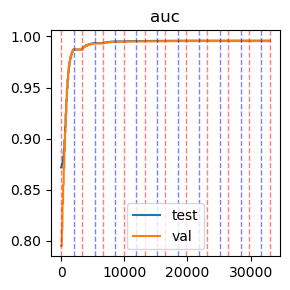



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9958879972271124
val
key='auc': 0.9954358951056852


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 02:08:44 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

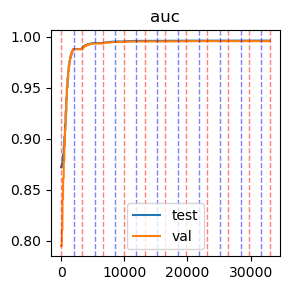



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9963326339730825
val
key='auc': 0.9957702897208786


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 02:40:27 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

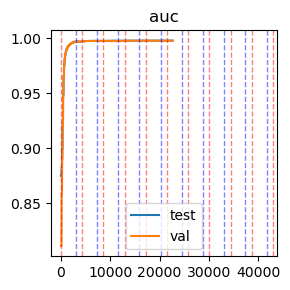



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9978598511065996
val
key='auc': 0.9977528650962239


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 02:57:57 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

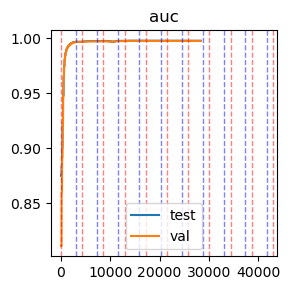



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9976216992228786
val
key='auc': 0.9974697273212045


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 03:23:17 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

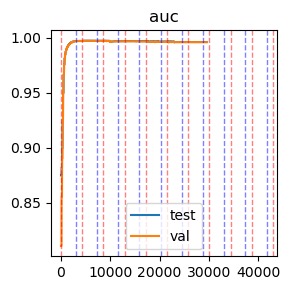



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9962390666054883
val
key='auc': 0.9961902004536812


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 03:50:17 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

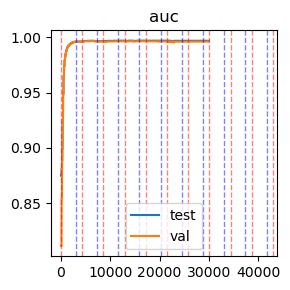



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.997019363819351
val
key='auc': 0.9963095429115698


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 04:17:46 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early_

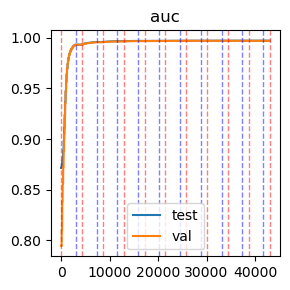



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9972610225634251
val
key='auc': 0.9970753489248222


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 05:03:12 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

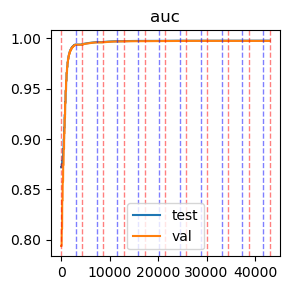



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9974902594482378
val
key='auc': 0.997219347514033


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 05:48:39 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early_

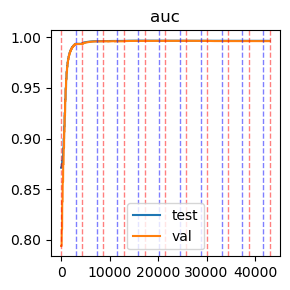



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9963014708534148
val
key='auc': 0.9960214635280293


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 06:34:04 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

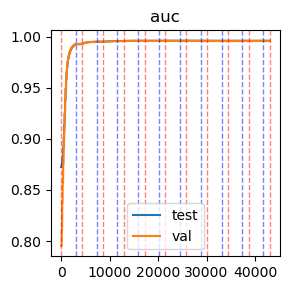



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9962671644302592
val
key='auc': 0.9959634112730207


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 07:19:34 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

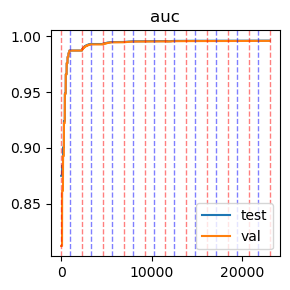



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9960992945259468
val
key='auc': 0.9958374113769571


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 07:36:27 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

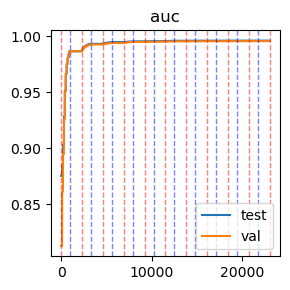



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9961373366242083
val
key='auc': 0.9956668647989932


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 07:53:19 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

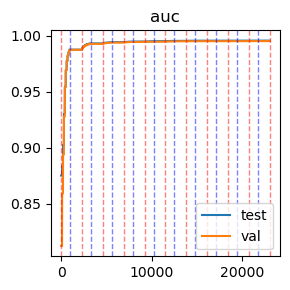



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9956890952230869
val
key='auc': 0.9952401674748037


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 08:10:13 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

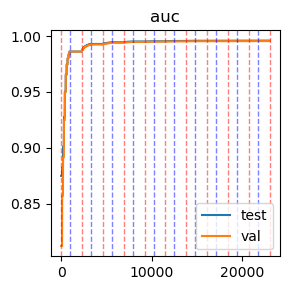



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9959296160839326
val
key='auc': 0.9954936236504648


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 08:27:08 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

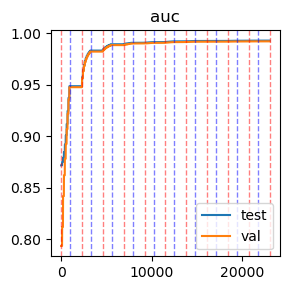



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9930337303410322
val
key='auc': 0.9923010741808039


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 08:44:02 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

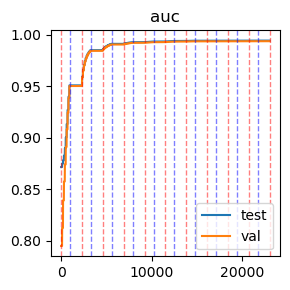



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9942201052928371
val
key='auc': 0.9936345049227424


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 09:00:57 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

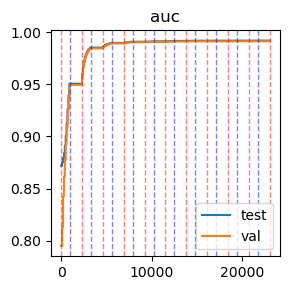



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9918758792639337
val
key='auc': 0.9912984063230793


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 09:17:50 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

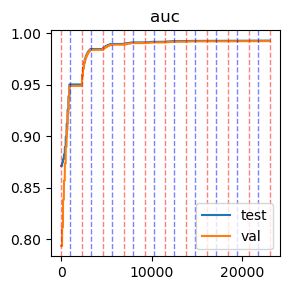



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9930417296107614
val
key='auc': 0.992510372641541


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 09:34:42 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early_

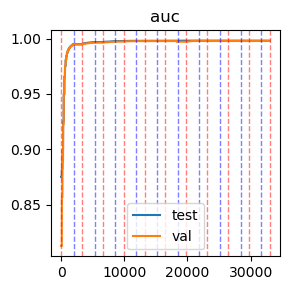



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9981165821997307
val
key='auc': 0.9978179379845638


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 10:04:06 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

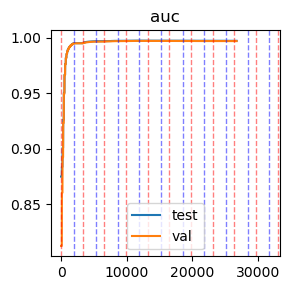



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9973362746030066
val
key='auc': 0.997090466982956


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 10:25:40 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early_

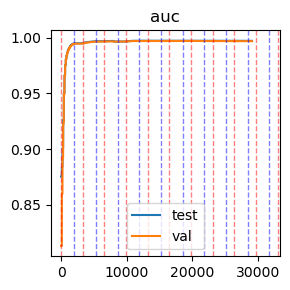



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9972635300831807
val
key='auc': 0.9969752071709768


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 10:50:16 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

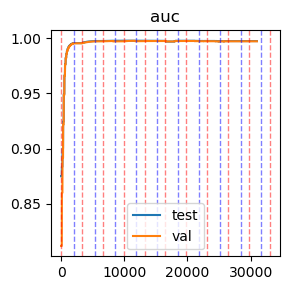



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9974540659302603
val
key='auc': 0.9972333419428955


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 11:17:12 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

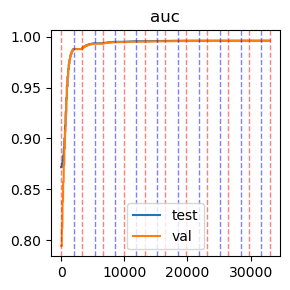



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9960344671141146
val
key='auc': 0.9956580952113154


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 11:46:41 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

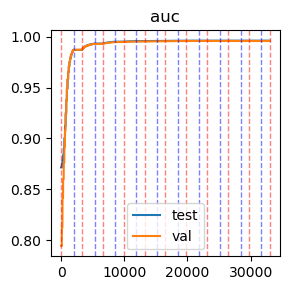



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.996330568528131
val
key='auc': 0.995988549495454


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 12:16:07 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early_s

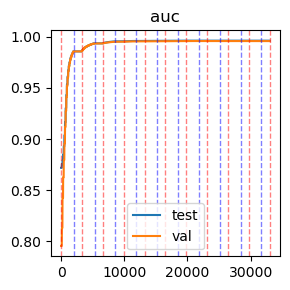



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9960732313893497
val
key='auc': 0.9956661548055867


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 12:45:36 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

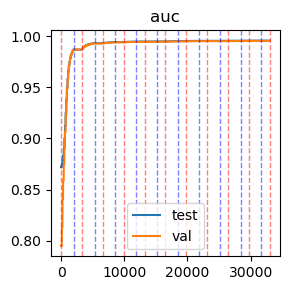



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.995558274541239
val
key='auc': 0.9952538620902739


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 13:15:05 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early_

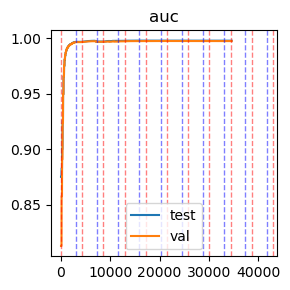



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.997811583966608
val
key='auc': 0.9974587933418618


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 13:46:27 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early_

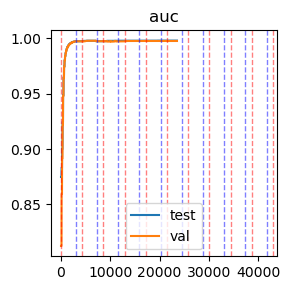



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.997751227336456
val
key='auc': 0.9974141798223468


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 14:04:00 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early_

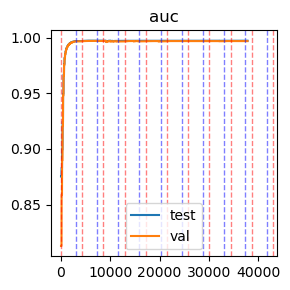



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9971964921797848
val
key='auc': 0.9968600769533826


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 14:39:28 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

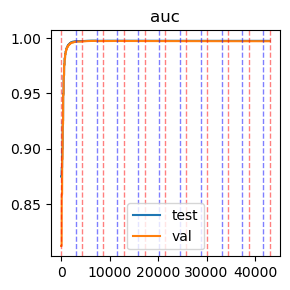



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9974440000401614
val
key='auc': 0.9971029723815289


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 15:21:24 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

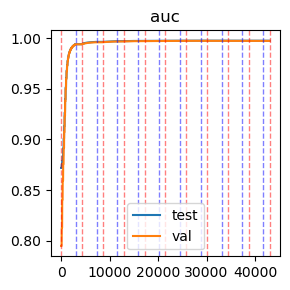



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9973541885256866
val
key='auc': 0.9971518420012249


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 16:03:20 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

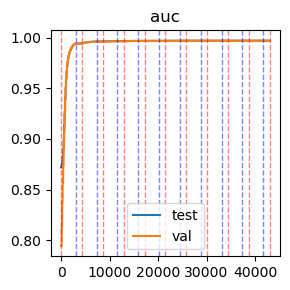



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9972140821571944
val
key='auc': 0.9970380913296426


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 16:45:17 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

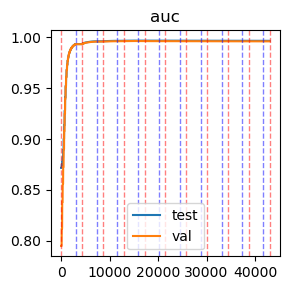



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9966337186903178
val
key='auc': 0.9961165754756434


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 17:27:16 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 150,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 3000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

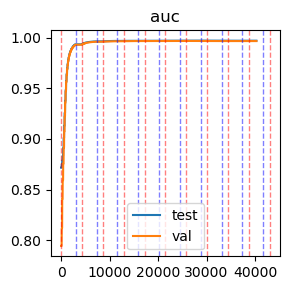



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9972424322659028
val
key='auc': 0.9968641686065611


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 18:05:48 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 190,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

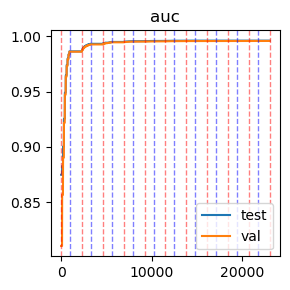



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9960606441095597
val
key='auc': 0.9957602754756416


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 18:25:00 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 190,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

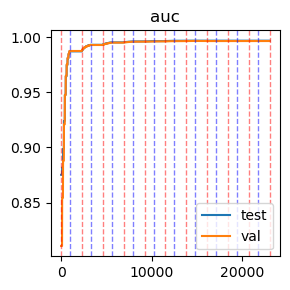



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9968027524154214
val
key='auc': 0.9964790022202189


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 18:44:12 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 190,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

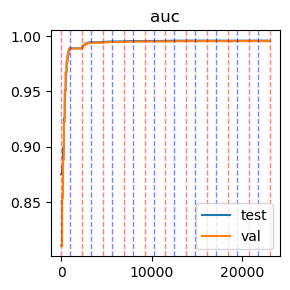



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.995862614422599
val
key='auc': 0.9953710487225947


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 19:03:29 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 190,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early_

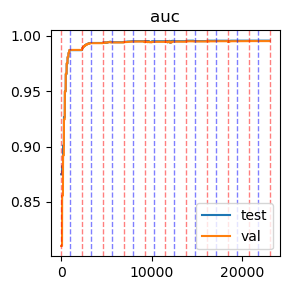



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9955249638540649
val
key='auc': 0.9950943665493892


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 19:22:45 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 190,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

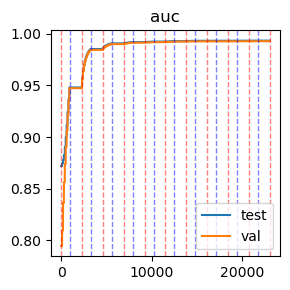



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9933784810626944
val
key='auc': 0.992826504191042


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 19:42:00 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 190,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early_

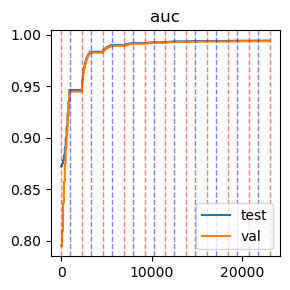



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9944582153316683
val
key='auc': 0.9938497430342026


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 20:01:13 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 190,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

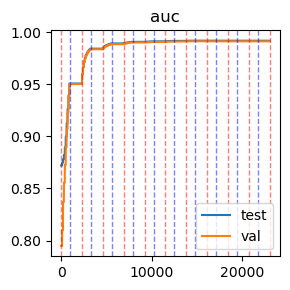



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9917279584798229
val
key='auc': 0.9911378550934691


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 20:20:28 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 190,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 1000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

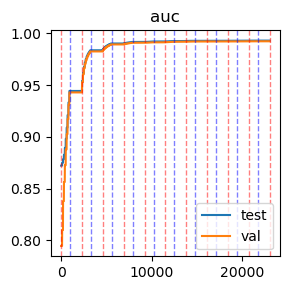



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9930041493735113
val
key='auc': 0.9923371924850928


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 20:39:42 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 190,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

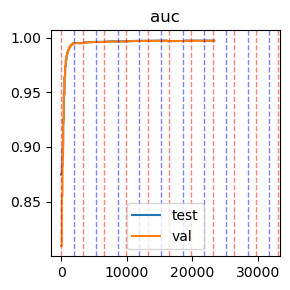



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9972522535514636
val
key='auc': 0.9970569743160483


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 20:59:21 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 190,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

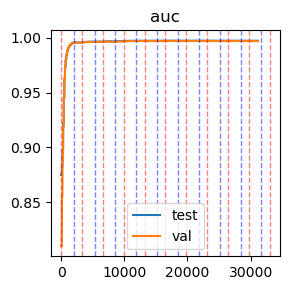



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9973909811543467
val
key='auc': 0.9970949235224522


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 21:30:37 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 190,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

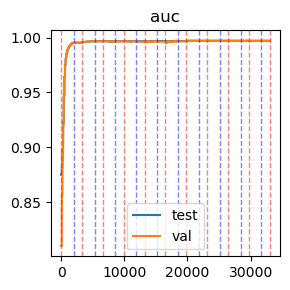



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9972547483375217
val
key='auc': 0.9969617375166526


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 22:04:43 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 190,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

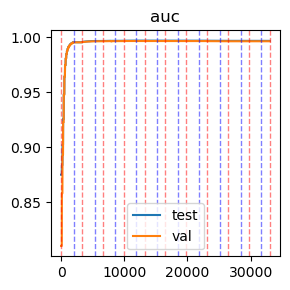



/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9966521243688132
val
key='auc': 0.9962812739093874


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-04-01 22:38:48 starting optimization of pieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 190,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 5e-06,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1300,
        "lr": 1e-05,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early

KeyboardInterrupt: 

In [ ]:
#DDI pieclam auc
#DECIDE ON A MODEL AND DATASET
model_name = 'pieclam'
ds_name = 'ogbl-ddi'

# SET RANGE PARAMETERS
densify = False
attr_opt = False
n_reps = 1

'''to do cross validation, give a list of parameters for every one of the parameters as given in the following'''
dim_feats = [170, 150, 190]
n_iters_feats = [1000, 2000, 3000] 
lr_feats = [1e-5, 5e-6]
# l1_regs = [1.0, 0.1]

lr_priors = [1e-6, 5e-6]
n_iters_prior = [1000, 2000]
noise_amps = [0.05]

range_triplets = [
    # ['clamiter_init','s_reg', s_regs],
    # ['clamiter_init','l1_reg', l1_regs],
    ['clamiter_init', 'dim_feat', dim_feats],
    ['feat_opt','n_iter', n_iters_feats],
    ['feat_opt','lr', lr_feats],
    ['prior_opt', 'lr', lr_feats],
    ['prior_opt', 'n_iters', n_iters_prior],
    ['prior_opt', 'noise_amp', noise_amps],
    ['back_forth', 'n_back_forth', [10]]
    ]

'''another method is to give a list of perturbations to the base config'''
# deltas ={
# # 'clamiter_init': {'s_reg': 0.001,
# #                   'l1_reg': 0.001,
# #                   'dim_feat': 2},
# # 'feat_opt': {'n_iter': 50,
# #             'lr': 0.0000001},
# # 'prior_opt': {'n_iter': 50,
# #               'lr': 0.0000001,
# #               'noise_amp': 0.005},
# 'back_forth': {'scheduler_gamma' : 0.1}
# }

# range_triplets = ou.perturb_config('link_prediction',
#                                    ds_name, 
#                                    model_name, 
#                                    deltas, 
#                                    use_global_config=use_global_config_base)
#todo: make metric a list

#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
ou.cross_val_link(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=range_triplets,
    use_global_config_base=True,
    densify=densify,
    attr_opt=attr_opt,
    metric='auc',
    n_reps=n_reps,
    acc_every=100,
    device=device,
    plot_every= -1
    #! add calculation type and finish the hAk function
    )

### IeClam


In [ ]:

#DDI ieclam h@20
#DECIDE ON A MODEL AND DATASET
model_name = 'ieclam'
ds_name = 'ogbl-ddi'

# SET RANGE PARAMETERS
use_global_config_base = True
densify = False
attr_opt = False
test_p = 0.1
val_p = 0.0
n_reps = 1

'''to do cross validation, give a list of parameters for every one of the parameters as given in the following'''
dim_feats = [120, 170]
n_iters_feats = [14000] 
lr_feats = [3e-6, 5*1e-6, 1e-5]
l1_regs = [0.1, 0.5, 0.7]
s_regs = [0.0, 0.1]
range_triplets = [
    # ['clamiter_init','s_reg', s_regs],
    # ['clamiter_init','l1_reg', l1_regs],
    ['clamiter_init', 'dim_feat', dim_feats],
    ['feat_opt','n_iter', n_iters_feats],
    ['feat_opt','lr', lr_feats],
    ]

# if model_name in ['pclam', 'pieclam']:
#     range_triplets += [
#         ['back_forth', 'first_func_in_fit', first_funcs_in_fit],
#         ['prior_opt','n_iter', n_iters_prior],
#         ['prior_opt','lr', lr_prior],
#         ['prior_opt','noise_amp', noise_amps],
#         ['back_forth','n_back_forth', n_back_forth]
#     ]

'''another method is to give a list of perturbations to the base config'''
#! when i do the deltas the parameters arent saved
# deltas ={
# # 'clamiter_init': {'s_reg': 0.001,
# #                   'l1_reg': 0.001,
# #                   'dim_feat': 2},
# # 'feat_opt': {'n_iter': 50,
# #             'lr': 0.0000001},
# # 'prior_opt': {'n_iter': 50,
# #               'lr': 0.0000001,
# #               'noise_amp': 0.005},
# 'back_forth': {'scheduler_gamma' : 0.1}
# }

# range_triplets = ou.perturb_config('link_prediction',
#                                    ds_name, 
#                                    model_name, 
#                                    deltas, 
#                                    use_global_config=use_global_config_base)

#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
ou.cross_val_link(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=range_triplets,
    use_global_config_base=use_global_config_base,
    densify=densify,
    attr_opt=attr_opt,
    metric='auc',
    n_reps=n_reps,
    acc_every=100,
    device=device,
    plot_every= 7000
    )
#test that texas still works



/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 13:55:31 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 4.9999999999999996e-06,
        "n_iter": 14000,
        "early_stop": 0
    }
}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:364:::  staring fit_feats for 14000 iterations


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 6999


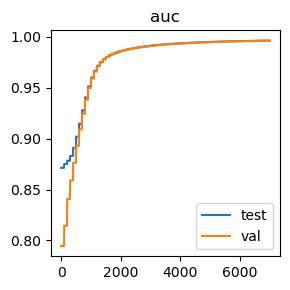

Last Validation Scores: {'auc': 0.9963557425192966}
Best Validation Scores: {'auc': 0.9963557425192966} at iterations {'auc': 6900}
Last Test Scores: {'auc': 0.996438985973191}
Best Test Scores: {'auc': 0.996438985973191} at iterations {'auc': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


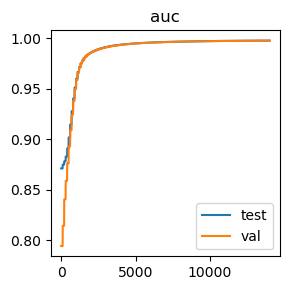

Last Validation Scores: {'auc': 0.9978217183171043}
Best Validation Scores: {'auc': 0.9978217183171043} at iterations {'auc': 13900}
Last Test Scores: {'auc': 0.9978518219028858}
Best Test Scores: {'auc': 0.9978518219028858} at iterations {'auc': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9978518219028858
val
key='auc': 0.9978217183171043


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 14:05:27 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 120,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 14000,
        "early_stop": 0
    }
}


/home/u

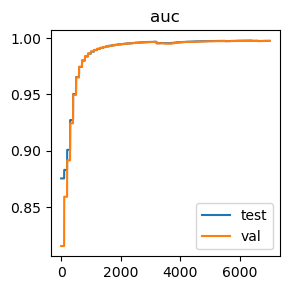

Last Validation Scores: {'auc': 0.9973883243271627}
Best Validation Scores: {'auc': 0.9975531077601173} at iterations {'auc': 6300}
Last Test Scores: {'auc': 0.997487718233159}
Best Test Scores: {'auc': 0.997693359654451} at iterations {'auc': 6300}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


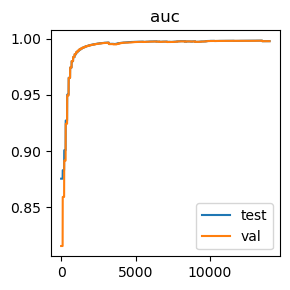

Last Validation Scores: {'auc': 0.9978705700325547}
Best Validation Scores: {'auc': 0.9983007500817549} at iterations {'auc': 13400}
Last Test Scores: {'auc': 0.9978783508969163}
Best Test Scores: {'auc': 0.99837427533352} at iterations {'auc': 13400}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9978783508969163
val
key='auc': 0.9978705700325547


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 14:15:21 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 4.9999999999999996e-06,
        "n_iter": 14000,
        "early_stop": 0
  

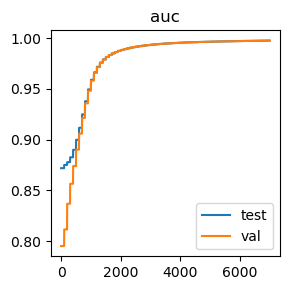

Last Validation Scores: {'auc': 0.9975443599737076}
Best Validation Scores: {'auc': 0.9975443599737076} at iterations {'auc': 6900}
Last Test Scores: {'auc': 0.9975836375343129}
Best Test Scores: {'auc': 0.9975836375343129} at iterations {'auc': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:386:::  
fit wrapper fit_feats, plotting state at iter 13999


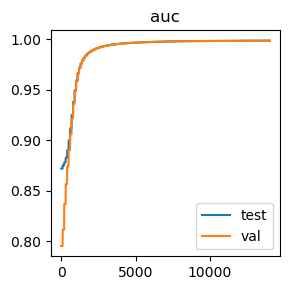

Last Validation Scores: {'auc': 0.9984923709125395}
Best Validation Scores: {'auc': 0.9984923709125395} at iterations {'auc': 13900}
Last Test Scores: {'auc': 0.9985200325252555}
Best Test Scores: {'auc': 0.9985200325252555} at iterations {'auc': 13900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9985200325252555
val
key='auc': 0.9984923709125395


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:335:::  
 2025-03-30 14:28:55 starting optimization of ieclam on ogbl-ddi on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 1e-05,
        "n_iter": 14000,
        "early_stop": 0
    }
}


/home/u

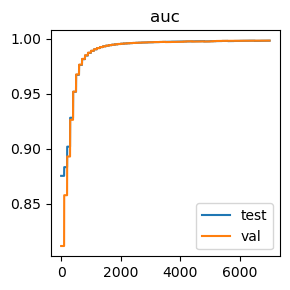

Last Validation Scores: {'auc': 0.9983873224763196}
Best Validation Scores: {'auc': 0.9983873224763196} at iterations {'auc': 6900}
Last Test Scores: {'auc': 0.9983027289175176}
Best Test Scores: {'auc': 0.9983027289175176} at iterations {'auc': 6900}


/home/user/Documents/danny/AAAI_pieclam/experiments/../clamiter.py:372:::  fit wrapper fit_feats error in iter_step at iter 13606: fufv has negative vals - crossed the potential wall at 0


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:437:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9985528135297849
val
key='auc': 0.9986887660004583


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:451:::  





/home/user/Documents/danny/AAAI_pieclam/experiments/optimization_utils.py:494:::  

Finished CrossVal!




In [ ]:
#DDI ieclam AUC
#DECIDE ON A MODEL AND DATASET
model_name = 'ieclam'
ds_name = 'ogbl-ddi'

# SET RANGE PARAMETERS
use_global_config_base = True
densify = False
attr_opt = False
test_p = 0.1
val_p = 0.0
n_reps = 1

'''to do cross validation, give a list of parameters for every one of the parameters as given in the following'''
dim_feats = [120, 170]
n_iters_feats = [14000] 
lr_feats = [5*1e-6, 1e-5]
l1_regs = [0.1, 0.5, 0.7]
s_regs = [0.0, 0.1]
range_triplets = [
    # ['clamiter_init','s_reg', s_regs],
    # ['clamiter_init','l1_reg', l1_regs],
    ['clamiter_init', 'dim_feat', dim_feats],
    ['feat_opt','n_iter', n_iters_feats],
    ['feat_opt','lr', lr_feats],
    ]

# if model_name in ['pclam', 'pieclam']:
#     range_triplets += [
#         ['back_forth', 'first_func_in_fit', first_funcs_in_fit],
#         ['prior_opt','n_iter', n_iters_prior],
#         ['prior_opt','lr', lr_prior],
#         ['prior_opt','noise_amp', noise_amps],
#         ['back_forth','n_back_forth', n_back_forth]
#     ]

'''another method is to give a list of perturbations to the base config'''
#! when i do the deltas the parameters arent saved
# deltas ={
# # 'clamiter_init': {'s_reg': 0.001,
# #                   'l1_reg': 0.001,
# #                   'dim_feat': 2},
# # 'feat_opt': {'n_iter': 50,
# #             'lr': 0.0000001},
# # 'prior_opt': {'n_iter': 50,
# #               'lr': 0.0000001,
# #               'noise_amp': 0.005},
# 'back_forth': {'scheduler_gamma' : 0.1}
# }

# range_triplets = ou.perturb_config('link_prediction',
#                                    ds_name, 
#                                    model_name, 
#                                    deltas, 
#                                    use_global_config=use_global_config_base)

#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
ou.cross_val_link(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=range_triplets,
    use_global_config_base=use_global_config_base,
    densify=densify,
    attr_opt=attr_opt,
    metric='auc',
    n_reps=n_reps,
    acc_every=100,
    device=device,
    plot_every= 7000
    )
#test that texas still works


In [ ]:
#DDI only on test dataset
#DECIDE ON A MODEL AND DATASET
model_name = 'ieclam'
ds_name = 'ogbl-ddi'

# SET RANGE PARAMETERS

densify = False
attr_opt = False
n_reps = 10

#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
ou.cross_val_link(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=[],
    use_global_config_base=False,
    densify=densify,
    attr_opt=attr_opt,
    metric='auc',
    n_reps=n_reps,
    acc_every=100,
    device=device,
    test_only=True,
    plot_every= -1
    #! add calculation type and finish the hAk function
    )

#todo: check how the run is going. GOING WELL! 
#todo: see that the hyper files are the same as in the paper
#todo: make slurm runs for ogb auc and h@20
#todo: anomaly detection see everything runs
#todo: UPLOAD TO GIT Asap
#todo: test script in jupyter notebook
#test that texas still works



/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/optimization_utils.py:131:::  True


/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../trainer.py:335:::  
 2025-04-30 01:52:35 starting optimization of ieclam on ogbl-ddi on device cpu

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 170,
        "s_reg": 0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 7e-06,
        "n_iter": 20000,
        "early_stop": 0
    }
}


/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../clamiter.py:364:::  staring fit_feats for 20000 iterations


/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/optimization_utils.py:520:::  

Finished CrossVal!




KeyboardInterrupt: 

## Texas

### ieClam

In [18]:
ou.empty_test('/home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/ieclam')

In [8]:
# TEXAS ieclam test

ou.cross_val_link_splits(
    ds_name='texas',
    model_name='ieclam',
    range_triplets=[],
    use_global_config_base=False,
    attr_opt=False,
    metric='auc',
    n_reps=10,
    acc_every=1000,
    device=device,
    plot_every= -1,
    test_only=True
    )




/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/optimization_utils.py:510:::  on test set /Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/results/link_prediction/auc/texas/ieclam, split4


Grid search:   0%|          | 0/1 [00:00<?, ?it/s]



/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/optimization_utils.py:642:::  Repetition no. 0


/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../trainer.py:335:::  
 2025-05-20 10:04:21 starting optimization of ieclam on texas on device cpu

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 50,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 3e-06,
        "n_iter": 13000,
        "early_stop": 0
    }
}


/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../clamiter.py:364:::  staring fit_feats for 13000 iterations


Grid search:   0%|          | 0/1 [00:04<?, ?it/s]



/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../trainer.py:452:::  
train_model_on_params on ieclam texas 
took 4.898457765579224 seconds


/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/optimization_utils.py:716:::  

Finished CrossVal!




KeyboardInterrupt: 

In [3]:
# TEXAS

#DDI ieclam h@20
#DECIDE ON A MODEL AND DATASET
model_name = 'ieclam'
ds_name = 'texas'

# SET RANGE PARAMETERS
use_global_config_base = True
densify = False
attr_opt = False
n_reps = 1

'''to do cross validation, give a list of parameters for every one of the parameters as given in the following'''
dim_feats = [120, 170]
n_iters_feats = [1000]
n_iters_prior = [1000]
n_back_forth = [2] 
lr_feats = [3e-6, 5*1e-6, 1e-5]
l1_regs = [0.1, 0.5, 0.7]
s_regs = [0.0, 0.1]
range_triplets = [
    # ['clamiter_init','s_reg', s_regs],
    # ['clamiter_init','l1_reg', l1_regs],
    ['clamiter_init', 'dim_feat', dim_feats],
    ['feat_opt','n_iter', n_iters_feats],
    ['feat_opt','lr', lr_feats],
    ]


#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
ou.cross_val_link_splits(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=range_triplets,
    use_global_config_base=False,
    attr_opt=attr_opt,
    metric='auc',
    n_reps=3,
    acc_every=100,
    device=device,
    val_p = 0.1,
    plot_every= 10000,
    test_only=False
    )
#test that texas still works




/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/optimization_utils.py:368:::  path to res: /Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/results/link_prediction/auc/texas/ieclam


/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/optimization_utils.py:374:::  on test set /Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/results/link_prediction/auc/texas/ieclam, split4


/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/optimization_utils.py:494:::  Repetition no. 0


/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/Users/danielzilberg/Documents/Learned_Graphon/ICML_PieClam_020425/experiments/../trainer.py:335:::  
 2025-05-14 13:06:33 starting optimization of ieclam on texas on device cpu

 configs_dict: 
{
    "clamiter_init"

KeyboardInterrupt: 

### PieClam


In [21]:
# TEXAS ieclam fck

ou.cross_val_link_splits(
    ds_name='texas',
    model_name='pieclam',
    range_triplets=[],
    use_global_config_base=False,
    attr_opt=False,
    metric='auc',
    n_reps=10,
    acc_every=1000,
    device=device,
    plot_every= -1,
    test_only=True
    )



/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:510:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split_09-03_03-05-25


Grid search:   0%|          | 0/1 [00:00<?, ?it/s]



/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:642:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-20 10:01:57 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 4e-06,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 2000,
        "lr": 5e-06,
        "noise_amp": 0.05,
        "weight_decay": 0.1,
        "early_stop": 0
    },
    "back_forth": {
        "n_back_forth": 7,
        "scheduler_step_size": 3,
        "scheduler_gamma": 0.5,
        

Grid search:   0%|          | 0/1 [00:05<?, ?it/s]



/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 5.752016305923462 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:716:::  

Finished CrossVal!




KeyboardInterrupt: 



/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:401:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split_09-03_03-05-25


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 02:58:04 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 4e-06,
        "n_iter": 2000,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 2000,
        "lr": 5e-

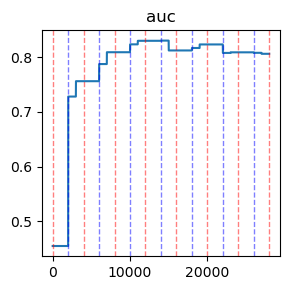



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.806115107913669
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 540.1709153652191 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 1


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 03:07:04 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

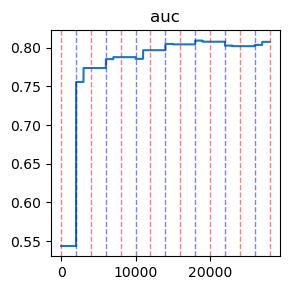



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8075539568345325
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.0938227176666 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 2


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 03:15:41 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

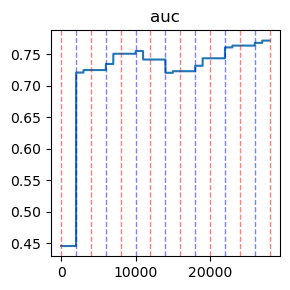



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7715827338129496
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 516.2352728843689 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 3


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 03:24:18 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

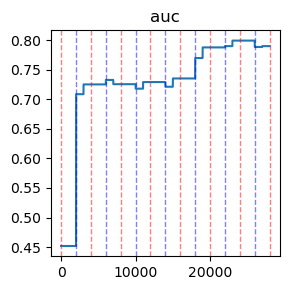



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7899280575539568
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 515.661877155304 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 4


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 03:32:53 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

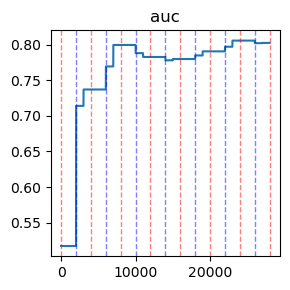



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8025179856115109
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.108149766922 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 5


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 03:41:31 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

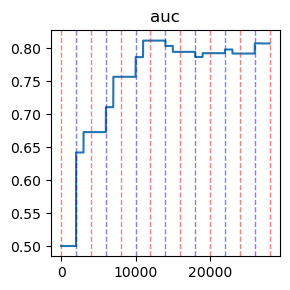



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8070143884892087
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 516.3265714645386 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 6


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 03:50:08 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

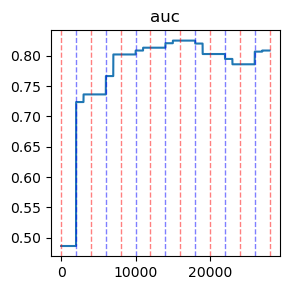



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8086330935251799
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.3964834213257 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 7


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 03:58:45 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

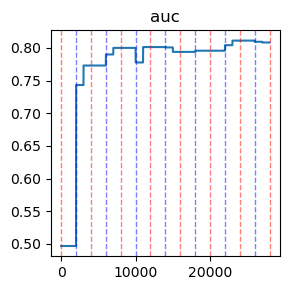



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8082733812949642
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.3175091743469 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 8


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 04:07:23 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

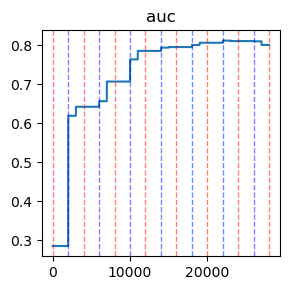



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8007194244604317
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.2244582176208 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 9


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 04:16:00 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

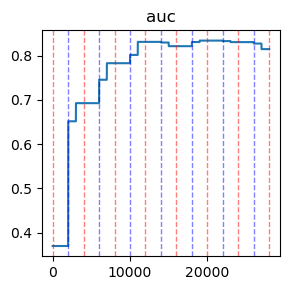



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.814568345323741
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.2899322509766 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:607:::  

Finished CrossVal!




/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:401:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split_16-15_02-05-25


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICM

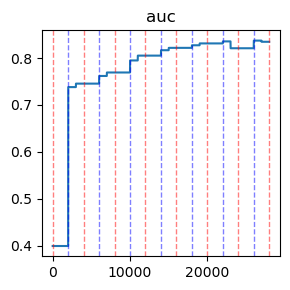



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8347721822541967
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.8742101192474 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 1


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 04:33:15 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

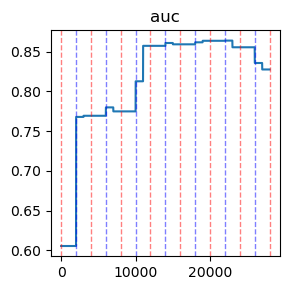



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8275779376498801
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.8291659355164 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 2


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 04:41:54 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

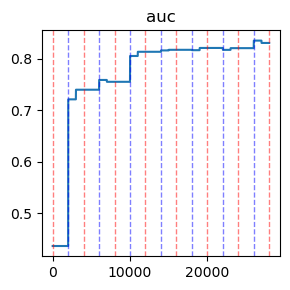



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8305755395683454
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.772997379303 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 3


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 04:50:32 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

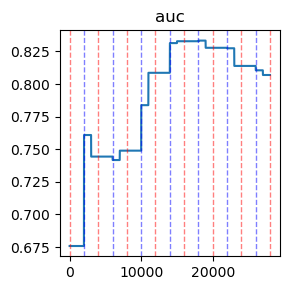



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8069544364508394
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.8694236278534 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 4


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 04:59:10 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

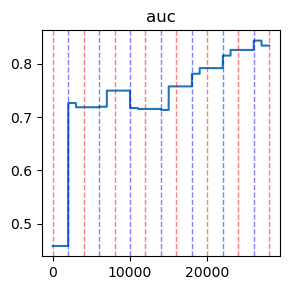



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8340527577937651
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.0525093078613 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 5


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 05:07:48 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

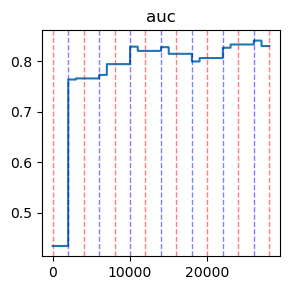



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8297362110311751
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.0410711765289 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 6


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 05:16:25 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

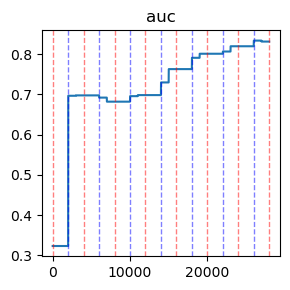



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8309352517985613
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.7548654079437 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 7


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 05:25:03 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

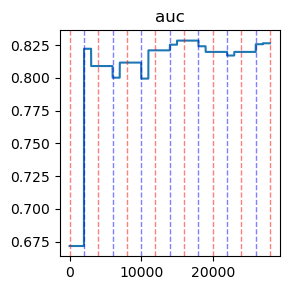



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8264988009592327
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 516.7934610843658 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 8


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 05:33:40 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

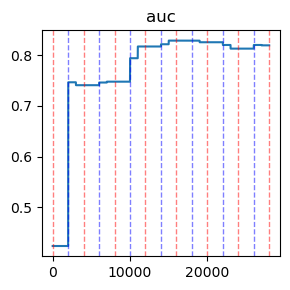



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8194244604316547
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.3794069290161 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 9


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 05:42:18 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

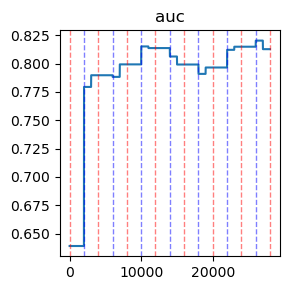



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8127098321342926
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.0725524425507 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:607:::  

Finished CrossVal!




/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:401:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split_00-10_02-05-25


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/IC

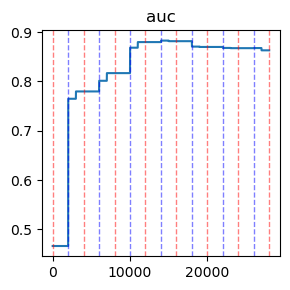



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8630772801113948
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.2307820320129 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 1


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 05:59:34 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

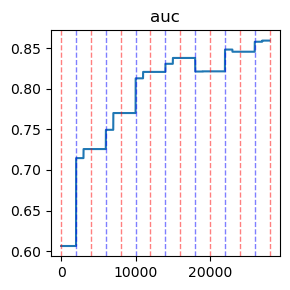



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8591320491993502
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.1461591720581 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 2


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 06:08:12 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

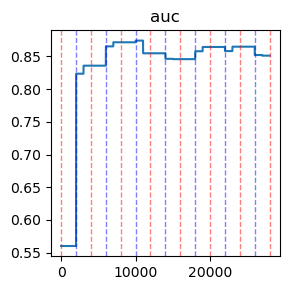



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8510095149686703
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.1584680080414 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 3


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 06:16:49 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

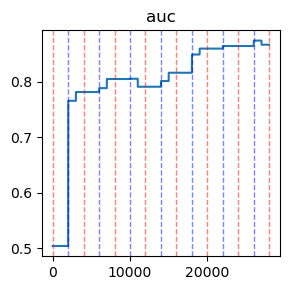



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8667904386168485
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.4391496181488 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 4


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 06:25:27 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

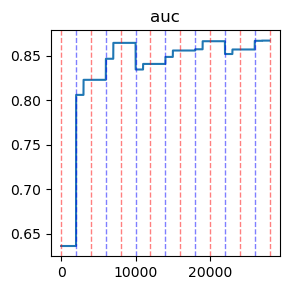



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8670225110234393
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.0678708553314 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 5


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 06:34:04 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

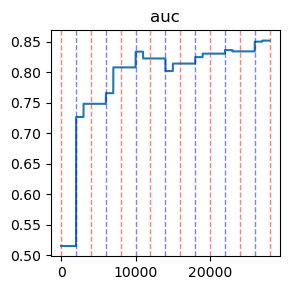



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8517057321884428
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.3292810916901 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 6


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 06:42:42 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

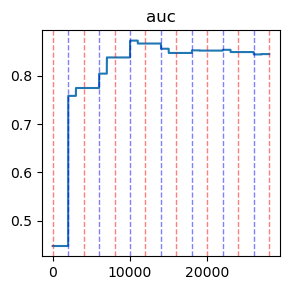



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8445114875841263
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.2867114543915 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 7


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 06:51:19 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

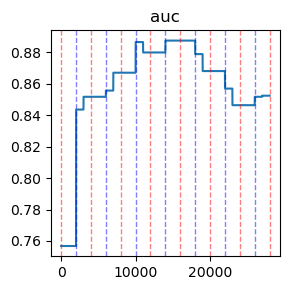



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8524019494082153
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.3649201393127 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 8


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 06:59:56 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

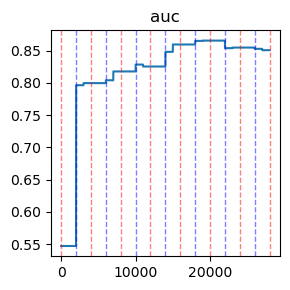



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8507774425620793
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.7827394008636 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 9


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 07:08:35 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

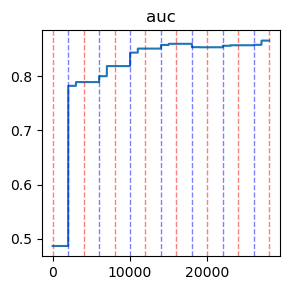



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8655140403805989
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.7514405250549 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:607:::  

Finished CrossVal!




/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:401:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split_16-39_02-05-25


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/IC

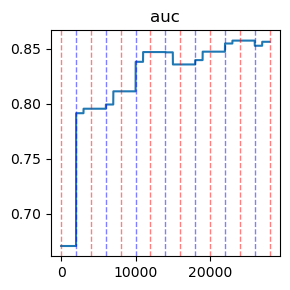



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8563549160671463
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.5304760932922 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 1


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 07:25:53 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

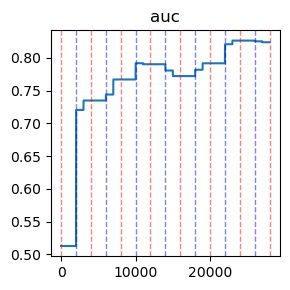



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8237410071942447
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.4502484798431 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 2


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 07:34:31 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

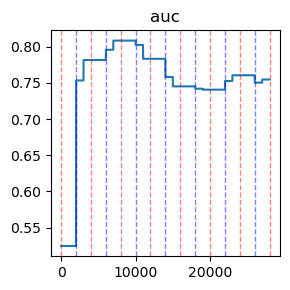



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7547961630695443
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.7328016757965 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 3


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 07:43:09 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

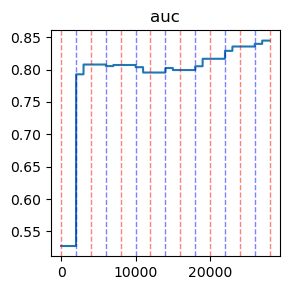



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8446043165467626
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.1380412578583 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 4


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 07:51:47 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

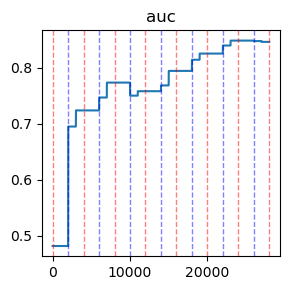



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8458033573141488
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.7426710128784 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 5


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 08:00:25 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

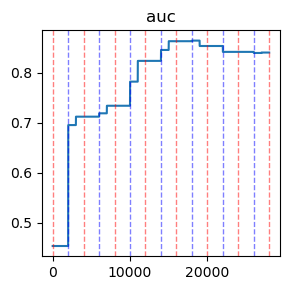



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8399280575539568
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.9581882953644 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 6


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 08:09:04 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

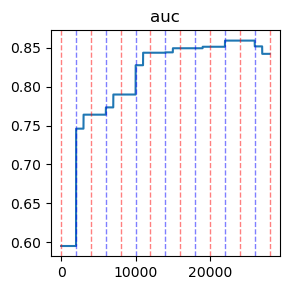



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8422062350119904
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.7957398891449 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 7


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 08:17:42 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

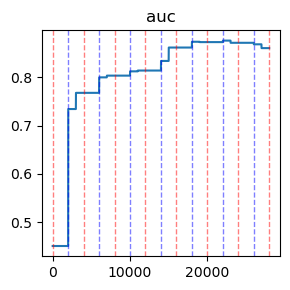



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8609112709832134
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.2858512401581 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 8


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 08:26:20 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

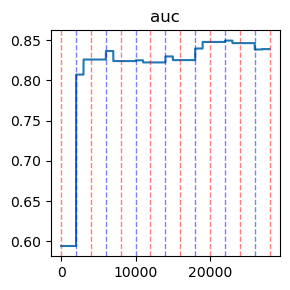



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8388489208633092
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.6318943500519 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 9


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 08:34:59 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

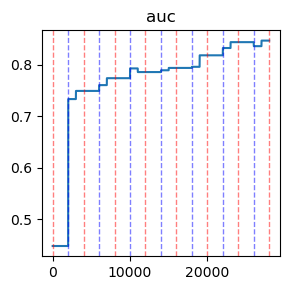



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8467625899280576
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.9783089160919 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:607:::  

Finished CrossVal!




/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:401:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split1


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/exp

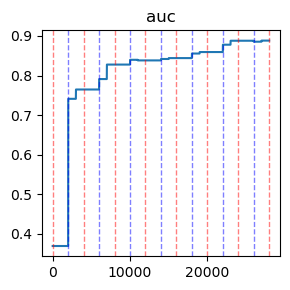



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8883219006190396
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.4936082363129 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 1


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 08:52:17 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

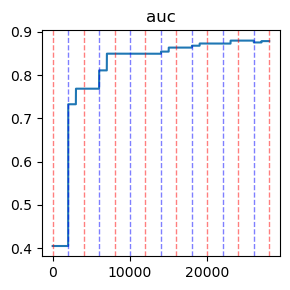



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.878785343817969
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.1317477226257 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 2


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 09:00:55 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

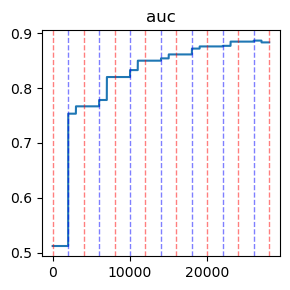



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8832190061903965
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.5298359394073 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 3


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 09:09:33 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

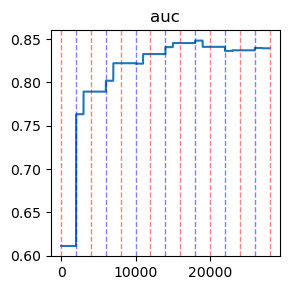



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8393843065082817
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.4881329536438 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 4


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 09:18:11 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

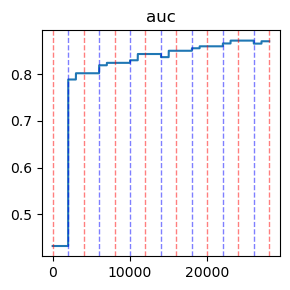



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8703362891082482
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.2636456489563 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 5


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 09:26:49 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

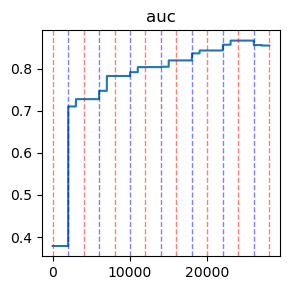



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8551949138363727
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.9895117282867 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 6


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 09:35:27 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

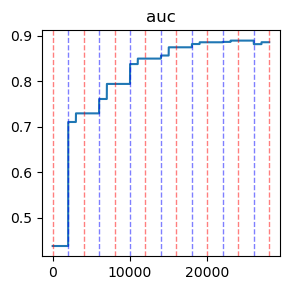



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8858959344152586
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.8439791202545 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 7


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 09:44:05 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

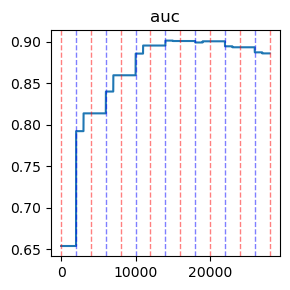



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8859795884222854
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.0123813152313 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 8


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 09:52:43 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

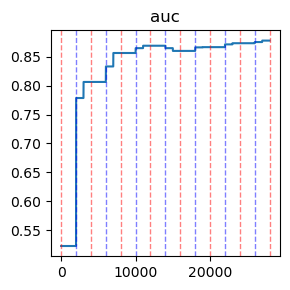



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8776978417266187
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.6605837345123 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 9


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 10:01:21 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

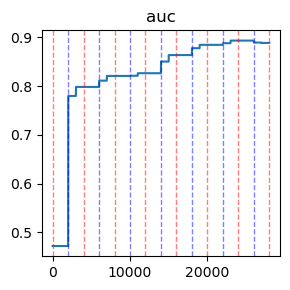



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8888238246612015
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.3197104930878 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:607:::  

Finished CrossVal!




/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:401:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split_03-26_02-05-25


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/IC

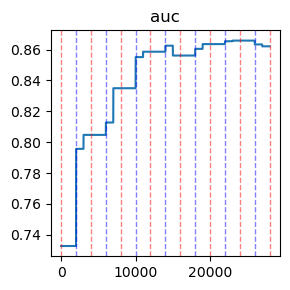



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8620760534429599
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.9019601345062 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 1


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 10:18:37 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

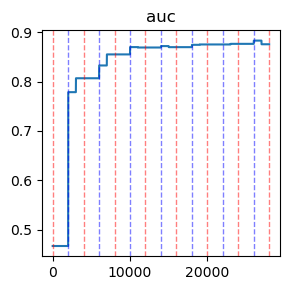



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8754367934224049
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.9052767753601 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 2


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 10:27:16 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

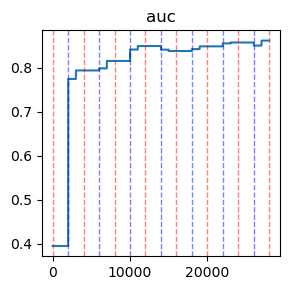



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8612538540596094
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 518.5002436637878 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 3


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 10:35:55 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

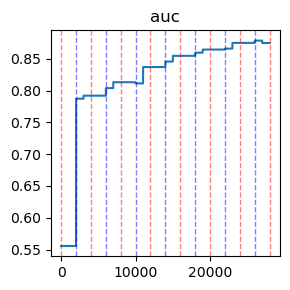



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8748201438848922
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.770425081253 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 4


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 10:44:33 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

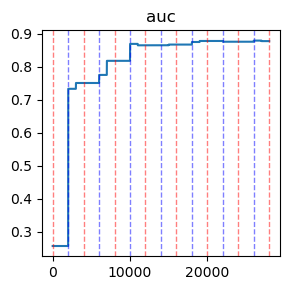



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8779033915724562
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 517.7366874217987 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 5


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 10:53:11 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

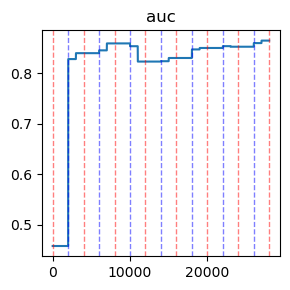



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8643371017471737
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 550.4040484428406 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 6


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 11:02:21 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

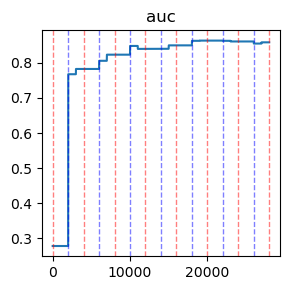



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8583761562178828
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 552.8137319087982 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 7


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 11:11:34 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

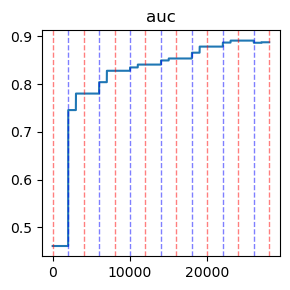



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8873586844809866
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 554.7644395828247 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 8


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 11:20:49 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

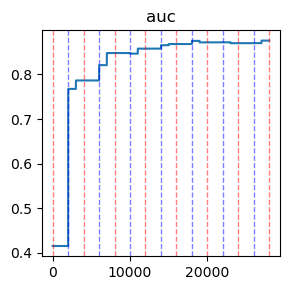



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8757451181911614
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 555.0200550556183 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 9


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 11:30:04 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

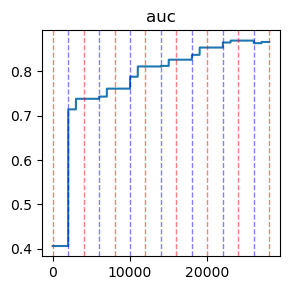



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8655704008221993
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 555.4193525314331 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:607:::  

Finished CrossVal!




/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:401:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split_22-15_28-04-25


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/IC

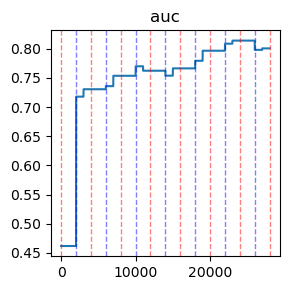



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8006771053745239
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 555.8540003299713 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 1


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 11:48:36 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

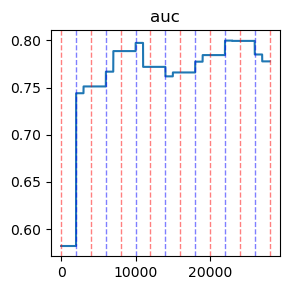



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7777190012695725
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 555.6001625061035 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 2


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 11:57:51 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

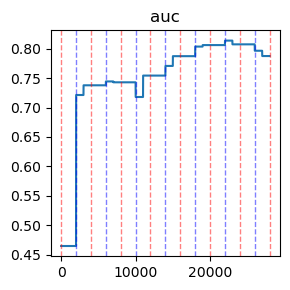



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7875581887431232
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 556.5123245716095 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 3


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 12:07:08 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

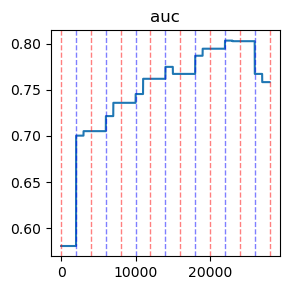



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7583580194667794
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 555.2241456508636 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 4


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 12:16:23 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

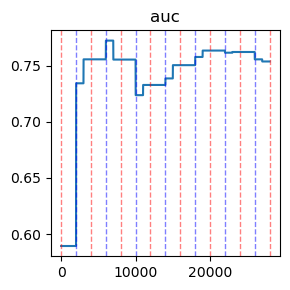



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7539145154464664
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 555.7114284038544 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 5


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 12:25:39 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

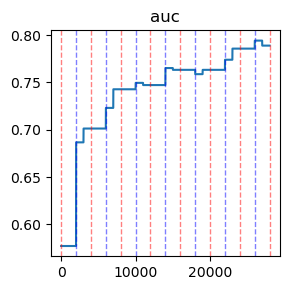



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7888277613203555
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 551.3217504024506 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 6


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 12:34:50 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

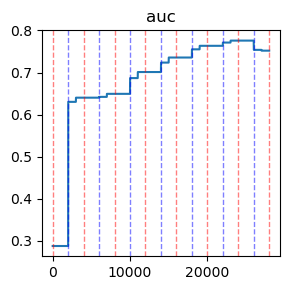



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7520101565806179
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 547.7724010944366 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 7


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 12:43:58 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

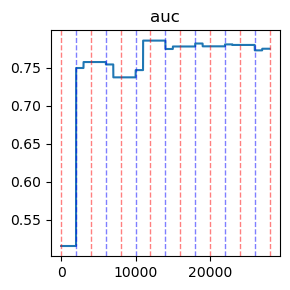



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7747566652560305
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 547.994086265564 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 8


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 12:53:06 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

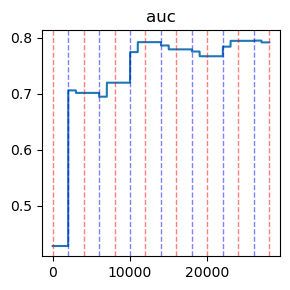



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.791578501904359
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 547.434488773346 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 9


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 13:02:14 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling

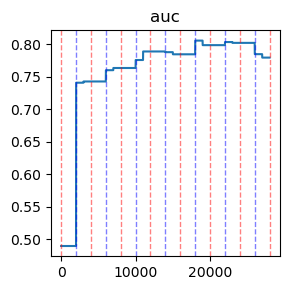



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7794117647058822
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 554.2590043544769 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:607:::  

Finished CrossVal!




/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:401:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split_23-59_07-05-25


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/IC

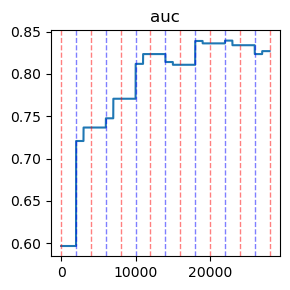



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8269021146718989
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 554.2061667442322 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 1


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 13:20:42 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

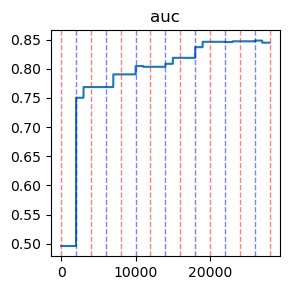



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8447787224765642
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 548.6437420845032 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 2


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 13:29:51 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

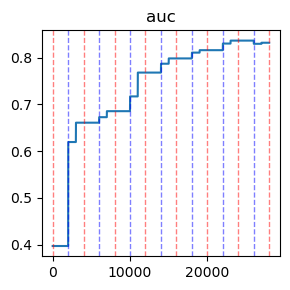



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8319162851536953
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 539.3166952133179 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 3


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 13:38:50 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

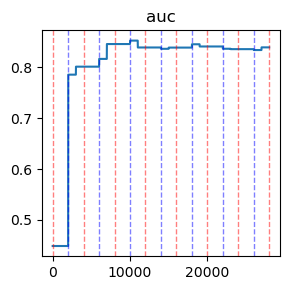



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8393285371702638
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 523.575826883316 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 4


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 13:47:34 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

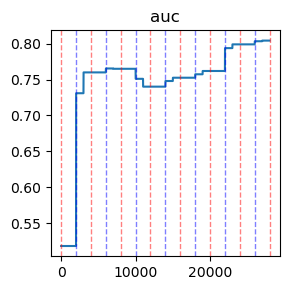



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8042293437976892
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 524.4446806907654 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 5


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 13:56:19 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

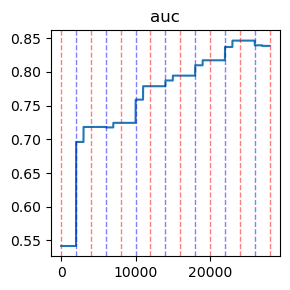



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8386745149335078
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 523.934264421463 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 6


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 14:05:03 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

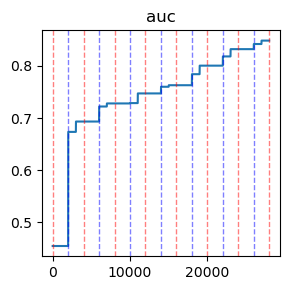



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8482668410725964
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 526.3387744426727 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 7


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 14:13:49 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

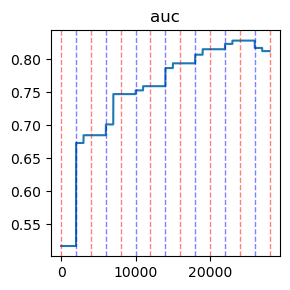



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8122956180510137
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 525.4334564208984 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 8


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 14:22:34 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

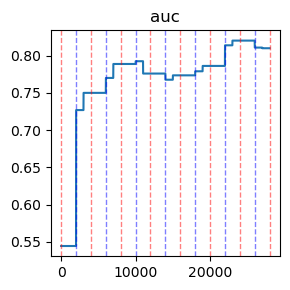



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8101155439284936
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 525.3142173290253 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 9


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 14:31:20 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

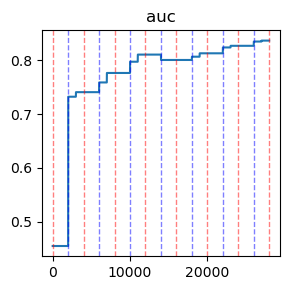



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8370394593416177
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 539.8467960357666 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:607:::  

Finished CrossVal!




/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:401:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split_22-13_28-04-25


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/IC

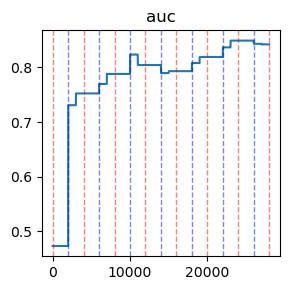



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8422595257127632
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 535.898012638092 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 1


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 14:49:16 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

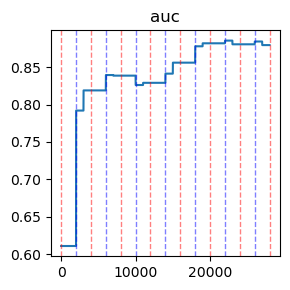



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8792965627498001
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 526.4171717166901 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 2


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 14:58:02 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

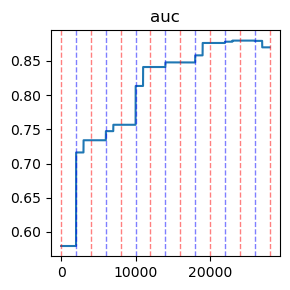



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.869970690114575
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 523.9609100818634 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 3


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 15:06:46 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

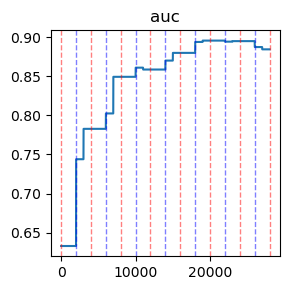



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8846256328270716
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 523.3190784454346 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 4


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 15:15:30 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

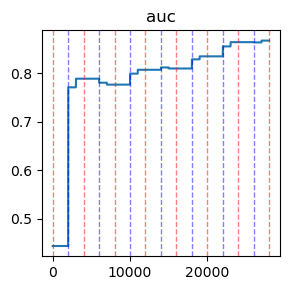



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8678390620836663
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 523.0747611522675 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 5


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 15:24:13 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

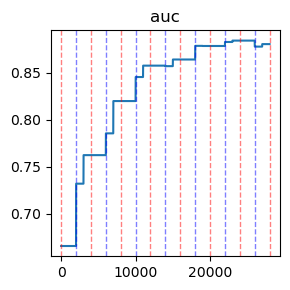



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8804956035171863
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 547.2008113861084 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 6


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 15:33:20 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

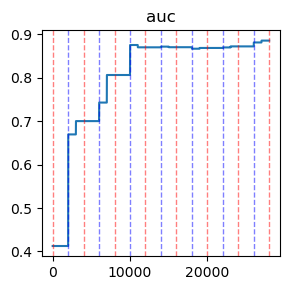



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8851585398347988
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 545.7311060428619 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 7


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 15:42:26 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

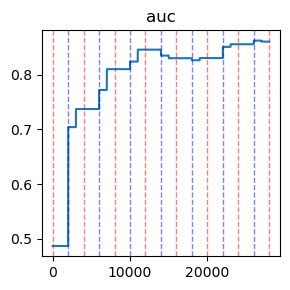



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.86064481747935
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 548.2008497714996 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 8


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 15:51:34 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling

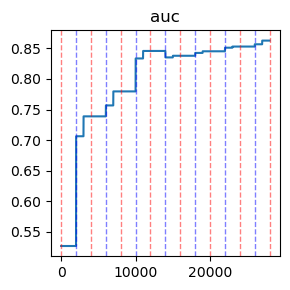



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8626432187583266
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 548.1188549995422 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 9


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 16:00:42 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

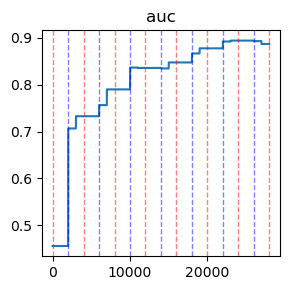



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8870237143618439
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 548.0028505325317 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:607:::  

Finished CrossVal!




/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:401:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split_16-25_02-05-25


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/IC

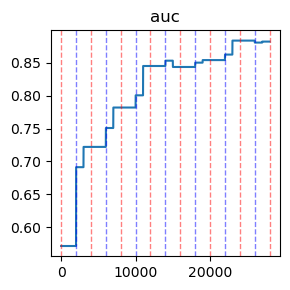



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8824940047961631
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 545.48495221138 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 1


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 16:18:56 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling

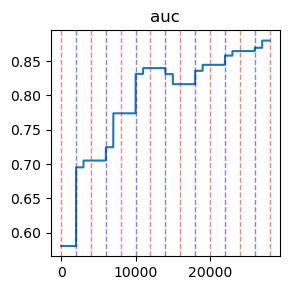



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.880095923261391
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 549.1208288669586 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 2


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 16:28:05 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

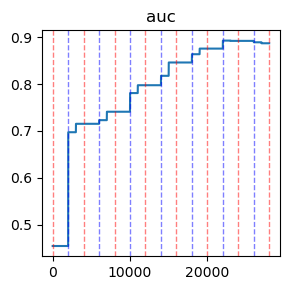



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8872901678657075
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 545.3131551742554 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 3


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 16:37:11 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

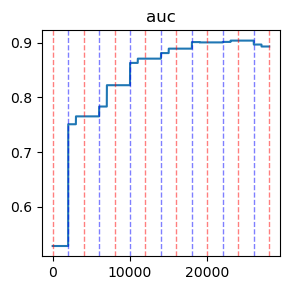



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8929856115107914
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 543.3554172515869 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 4


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 16:46:14 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

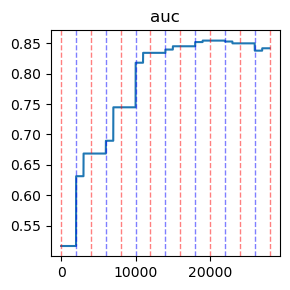



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8414268585131894
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 543.7678623199463 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 5


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 16:55:18 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

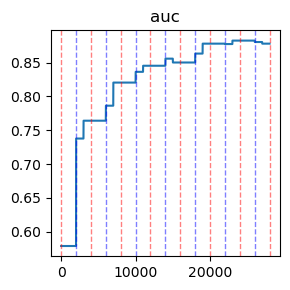



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8779976019184653
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 544.3713555335999 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 6


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 17:04:22 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

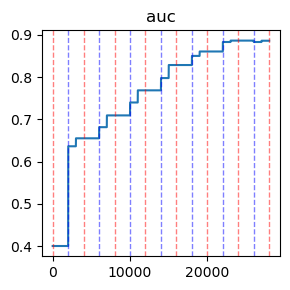



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8863908872901679
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 556.5372493267059 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 7


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 17:13:39 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

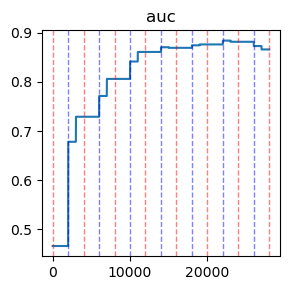



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8660071942446044
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 555.1210470199585 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 8


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 17:22:54 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

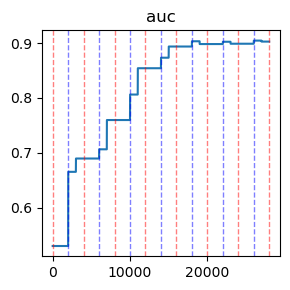



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9025779376498801
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 555.9980888366699 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 9


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 17:32:10 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

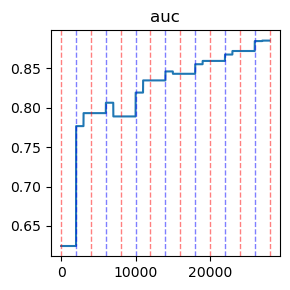



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8851918465227818
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 556.1426270008087 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:607:::  

Finished CrossVal!




/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:401:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split_03-16_02-05-25


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/IC

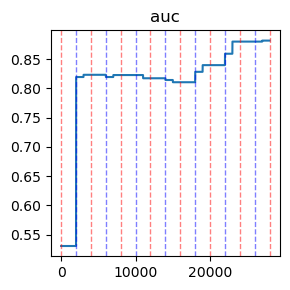



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8815065594583157
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 555.3559885025024 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 1


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 17:50:42 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

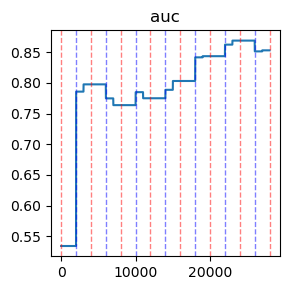



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8531527719001268
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 555.7550685405731 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 2


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 17:59:58 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

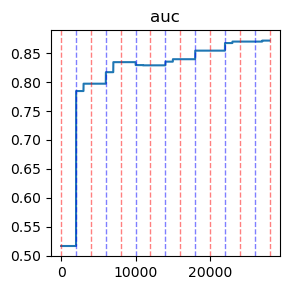



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8717731696995346
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 555.228821516037 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 3


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 18:09:13 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

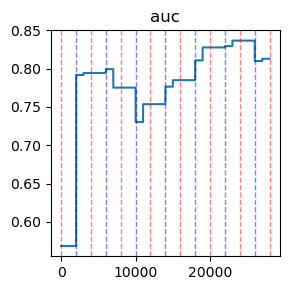



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8129496402877697
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 547.1280107498169 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 4


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 18:18:20 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

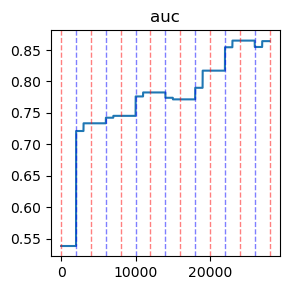



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8641557342361404
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 546.1235961914062 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 5


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 18:27:27 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

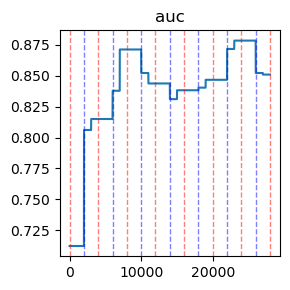



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8510368176047397
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 546.4747982025146 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 6


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 18:36:33 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

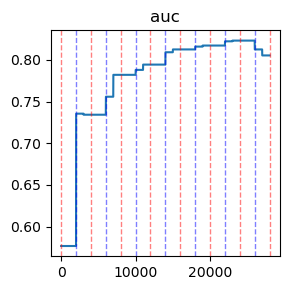



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8053322048243758
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 546.0489678382874 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 7


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 18:45:39 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

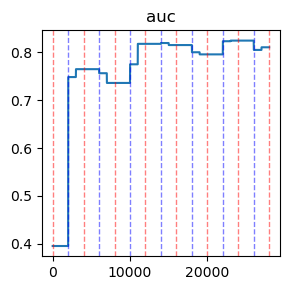



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8104104951333051
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 546.1258571147919 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 8


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 18:54:45 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

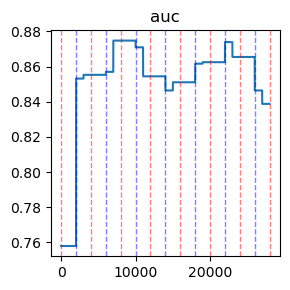



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8387642826914938
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 545.6487684249878 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 9


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 19:03:51 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

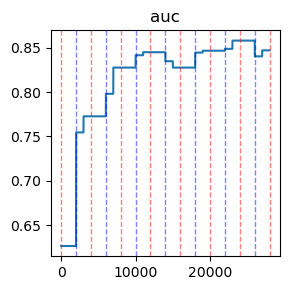



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8472280998730427
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 546.1989014148712 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:607:::  

Finished CrossVal!




/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:401:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split_09-21_03-05-25


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/IC

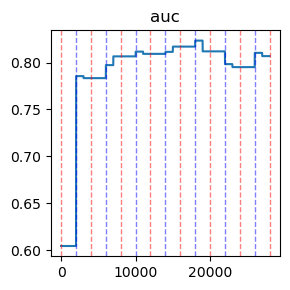



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8068212096989076
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 547.2640981674194 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 1


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 19:22:05 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

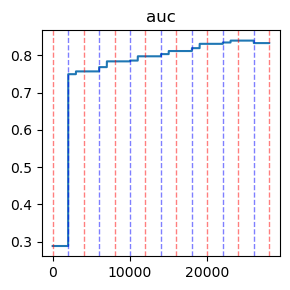



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.832933653077538
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 547.4270393848419 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 2


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 19:31:12 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

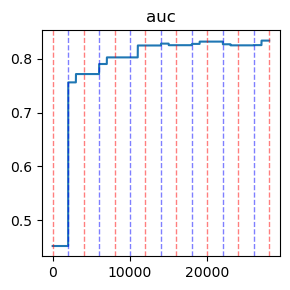



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8334665600852651
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 545.962507724762 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 3


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 19:40:18 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

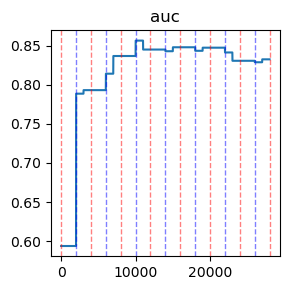



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8326671995736744
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 546.4775006771088 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 4


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 19:49:25 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

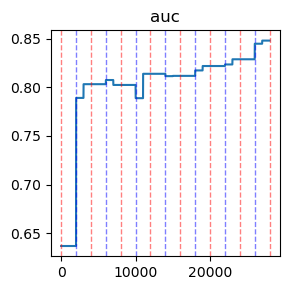



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8478550492938982
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 550.6393692493439 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 5


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 19:58:36 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

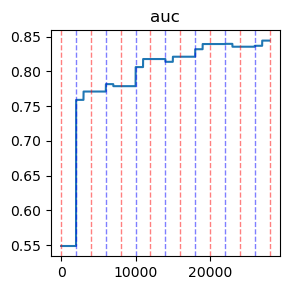



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8443911537436717
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 552.138091802597 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 6


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 20:07:48 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

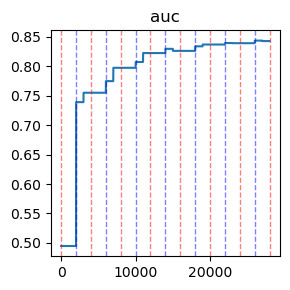



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.842925659472422
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 712.9264459609985 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 7


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 20:19:41 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

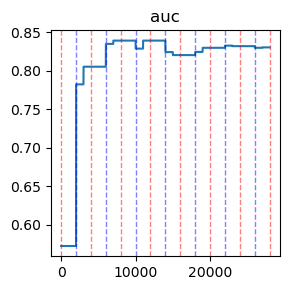



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8302691180389021
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 600.0028328895569 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 8


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 20:29:41 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

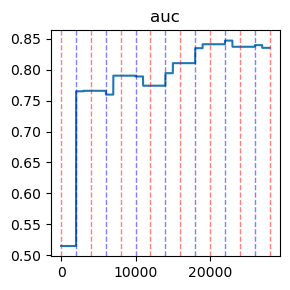



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8355981881161737
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 545.4166924953461 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 9


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 20:38:47 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

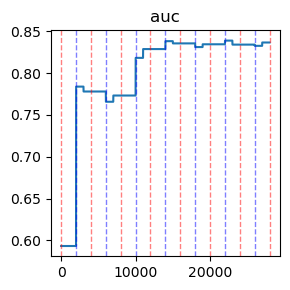



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.836664002131628
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 704.3024570941925 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:607:::  

Finished CrossVal!




/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:401:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split_19-23_02-05-25


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICM

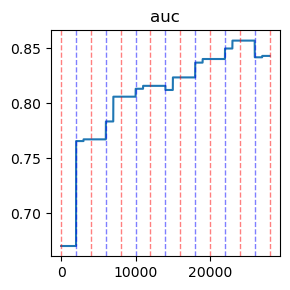



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8428213950578669
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 545.364734172821 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 1


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 20:59:37 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

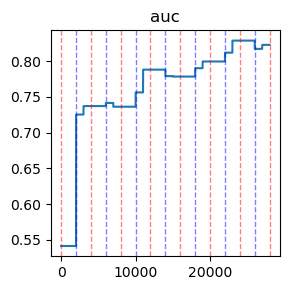



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8229590240850797
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 546.0511131286621 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 2


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 21:08:43 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

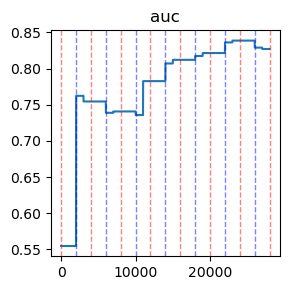



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8270253362527369
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 544.6642153263092 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 3


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 21:17:47 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

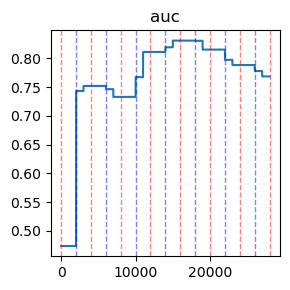



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7685329996872067
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 524.7476720809937 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 4


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 21:26:32 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

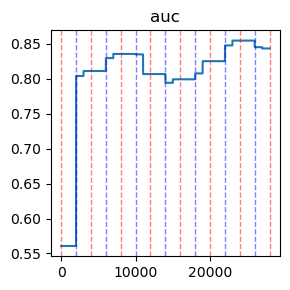



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8432905849233656
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 522.9997549057007 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 5


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 21:35:15 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

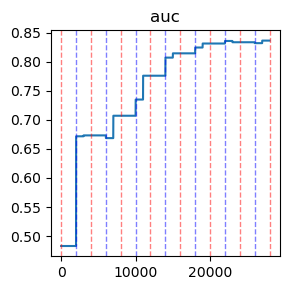



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8360963403190491
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 522.6175549030304 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 6


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 21:43:58 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

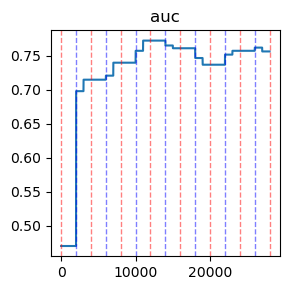



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7563340631842352
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 523.6328191757202 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 7


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 21:52:42 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

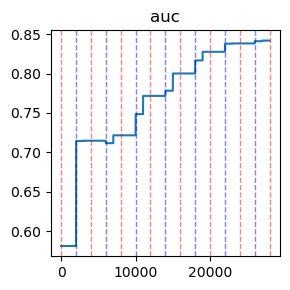



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.841883015326869
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 771.6259026527405 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 8


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 22:05:34 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

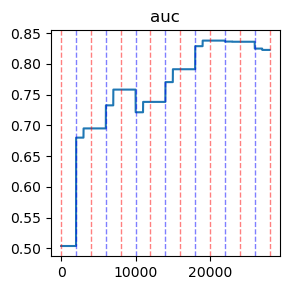



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8228026274632468
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 827.9036128520966 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 9


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 22:19:22 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

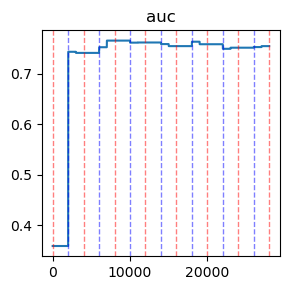



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7550828902095715
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 555.7987649440765 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:607:::  

Finished CrossVal!




/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:401:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split_00-08_02-05-25


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/IC

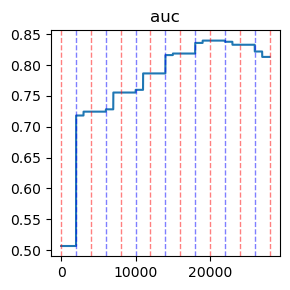



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8131060369096028
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 546.1663465499878 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 1


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 22:37:44 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

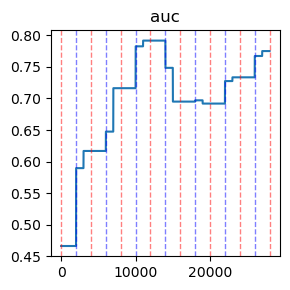



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7751016578041915
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 623.2872705459595 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 2


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 22:48:07 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

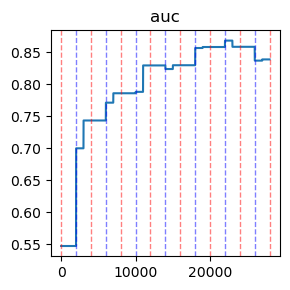



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8389114795120425
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 549.8628885746002 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 3


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 22:57:17 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

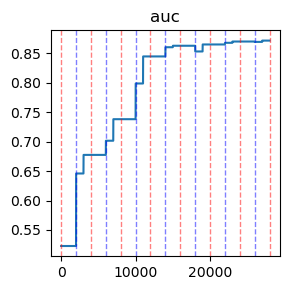



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8717547700969659
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 547.7879469394684 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 4


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 23:06:25 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

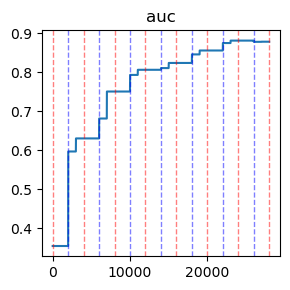



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8780106349702848
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 547.8607861995697 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 5


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 23:15:33 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

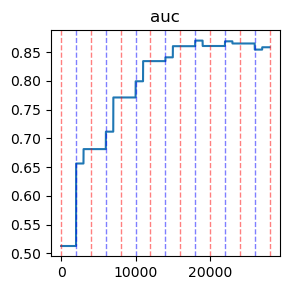



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8583046606193305
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 547.5096752643585 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 6


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 23:24:40 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

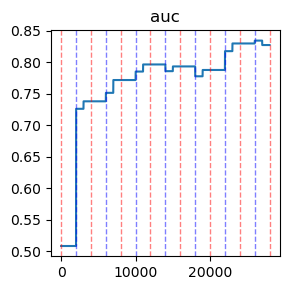



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.827494526118236
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 547.6896262168884 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 7


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 23:33:48 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

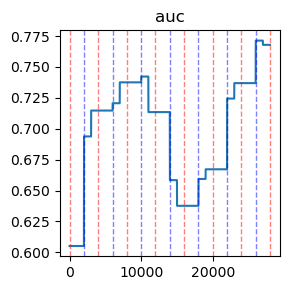



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.7679074131998749
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 676.3648583889008 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 8


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 23:45:05 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

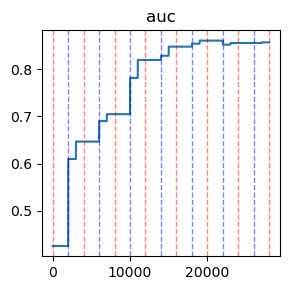



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8570534876446668
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 818.1122541427612 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 9


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-17 23:58:43 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

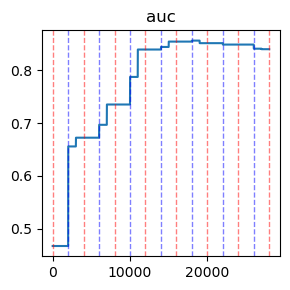



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8401626524867063
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 694.1902368068695 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:607:::  

Finished CrossVal!




/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:401:::  on test set /home/user/Documents/danny/ICML_pieclam/experiments/results/link_prediction/auc/texas/pieclam, split_09-05_03-05-25


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 0


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/IC

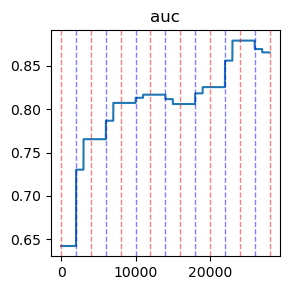



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8656217882836588
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 523.0844638347626 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 1


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-18 00:19:01 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

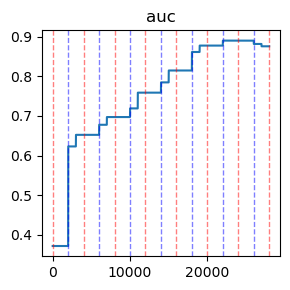



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8761562178828366
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 524.3703904151917 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 2


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-18 00:27:45 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

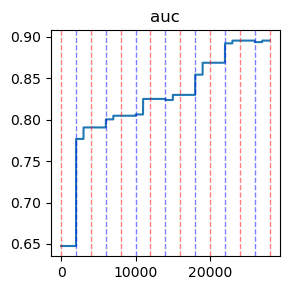



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.895426515930113
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 523.7333498001099 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 3


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-18 00:36:29 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

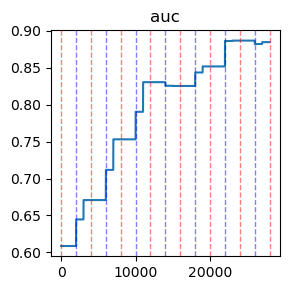



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8846351490236383
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 523.1274516582489 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 4


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-18 00:45:12 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

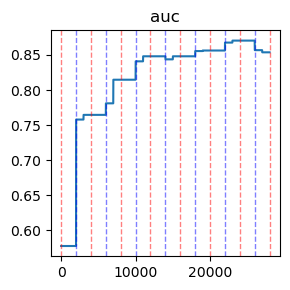



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8538026721479959
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 523.973837852478 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 5


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-18 00:53:56 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_couplin

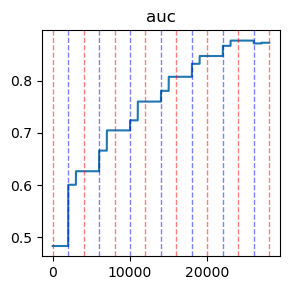



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8728160328879753
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 524.0783038139343 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 6


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-18 01:02:40 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

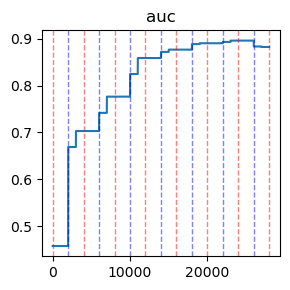



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8825796505652621
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 539.7102329730988 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 7


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-18 01:11:40 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

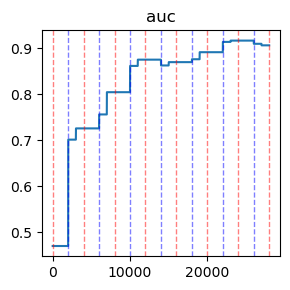



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.9062178828365879
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 550.8288993835449 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 8


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-18 01:20:51 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

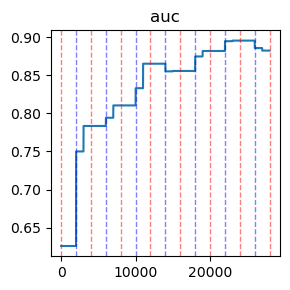



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8823227132579651
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 552.8189613819122 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:533:::  Repetition no. 9


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:161:::  
Using dataset specific configuration and not global 




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:335:::  
 2025-05-18 01:30:04 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 22,
        "dim_attr": 100,
        "s_reg": 0.0,
        "l1_reg": 1,
        "T": 1,
        "hidden_dim": 64,
        "num_coupli

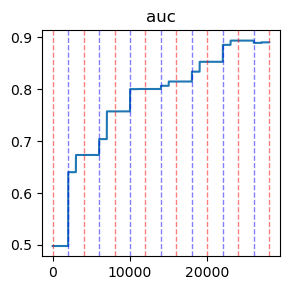



/home/user/Documents/danny/ICML_pieclam/experiments/../clamiter.py:704:::  
fit end, no early stopping


/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:436:::  


FINISHED train 
 last accuracies:
test
key='auc': 0.8905447070914697
val
auc: None




/home/user/Documents/danny/ICML_pieclam/experiments/../trainer.py:452:::  
train_model_on_params on pieclam texas 
took 551.6878848075867 seconds


/home/user/Documents/danny/ICML_pieclam/experiments/optimization_utils.py:607:::  

Finished CrossVal!




In [20]:
# TEXAS ieclam test

ou.cross_val_link_splits(
    ds_name='texas',
    model_name='pieclam',
    range_triplets=[],
    use_global_config_base=False,
    attr_opt=False,
    metric='auc',
    n_reps=10,
    acc_every=1000,
    device=device,
    plot_every= -1,
    test_only=True
    )

In [10]:
#TEXAS crossval
#DECIDE ON A MODEL AND DATASET


# First find parameters on the validation set and use these parameters to train on the training U validation set

model_name = 'pieclam'
ds_name = 'texas'


# SET RANGE PARAMETERS
use_global_config_base = True
densify = False
attr_opt = False
test_p = 0.1
val_p = 0.05
n_reps = 10

'''to do cross validation, give a list of parameters for every one of the parameters as given in the following. There is also an option to use the global parameter configuration as shown below. each field is a list of values for that variable'''
# range_triplets = [
#     ['clamiter_init','s_reg', s_regs],
#     ['clamiter_init','l1_reg', l1_regs],
#     ['clamiter_init', 'dim_feat', dim_feats],
#     ['feat_opt','n_iter', n_iters_feats],
#     ['feat_opt','lr', lr_feats],
# ]

# if model_name in ['pclam', 'pieclam']:
#     range_triplets += [
#         ['back_forth', 'first_func_in_fit', first_funcs_in_fit],
#         ['prior_opt','n_iter', n_iters_prior],
#         ['prior_opt','lr', lr_prior],
#         ['prior_opt','noise_amp', noise_amps],
#         ['back_forth','n_back_forth', n_back_forth]
#     ]

'''another method is to give a list of perturbations to the base config from which you get the range triplets for the cross val'''

deltas ={
'clamiter_init': {'s_reg': 0.001,
                  'l1_reg': 0.001,
                  'dim_feat': 2},
'feat_opt': {'n_iter': 50,
            'lr': 0.0000001},
'prior_opt': {'n_iter': 50,
              'lr': 0.0000001,
              'noise_amp': 0.005},
'back_forth': {'scheduler_gamma' : 0.1}
}

range_triplets = ou.perturb_config('anomaly_unsupervised', 
                                   model_name, 
                                   deltas, 
                                   use_global_config=use_global_config_base)

range_triplets += [
                    ['back_forth', 'n_back_forth',[1]]
                ]


#RUN CROSS VALIDATION ON THE DATASET WITH THE MODEL
# accuracy change
# 
#todo: ACCURACY: add metric variable and collect test and val values according to it

#todo: if it's a validation task save to validation folder if it's a test task save to test folder
#todo: add the metric folder split. /results/task/data/model/metric/test or val

#! this needs to be changed in anomaly detection as well!
ou.cross_val_link(
    ds_name=ds_name,
    model_name=model_name,
    range_triplets=range_triplets,
    use_global_config_base=use_global_config_base,
    densify=densify,
    attr_opt=attr_opt,
    metric='auc',
    test_p=test_p,
    val_p=0.0,
    n_reps=n_reps,
    device=device,
    verbose=True,
    verbose_in_funcs=False
    )




/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:320:::  
 2025-03-29 17:42:47 starting optimization of pieclam on texas on device cuda

 configs_dict: 
{
    "clamiter_init": {
        "dim_feat": 28,
        "dim_attr": 100,
        "s_reg": 0,
        "l1_reg": 0.999,
        "T": 1,
        "hidden_dim": 64,
        "num_coupling_blocks": 32,
        "num_layers_mlp": 2
    },
    "feat_opt": {
        "lr": 2.9e-06,
        "n_iter": 450,
        "early_stop": 0
    },
    "prior_opt": {
        "n_iter": 1250,
        "lr": 1.9e-06,
        "noise_amp": 0.045000000000000005,
        "weight_decay": 0.1,
        "early_stop": 0
    },
    "back_forth": {
        "n_back_forth": 1,
        "scheduler_step_size": 3,
        "scheduler_gamma": 0.4,
        "early_stop_fit": 0,
        "first_func_in_fit": "fit_feats"
    }
}


/home/user/Documents/danny/AAAI_pieclam/experiments/../trainer.py:326:::  
 train_model_on_params, initializing feats with small_gaus


/hom

KeyboardInterrupt: 